# ChickenScratch Training Data Processor

The goal of the Training Data Processor is to ensure all of our training data is in the same format. That is, all samples must be a 13x18 grayscale png image. To achieve this, we have created a series of sample collection sheets like the one seen below that we will be handing out to people we know as well as the class in the hopes of collecting as much data as we can.

<img src="./Sample Sheets/Sample Sheet A-O.png" />

We will be using the Pillow Library for image manipulation.

In [2]:
from PIL import Image, ImageDraw, ImageFilter
import os
import math
import json
from types import SimpleNamespace
from os.path import exists

### Vector Math Functions

In [3]:
# Subtract v2 from v1
def sub(v1, v2):
    return (v1[0] - v2[0], v1[1] - v2[1])

# Distance between two vectors
def distance(v1, v2):
    return math.sqrt((v2[0] - v1[0]) * (v2[0] - v1[0]) + (v2[1] - v1[1]) * (v2[1] - v1[1]))

#Normalizes a vector
def vectorNormalize(v):
    length = math.sqrt(v[0] * v[0] + v[1] * v[1])
    return (v[0]/length, v[1]/length)

#Generates a range of positions along a line traversed by an input vector
def vectorRange(xy, v, count, dist):
    vals = []
    intv = int(dist/count + 0.5)
    
    if intv < 1:
        intv = 1
    
    for i in range(0, dist, intv):
        vals.append((xy[0] + v[0]*i, xy[1] + v[1]*i))
    return vals

### Debug Drawing Functions

In [4]:
# Draw lines on the provided image showing bounds and cell bounds
def drawConfigDebug(img, x1, y1, x2, y2, x3, y3, x4, y4, ccx, ccy, lt):
    img1 = img.convert(mode="RGB")
    r = 8
    draw = ImageDraw.Draw(img1)
    
    draw.ellipse((x1-r, y1-r, x1+r, y1+r), fill = 'red')
    draw.ellipse((x2-r, y2-r, x2+r, y2+r), fill = 'red')
    draw.ellipse((x3-r, y3-r, x3+r, y3+r), fill = 'red')
    draw.ellipse((x4-r, y4-r, x4+r, y4+r), fill = 'red')
    
    v1 = vectorNormalize((x2-x1, y2-y1)) # Vector from top left to top right
    v2 = vectorNormalize((x4-x3, y4-y3)) # Vector from bottom left to bottom right
    v3 = vectorNormalize((x3-x1, y3-y1)) # Vector from top left to bottom left
    v4 = vectorNormalize((x4-x2, y4-y2)) # Vector from top right to bottom right
    
    v1set = vectorRange((x1, y1), v1, ccx, int(distance((x1, y1), (x2, y2))))
    v2set = vectorRange((x3, y3), v2, ccx, int(distance((x3, y3), (x4, y4))))
    for i in range(0, ccx):
        draw.line([v1set[i], v2set[i]], fill='green', width=2)
        
    v3set = vectorRange((x1, y1), v3, ccy, int(distance((x1, y1), (x3, y3))))
    v4set = vectorRange((x2, y2), v4, ccy, int(distance((x2, y2), (x4, y4))))
    for i in range(0, ccy):
        draw.line([v3set[i], v4set[i]], fill='green', width=2)
    
    draw.line((x1, y1, x2, y2), fill='red', width=3)
    draw.line((x2, y2, x4, y4), fill='red', width=2)
    draw.line((x1, y1, x3, y3), fill='red', width=2)
    draw.line((x3, y3, x4, y4), fill='red', width=2)
    
    return img1

# Draw dots on the corners of each cell
def drawCellsDebug(img, cells):
    img1 = img.convert(mode="RGB")
    draw = ImageDraw.Draw(img1)
    rad = 4
    for i in range(0, len(cells)):
        for j in range(0, len(cells[i])):
            corners = cells[i][j]
            for c in range(0, len(corners)):
                draw.ellipse((corners[c][0]-rad, corners[c][1]-rad, corners[c][0]+rad, corners[c][1]+rad), fill = 'magenta')
    
    return img1

## Image Configuration and Loading

To make things easier for ourselves, we will be automatically cutting our sample collection sheets up. To begin, we will be scanning in the collection sheets using a printer scanner. This will hopefully keep the image size and orientation consistent as well as minimize issues that might arise from lense distortion when taking pictures with a traditional camera or phone.

In the event that images do come in crooked or of different resolutions, each image will be able to specify a config file which will just be a json that includes some configuration properties such as the positions of each corner within the image, the number of cells in the image, etc...

In [5]:
#Imports an image using PIL as well as its config file
def importImage(path):
    image = Image.open(path)
    
    configFile = open(path[:-4] + '.cfg')
    
    configRaw = configFile.read()
    
    config = json.loads(configRaw, object_hook=lambda d: SimpleNamespace(**d)) 
    
    return image, config

## Generating Cell Bounds

Now that we have the image and configuration loaded, the next step is defining the bounds of the cells within the image. This is accomplished below. This processes isn't perfect and the bounds can get distorted slightly when the image is angled too much or if the image has lense distortion.

In [6]:
def generateCells(config):

    cell_count_x = config.cell_count_x
    cell_count_y = config.cell_count_y

    x1, y1 = config.x1, config.y1 # Top Left Corner
    x2, y2 = config.x2, config.y2 # Top Right Corner
    x3, y3 = config.x3, config.y3 # Bottom Left Corner
    x4, y4 = config.x4, config.y4 # Bottom Right Corner
    
    #Create Vectors
    v3 = vectorNormalize((x3-x1, y3-y1)) # Vector from top left to bottom left
    v4 = vectorNormalize((x4-x2, y4-y2)) # Vector from top right to bottom right

    #Create Position Sets
    v3set = vectorRange((x1, y1), v3, cell_count_y + 1, int(y3-y1+(y3-y1)/cell_count_y)) #Set of positions from top left to bottom left
    v4set = vectorRange((x2, y2), v4, cell_count_y + 1, int(y4-y2+(y4-y2)/cell_count_y)) #Set of positions from top right to bottom right

    cells = []
    for y in range(0, cell_count_y):
        row = []

        v1 = vectorNormalize(sub(v4set[y], v3set[y]))
        v2 = vectorNormalize(sub(v4set[y+1], v3set[y+1]))

        d1 = distance(v3set[y], v4set[y])
        d2 = distance(v3set[y+1], v4set[y+1])

        v1set = vectorRange(v3set[y], v1, cell_count_x + 1, int(d1 + d1/cell_count_x))
        v2set = vectorRange(v3set[y + 1], v2, cell_count_x + 1, int(d2 + d2/cell_count_x))

        for x in range(0, cell_count_x):
            row.append([v1set[x],v1set[x+1],v2set[x],v2set[x+1]])

        cells.append(row)
        
    return cells
    

### Debugging the cell bounds

Now we can check if our config works with our image using the handy debug functions written earlier. The function below just automates setting up the debug image and displaying it

In [7]:
def debugCells(image, config, cells):
    debugImg = drawConfigDebug(image, config.x1, config.y1, config.x2, config.y2, config.x3, config.y3, config.x4, config.y4, config.cell_count_x, config.cell_count_y, config.line_width)
    debugImg = drawCellsDebug(debugImg, cells)
    display(debugImg)

## Cutting up the image using sampling

In [8]:
def sampleCell(rawimage, config, cell):
    width = config.cell_init_width
    height = config.cell_init_height
    
    x1, y1 = cell[0][0], cell[0][1] # Top Left Corner
    x2, y2 = cell[1][0], cell[1][1] # Top Right Corner
    x3, y3 = cell[2][0], cell[2][1] # Bottom Left Corner
    x4, y4 = cell[3][0], cell[3][1] # Bottom Right Corner
    
    cimg = Image.new(mode="RGB", size=(width, height))
    
    #Create Vectors
    v3 = vectorNormalize((x3-x1, y3-y1)) # Vector from top left to bottom left
    v4 = vectorNormalize((x4-x2, y4-y2)) # Vector from top right to bottom right

    #Create Position Sets
    v3set = vectorRange((x1, y1), v3, height + 1, int(y3-y1+(y3-y1)/height)) #Set of positions from top left to bottom left
    v4set = vectorRange((x2, y2), v4, height + 1, int(y4-y2+(y4-y2)/height)) #Set of positions from top right to bottom right
    
    for y in range(0, min(len(v3set), height)):
        v1 = vectorNormalize(sub(v4set[y], v3set[y]))

        d1 = distance(v3set[y], v4set[y])

        v1set = vectorRange(v3set[y], v1, width + 1, int(d1 + d1/width))

        for x in range(0, min(len(v1set),width)):
            cimg.putpixel((x, y), rawimage[v1set[x][0],v1set[x][1]])

    return cimg

def cutCellImages(image, config, cells):
    rawImage = image.load()
    cellImages = []
    
    for x in range(0, len(cells)):
        for y in range(0, len(cells[x])):
            corners = cells[x][y]
            timg = sampleCell(rawImage, config, corners)
            cellImages.append(timg)
    
    return cellImages
            

## Image trimming (2 Techniques)

Cells have the potential to display image artifacts in the form of the grid lines on our sample sheet. These artifacts diminish the utility of our samples, so to fix this, we need to remove the artifacts. Since the artifacts appear exclusively near the edges of each cell, we can take advantage of two edge trimming algorithms to fix this. The first resizes the image but keeps the resolution the same. Resulting in the letter being slightly larger and the artifacts being pushed out of the image bounds. The second technique draws white lines around the edges of the cell. If the lines are thick enough, they should overwrite the artifacts. If they are too thick, they can begin to trim the letters, which is not ideal.

In [9]:
# Trim edges by resizing the image in place. 
# I.E. image is resized by resolution doesn't change. 
# This trims edges by moving them out of the image bounds
def trimImageResize(img, scale):
    width, height = img.size
    
    left = int(scale * (width))
    right = width - left
    top = int(scale * (height))
    bottom = height - top
    
    cropped = img.crop((left, top, right, bottom))
    
    resized = cropped.resize((width, height), resample=2)
    
    return resized
    
# Trim edges by drawing white lines around the edges of the image
def trimImageEdgeReplacement(img, lineWidth):
    width, height = img.size
    topLeftCorner = (0, 0)
    topRightCorner = (width-1, 0)
    bottomLeftCorner = (0, height-1)
    bottomRightCorner = (width-1, height-1)
    
    clone = img.convert(mode="RGB")
    draw = ImageDraw.Draw(clone)
    draw.line([topLeftCorner,topRightCorner], fill='white', width=lineWidth)
    draw.line([topLeftCorner,bottomLeftCorner], fill='white', width=lineWidth)
    draw.line([topRightCorner,bottomRightCorner], fill='white', width=lineWidth)
    draw.line([bottomLeftCorner,bottomRightCorner], fill='white', width=lineWidth)
    
    return clone
    

## Image Resizing

Once the image has has been trimmed, the last step is to resize the image into a usable sample image. Our configuration file defines a target width and height used for resizing. It has also been observed that (especially in the case of thin lines), resizing the image in iterations, as opposed to jumping from one resolution to another, helps to maintain image quality.

In [10]:
# Resize an image to the desired target resolution over a number of iterations
def resizeImage(img, config, iters):
    width, height = img.size
    target_width = config.target_width
    target_height = config.target_height
    
    intv_width = int((width - target_width) / iters)
    intv_height = int((height - target_height) / iters)
    
    width-=intv_width
    height-=intv_height
    
    clone = img.convert(mode="RGB")
    for i in range(0, iters):
        if i == iters-1:
            clone = img.resize((target_width, target_height), resample=2)
        else:
            clone = img.resize((width, height), resample=2)
        width-=intv_width
        height-=intv_height
        
    return clone

## Image Saving

In [11]:
specialChars = {
    "!" : "exclamation",
    "@" : "at",
    "#" : "pound",
    "$" : "dollar",
    "%" : "percent",
    "^" : "caret",
    "&" : "and",
    "*" : "asterisk",
    "(" : "openPar",
    ")" : "closePar",
    "-" : "hyphen",
    "_" : "underscore",
    "+" : "plus",
    "=" : "equals",
    "{" : "openBrace",
    "}" : "closeBrace",
    "[" : "openSquare",
    "]" : "closeSquare",
    "|" : "pipe",
    "\\": "backslash",
    ":" : "colon",
    ";" : "semicolon",
    "\"" : "quote",
    "'" : "apostrophe",
    "<" : "openTriangle",
    ">" : "closeTriangle",
    "," : "comma",
    "." : "period",
    "/" : "forwardSlash",
    "?" : "question",
    "~" : "tilde",
    "`" : "grave"
}

def getCharName(char):
    if char.isupper():
        return "upper" + char
    elif char.islower():
        return "lower" + char
    elif char.isdigit():
        return "num" + char
    else:
        return specialChars[char]

def saveImage(img, char):
    charName = getCharName(char)
    mostRecent = 0
    fileName = charName + "_" + str(mostRecent) + ".png"
    path = os.path.join(os.getcwd(), 'Training Data/Processed/',  fileName)
    
    while exists(path):
        mostRecent+=1
        fileName = charName + "_" + str(mostRecent) + ".png"
        path = os.path.join(os.getcwd(), 'Training Data/Processed/',  fileName)
    
    img.save(path)
    

## Corner Detection

In [12]:
def detectCorners(img):
    rawImage = img.load()
    width, height = img.size
    print(width)
    print(height)
    thresh = 128
    
    tlx, tly = detectTopLeft(rawImage, width, height, thresh)
    print(tlx)
    print(tly)
    trx, _try = detectTopRight(rawImage, width, height, thresh)
    print(trx)
    print(_try)
    #blx, bly = detectBottomLeft(rawImage, width, height, thresh)
    #brx, bry = detectBottomRight(rawImage, width, height, thresh)
    
    

def detectTopLeft(raw, width, height, thresh):
    tlx = width
    tly = height
    
    for y in range(0, int(height * 0.25)):
        for x in range(0, int(width * 0.25)):
            pix = raw[x, y]
            pixavg = (pix[0] + pix[1] + pix[2])/3.0
            
            if pixavg < thresh and x <= tlx and y <= tly:
                avg = 0
                
                for j in range(0, 10):
                    for i in range(0, 10):
                        lpix = raw[x + i, y + j]
                        avg += lpix[0] + lpix[1] + lpix[2]
                        
                avg /= 300.0
                
                if (avg < thresh):
                    tlx = x
                    tly = y
                
    return tlx, tly
                        
def detectTopRight(raw, width, height, thresh):
    trx = 0
    _try = height
    
    for y in range(0, int(height * 0.25)):
        for x in range(0, int(width * 0.25)):
            
            pix = raw[width - 1 - x, y]
            pixavg = (pix[0] + pix[1] + pix[2])/3.0
            
            print(str(width - 1 - x) + ", " + str(y) + ": " + str(pixavg))
            if pixavg < thresh: #and (width - 1 - x) >= trx and y <= _try:
                avg = 0
                
                for j in range(0, 10):
                    for i in range(0, 10):    
                        lpix = raw[width - 1 - x - i, y + j]
                        avg += lpix[0] + lpix[1] + lpix[2]
                        
                avg /= 300.0
                print("avg for pixel group starting at " + str(width - 1 - x) + ", " + str(y) + " is " + str(avg))
                if (avg < thresh):
                    trx = width - 1 - x
                    _try = y
                                    
    return trx, _try
    

# import the image
img, cfg = importImage(os.path.join(os.getcwd(), 'Training Data/Raw/RawA-O_04.jpg'))

#detect corners
detectCorners(img)
    

2544
3296
117
124
2543, 0: 255.0
2542, 0: 255.0
2541, 0: 255.0
2540, 0: 255.0
2539, 0: 255.0
2538, 0: 255.0
2537, 0: 255.0
2536, 0: 255.0
2535, 0: 255.0
2534, 0: 255.0
2533, 0: 255.0
2532, 0: 255.0
2531, 0: 255.0
2530, 0: 255.0
2529, 0: 255.0
2528, 0: 255.0
2527, 0: 255.0
2526, 0: 255.0
2525, 0: 255.0
2524, 0: 255.0
2523, 0: 255.0
2522, 0: 255.0
2521, 0: 255.0
2520, 0: 255.0
2519, 0: 255.0
2518, 0: 255.0
2517, 0: 255.0
2516, 0: 255.0
2515, 0: 255.0
2514, 0: 255.0
2513, 0: 255.0
2512, 0: 255.0
2511, 0: 255.0
2510, 0: 255.0
2509, 0: 255.0
2508, 0: 255.0
2507, 0: 255.0
2506, 0: 255.0
2505, 0: 255.0
2504, 0: 255.0
2503, 0: 255.0
2502, 0: 255.0
2501, 0: 255.0
2500, 0: 255.0
2499, 0: 255.0
2498, 0: 255.0
2497, 0: 255.0
2496, 0: 255.0
2495, 0: 255.0
2494, 0: 255.0
2493, 0: 255.0
2492, 0: 255.0
2491, 0: 255.0
2490, 0: 255.0
2489, 0: 255.0
2488, 0: 255.0
2487, 0: 255.0
2486, 0: 255.0
2485, 0: 255.0
2484, 0: 255.0
2483, 0: 255.0
2482, 0: 255.0
2481, 0: 255.0
2480, 0: 255.0
2479, 0: 255.0
2478, 0

2267, 1: 255.0
2266, 1: 255.0
2265, 1: 255.0
2264, 1: 255.0
2263, 1: 255.0
2262, 1: 255.0
2261, 1: 255.0
2260, 1: 255.0
2259, 1: 255.0
2258, 1: 255.0
2257, 1: 255.0
2256, 1: 255.0
2255, 1: 255.0
2254, 1: 255.0
2253, 1: 255.0
2252, 1: 255.0
2251, 1: 255.0
2250, 1: 255.0
2249, 1: 255.0
2248, 1: 255.0
2247, 1: 255.0
2246, 1: 255.0
2245, 1: 255.0
2244, 1: 255.0
2243, 1: 255.0
2242, 1: 255.0
2241, 1: 255.0
2240, 1: 255.0
2239, 1: 255.0
2238, 1: 255.0
2237, 1: 255.0
2236, 1: 255.0
2235, 1: 255.0
2234, 1: 255.0
2233, 1: 255.0
2232, 1: 255.0
2231, 1: 255.0
2230, 1: 255.0
2229, 1: 255.0
2228, 1: 255.0
2227, 1: 255.0
2226, 1: 255.0
2225, 1: 255.0
2224, 1: 255.0
2223, 1: 255.0
2222, 1: 255.0
2221, 1: 255.0
2220, 1: 255.0
2219, 1: 255.0
2218, 1: 255.0
2217, 1: 255.0
2216, 1: 255.0
2215, 1: 255.0
2214, 1: 255.0
2213, 1: 255.0
2212, 1: 255.0
2211, 1: 255.0
2210, 1: 255.0
2209, 1: 255.0
2208, 1: 255.0
2207, 1: 255.0
2206, 1: 255.0
2205, 1: 255.0
2204, 1: 255.0
2203, 1: 255.0
2202, 1: 255.0
2201, 1: 2

2382, 6: 255.0
2381, 6: 255.0
2380, 6: 255.0
2379, 6: 255.0
2378, 6: 255.0
2377, 6: 255.0
2376, 6: 255.0
2375, 6: 255.0
2374, 6: 255.0
2373, 6: 255.0
2372, 6: 255.0
2371, 6: 255.0
2370, 6: 255.0
2369, 6: 255.0
2368, 6: 255.0
2367, 6: 255.0
2366, 6: 255.0
2365, 6: 255.0
2364, 6: 255.0
2363, 6: 255.0
2362, 6: 255.0
2361, 6: 254.0
2360, 6: 254.0
2359, 6: 254.0
2358, 6: 254.0
2357, 6: 254.0
2356, 6: 254.0
2355, 6: 254.0
2354, 6: 254.0
2353, 6: 254.0
2352, 6: 254.0
2351, 6: 255.0
2350, 6: 255.0
2349, 6: 255.0
2348, 6: 255.0
2347, 6: 255.0
2346, 6: 255.0
2345, 6: 254.0
2344, 6: 254.0
2343, 6: 255.0
2342, 6: 255.0
2341, 6: 255.0
2340, 6: 255.0
2339, 6: 255.0
2338, 6: 255.0
2337, 6: 254.0
2336, 6: 254.0
2335, 6: 255.0
2334, 6: 255.0
2333, 6: 255.0
2332, 6: 255.0
2331, 6: 255.0
2330, 6: 255.0
2329, 6: 255.0
2328, 6: 255.0
2327, 6: 255.0
2326, 6: 255.0
2325, 6: 255.0
2324, 6: 255.0
2323, 6: 255.0
2322, 6: 255.0
2321, 6: 255.0
2320, 6: 255.0
2319, 6: 255.0
2318, 6: 255.0
2317, 6: 255.0
2316, 6: 2

2128, 11: 255.0
2127, 11: 255.0
2126, 11: 255.0
2125, 11: 255.0
2124, 11: 255.0
2123, 11: 255.0
2122, 11: 255.0
2121, 11: 255.0
2120, 11: 255.0
2119, 11: 255.0
2118, 11: 255.0
2117, 11: 255.0
2116, 11: 255.0
2115, 11: 255.0
2114, 11: 254.0
2113, 11: 254.0
2112, 11: 254.0
2111, 11: 254.0
2110, 11: 254.0
2109, 11: 255.0
2108, 11: 255.0
2107, 11: 255.0
2106, 11: 255.0
2105, 11: 255.0
2104, 11: 254.0
2103, 11: 253.0
2102, 11: 253.0
2101, 11: 253.0
2100, 11: 253.0
2099, 11: 255.0
2098, 11: 255.0
2097, 11: 255.0
2096, 11: 255.0
2095, 11: 251.0
2094, 11: 246.0
2093, 11: 244.0
2092, 11: 248.0
2091, 11: 250.0
2090, 11: 247.0
2089, 11: 246.0
2088, 11: 248.0
2087, 11: 253.0
2086, 11: 254.0
2085, 11: 254.0
2084, 11: 253.0
2083, 11: 252.0
2082, 11: 252.0
2081, 11: 253.0
2080, 11: 253.0
2079, 11: 255.0
2078, 11: 255.0
2077, 11: 255.0
2076, 11: 255.0
2075, 11: 255.0
2074, 11: 255.0
2073, 11: 255.0
2072, 11: 255.0
2071, 11: 255.0
2070, 11: 255.0
2069, 11: 255.0
2068, 11: 255.0
2067, 11: 255.0
2066, 11

2013, 16: 255.0
2012, 16: 255.0
2011, 16: 255.0
2010, 16: 255.0
2009, 16: 255.0
2008, 16: 255.0
2007, 16: 255.0
2006, 16: 255.0
2005, 16: 255.0
2004, 16: 255.0
2003, 16: 255.0
2002, 16: 255.0
2001, 16: 255.0
2000, 16: 255.0
1999, 16: 255.0
1998, 16: 255.0
1997, 16: 255.0
1996, 16: 255.0
1995, 16: 255.0
1994, 16: 255.0
1993, 16: 255.0
1992, 16: 255.0
1991, 16: 255.0
1990, 16: 255.0
1989, 16: 255.0
1988, 16: 255.0
1987, 16: 255.0
1986, 16: 255.0
1985, 16: 255.0
1984, 16: 255.0
1983, 16: 255.0
1982, 16: 255.0
1981, 16: 255.0
1980, 16: 255.0
1979, 16: 255.0
1978, 16: 255.0
1977, 16: 255.0
1976, 16: 255.0
1975, 16: 255.0
1974, 16: 255.0
1973, 16: 255.0
1972, 16: 255.0
1971, 16: 255.0
1970, 16: 255.0
1969, 16: 255.0
1968, 16: 255.0
1967, 16: 255.0
1966, 16: 255.0
1965, 16: 255.0
1964, 16: 255.0
1963, 16: 255.0
1962, 16: 255.0
1961, 16: 255.0
1960, 16: 255.0
1959, 16: 255.0
1958, 16: 255.0
1957, 16: 255.0
1956, 16: 255.0
1955, 16: 255.0
1954, 16: 255.0
1953, 16: 255.0
1952, 16: 255.0
1951, 16

2512, 22: 254.0
2511, 22: 255.0
2510, 22: 255.0
2509, 22: 255.0
2508, 22: 255.0
2507, 22: 255.0
2506, 22: 255.0
2505, 22: 255.0
2504, 22: 255.0
2503, 22: 255.0
2502, 22: 255.0
2501, 22: 255.0
2500, 22: 255.0
2499, 22: 255.0
2498, 22: 255.0
2497, 22: 255.0
2496, 22: 255.0
2495, 22: 255.0
2494, 22: 255.0
2493, 22: 255.0
2492, 22: 255.0
2491, 22: 255.0
2490, 22: 255.0
2489, 22: 255.0
2488, 22: 255.0
2487, 22: 254.0
2486, 22: 254.0
2485, 22: 254.0
2484, 22: 254.0
2483, 22: 255.0
2482, 22: 255.0
2481, 22: 254.0
2480, 22: 254.0
2479, 22: 255.0
2478, 22: 255.0
2477, 22: 255.0
2476, 22: 255.0
2475, 22: 255.0
2474, 22: 255.0
2473, 22: 255.0
2472, 22: 255.0
2471, 22: 255.0
2470, 22: 255.0
2469, 22: 255.0
2468, 22: 255.0
2467, 22: 255.0
2466, 22: 255.0
2465, 22: 255.0
2464, 22: 255.0
2463, 22: 255.0
2462, 22: 255.0
2461, 22: 255.0
2460, 22: 255.0
2459, 22: 255.0
2458, 22: 255.0
2457, 22: 255.0
2456, 22: 255.0
2455, 22: 255.0
2454, 22: 255.0
2453, 22: 255.0
2452, 22: 255.0
2451, 22: 255.0
2450, 22

2305, 27: 255.0
2304, 27: 255.0
2303, 27: 255.0
2302, 27: 255.0
2301, 27: 255.0
2300, 27: 255.0
2299, 27: 255.0
2298, 27: 255.0
2297, 27: 255.0
2296, 27: 255.0
2295, 27: 255.0
2294, 27: 255.0
2293, 27: 255.0
2292, 27: 255.0
2291, 27: 255.0
2290, 27: 255.0
2289, 27: 255.0
2288, 27: 255.0
2287, 27: 255.0
2286, 27: 255.0
2285, 27: 255.0
2284, 27: 255.0
2283, 27: 255.0
2282, 27: 255.0
2281, 27: 255.0
2280, 27: 255.0
2279, 27: 255.0
2278, 27: 255.0
2277, 27: 255.0
2276, 27: 255.0
2275, 27: 255.0
2274, 27: 255.0
2273, 27: 255.0
2272, 27: 255.0
2271, 27: 255.0
2270, 27: 255.0
2269, 27: 255.0
2268, 27: 255.0
2267, 27: 255.0
2266, 27: 255.0
2265, 27: 255.0
2264, 27: 255.0
2263, 27: 255.0
2262, 27: 255.0
2261, 27: 255.0
2260, 27: 255.0
2259, 27: 255.0
2258, 27: 255.0
2257, 27: 255.0
2256, 27: 255.0
2255, 27: 255.0
2254, 27: 255.0
2253, 27: 255.0
2252, 27: 255.0
2251, 27: 255.0
2250, 27: 255.0
2249, 27: 255.0
2248, 27: 255.0
2247, 27: 255.0
2246, 27: 255.0
2245, 27: 255.0
2244, 27: 255.0
2243, 27

1986, 32: 255.0
1985, 32: 255.0
1984, 32: 255.0
1983, 32: 255.0
1982, 32: 255.0
1981, 32: 255.0
1980, 32: 255.0
1979, 32: 255.0
1978, 32: 255.0
1977, 32: 255.0
1976, 32: 255.0
1975, 32: 255.0
1974, 32: 255.0
1973, 32: 255.0
1972, 32: 255.0
1971, 32: 255.0
1970, 32: 255.0
1969, 32: 255.0
1968, 32: 255.0
1967, 32: 255.0
1966, 32: 255.0
1965, 32: 255.0
1964, 32: 255.0
1963, 32: 255.0
1962, 32: 255.0
1961, 32: 255.0
1960, 32: 255.0
1959, 32: 255.0
1958, 32: 255.0
1957, 32: 255.0
1956, 32: 255.0
1955, 32: 255.0
1954, 32: 255.0
1953, 32: 255.0
1952, 32: 255.0
1951, 32: 255.0
1950, 32: 255.0
1949, 32: 255.0
1948, 32: 255.0
1947, 32: 255.0
1946, 32: 255.0
1945, 32: 255.0
1944, 32: 255.0
1943, 32: 255.0
1942, 32: 255.0
1941, 32: 255.0
1940, 32: 255.0
1939, 32: 255.0
1938, 32: 255.0
1937, 32: 255.0
1936, 32: 255.0
1935, 32: 255.0
1934, 32: 255.0
1933, 32: 255.0
1932, 32: 255.0
1931, 32: 255.0
1930, 32: 255.0
1929, 32: 255.0
1928, 32: 255.0
1927, 32: 255.0
1926, 32: 255.0
1925, 32: 255.0
1924, 32

2092, 38: 255.0
2091, 38: 255.0
2090, 38: 255.0
2089, 38: 255.0
2088, 38: 255.0
2087, 38: 255.0
2086, 38: 255.0
2085, 38: 255.0
2084, 38: 255.0
2083, 38: 255.0
2082, 38: 255.0
2081, 38: 255.0
2080, 38: 255.0
2079, 38: 255.0
2078, 38: 255.0
2077, 38: 255.0
2076, 38: 255.0
2075, 38: 255.0
2074, 38: 255.0
2073, 38: 255.0
2072, 38: 255.0
2071, 38: 255.0
2070, 38: 255.0
2069, 38: 255.0
2068, 38: 255.0
2067, 38: 255.0
2066, 38: 255.0
2065, 38: 255.0
2064, 38: 255.0
2063, 38: 255.0
2062, 38: 255.0
2061, 38: 255.0
2060, 38: 255.0
2059, 38: 255.0
2058, 38: 255.0
2057, 38: 255.0
2056, 38: 255.0
2055, 38: 255.0
2054, 38: 255.0
2053, 38: 255.0
2052, 38: 255.0
2051, 38: 255.0
2050, 38: 255.0
2049, 38: 255.0
2048, 38: 255.0
2047, 38: 255.0
2046, 38: 255.0
2045, 38: 255.0
2044, 38: 255.0
2043, 38: 255.0
2042, 38: 255.0
2041, 38: 255.0
2040, 38: 255.0
2039, 38: 255.0
2038, 38: 255.0
2037, 38: 255.0
2036, 38: 255.0
2035, 38: 255.0
2034, 38: 255.0
2033, 38: 255.0
2032, 38: 255.0
2031, 38: 255.0
2030, 38

2119, 44: 255.0
2118, 44: 255.0
2117, 44: 255.0
2116, 44: 255.0
2115, 44: 255.0
2114, 44: 255.0
2113, 44: 255.0
2112, 44: 255.0
2111, 44: 255.0
2110, 44: 255.0
2109, 44: 255.0
2108, 44: 255.0
2107, 44: 255.0
2106, 44: 255.0
2105, 44: 255.0
2104, 44: 255.0
2103, 44: 255.0
2102, 44: 255.0
2101, 44: 255.0
2100, 44: 255.0
2099, 44: 255.0
2098, 44: 255.0
2097, 44: 255.0
2096, 44: 255.0
2095, 44: 255.0
2094, 44: 255.0
2093, 44: 255.0
2092, 44: 255.0
2091, 44: 255.0
2090, 44: 255.0
2089, 44: 255.0
2088, 44: 255.0
2087, 44: 255.0
2086, 44: 255.0
2085, 44: 255.0
2084, 44: 255.0
2083, 44: 255.0
2082, 44: 255.0
2081, 44: 255.0
2080, 44: 255.0
2079, 44: 255.0
2078, 44: 255.0
2077, 44: 255.0
2076, 44: 255.0
2075, 44: 255.0
2074, 44: 255.0
2073, 44: 255.0
2072, 44: 255.0
2071, 44: 255.0
2070, 44: 255.0
2069, 44: 255.0
2068, 44: 255.0
2067, 44: 255.0
2066, 44: 255.0
2065, 44: 255.0
2064, 44: 255.0
2063, 44: 255.0
2062, 44: 255.0
2061, 44: 255.0
2060, 44: 255.0
2059, 44: 255.0
2058, 44: 255.0
2057, 44

2384, 50: 255.0
2383, 50: 255.0
2382, 50: 255.0
2381, 50: 255.0
2380, 50: 255.0
2379, 50: 255.0
2378, 50: 255.0
2377, 50: 255.0
2376, 50: 255.0
2375, 50: 255.0
2374, 50: 255.0
2373, 50: 255.0
2372, 50: 255.0
2371, 50: 255.0
2370, 50: 255.0
2369, 50: 255.0
2368, 50: 255.0
2367, 50: 255.0
2366, 50: 255.0
2365, 50: 255.0
2364, 50: 255.0
2363, 50: 255.0
2362, 50: 255.0
2361, 50: 255.0
2360, 50: 255.0
2359, 50: 255.0
2358, 50: 255.0
2357, 50: 255.0
2356, 50: 255.0
2355, 50: 255.0
2354, 50: 255.0
2353, 50: 255.0
2352, 50: 255.0
2351, 50: 255.0
2350, 50: 255.0
2349, 50: 255.0
2348, 50: 255.0
2347, 50: 255.0
2346, 50: 255.0
2345, 50: 255.0
2344, 50: 255.0
2343, 50: 255.0
2342, 50: 255.0
2341, 50: 255.0
2340, 50: 255.0
2339, 50: 255.0
2338, 50: 255.0
2337, 50: 255.0
2336, 50: 255.0
2335, 50: 255.0
2334, 50: 255.0
2333, 50: 255.0
2332, 50: 255.0
2331, 50: 255.0
2330, 50: 255.0
2329, 50: 255.0
2328, 50: 255.0
2327, 50: 255.0
2326, 50: 255.0
2325, 50: 255.0
2324, 50: 255.0
2323, 50: 255.0
2322, 50

2460, 56: 255.0
2459, 56: 255.0
2458, 56: 255.0
2457, 56: 255.0
2456, 56: 255.0
2455, 56: 255.0
2454, 56: 255.0
2453, 56: 255.0
2452, 56: 255.0
2451, 56: 255.0
2450, 56: 255.0
2449, 56: 255.0
2448, 56: 255.0
2447, 56: 255.0
2446, 56: 255.0
2445, 56: 255.0
2444, 56: 255.0
2443, 56: 255.0
2442, 56: 255.0
2441, 56: 255.0
2440, 56: 255.0
2439, 56: 255.0
2438, 56: 255.0
2437, 56: 255.0
2436, 56: 255.0
2435, 56: 255.0
2434, 56: 255.0
2433, 56: 255.0
2432, 56: 255.0
2431, 56: 255.0
2430, 56: 255.0
2429, 56: 255.0
2428, 56: 255.0
2427, 56: 255.0
2426, 56: 255.0
2425, 56: 255.0
2424, 56: 255.0
2423, 56: 255.0
2422, 56: 255.0
2421, 56: 255.0
2420, 56: 255.0
2419, 56: 255.0
2418, 56: 255.0
2417, 56: 255.0
2416, 56: 255.0
2415, 56: 255.0
2414, 56: 255.0
2413, 56: 255.0
2412, 56: 255.0
2411, 56: 255.0
2410, 56: 255.0
2409, 56: 255.0
2408, 56: 255.0
2407, 56: 255.0
2406, 56: 255.0
2405, 56: 255.0
2404, 56: 255.0
2403, 56: 255.0
2402, 56: 255.0
2401, 56: 255.0
2400, 56: 255.0
2399, 56: 255.0
2398, 56

1932, 61: 255.0
1931, 61: 255.0
1930, 61: 255.0
1929, 61: 255.0
1928, 61: 255.0
1927, 61: 255.0
1926, 61: 255.0
1925, 61: 255.0
1924, 61: 255.0
1923, 61: 255.0
1922, 61: 255.0
1921, 61: 255.0
1920, 61: 255.0
1919, 61: 255.0
1918, 61: 255.0
1917, 61: 255.0
1916, 61: 255.0
1915, 61: 255.0
1914, 61: 255.0
1913, 61: 255.0
1912, 61: 255.0
1911, 61: 255.0
1910, 61: 255.0
1909, 61: 255.0
1908, 61: 255.0
2543, 62: 255.0
2542, 62: 255.0
2541, 62: 255.0
2540, 62: 255.0
2539, 62: 255.0
2538, 62: 255.0
2537, 62: 255.0
2536, 62: 255.0
2535, 62: 255.0
2534, 62: 255.0
2533, 62: 255.0
2532, 62: 255.0
2531, 62: 255.0
2530, 62: 255.0
2529, 62: 255.0
2528, 62: 255.0
2527, 62: 255.0
2526, 62: 255.0
2525, 62: 255.0
2524, 62: 255.0
2523, 62: 255.0
2522, 62: 255.0
2521, 62: 255.0
2520, 62: 255.0
2519, 62: 255.0
2518, 62: 255.0
2517, 62: 255.0
2516, 62: 255.0
2515, 62: 255.0
2514, 62: 255.0
2513, 62: 255.0
2512, 62: 255.0
2511, 62: 255.0
2510, 62: 255.0
2509, 62: 255.0
2508, 62: 255.0
2507, 62: 255.0
2506, 62

2089, 67: 255.0
2088, 67: 255.0
2087, 67: 255.0
2086, 67: 255.0
2085, 67: 255.0
2084, 67: 255.0
2083, 67: 255.0
2082, 67: 255.0
2081, 67: 255.0
2080, 67: 255.0
2079, 67: 255.0
2078, 67: 255.0
2077, 67: 255.0
2076, 67: 255.0
2075, 67: 255.0
2074, 67: 255.0
2073, 67: 255.0
2072, 67: 255.0
2071, 67: 255.0
2070, 67: 255.0
2069, 67: 255.0
2068, 67: 255.0
2067, 67: 255.0
2066, 67: 255.0
2065, 67: 255.0
2064, 67: 255.0
2063, 67: 255.0
2062, 67: 255.0
2061, 67: 255.0
2060, 67: 255.0
2059, 67: 255.0
2058, 67: 255.0
2057, 67: 255.0
2056, 67: 255.0
2055, 67: 255.0
2054, 67: 255.0
2053, 67: 255.0
2052, 67: 255.0
2051, 67: 255.0
2050, 67: 255.0
2049, 67: 255.0
2048, 67: 255.0
2047, 67: 255.0
2046, 67: 255.0
2045, 67: 255.0
2044, 67: 255.0
2043, 67: 255.0
2042, 67: 255.0
2041, 67: 255.0
2040, 67: 255.0
2039, 67: 255.0
2038, 67: 255.0
2037, 67: 255.0
2036, 67: 255.0
2035, 67: 255.0
2034, 67: 255.0
2033, 67: 255.0
2032, 67: 255.0
2031, 67: 255.0
2030, 67: 255.0
2029, 67: 255.0
2028, 67: 255.0
2027, 67

2065, 73: 255.0
2064, 73: 255.0
2063, 73: 255.0
2062, 73: 255.0
2061, 73: 255.0
2060, 73: 255.0
2059, 73: 255.0
2058, 73: 255.0
2057, 73: 255.0
2056, 73: 255.0
2055, 73: 255.0
2054, 73: 255.0
2053, 73: 255.0
2052, 73: 255.0
2051, 73: 255.0
2050, 73: 255.0
2049, 73: 255.0
2048, 73: 255.0
2047, 73: 255.0
2046, 73: 255.0
2045, 73: 255.0
2044, 73: 255.0
2043, 73: 255.0
2042, 73: 255.0
2041, 73: 255.0
2040, 73: 255.0
2039, 73: 255.0
2038, 73: 255.0
2037, 73: 255.0
2036, 73: 255.0
2035, 73: 255.0
2034, 73: 255.0
2033, 73: 255.0
2032, 73: 255.0
2031, 73: 255.0
2030, 73: 255.0
2029, 73: 255.0
2028, 73: 255.0
2027, 73: 255.0
2026, 73: 255.0
2025, 73: 255.0
2024, 73: 255.0
2023, 73: 255.0
2022, 73: 255.0
2021, 73: 255.0
2020, 73: 255.0
2019, 73: 255.0
2018, 73: 255.0
2017, 73: 255.0
2016, 73: 255.0
2015, 73: 255.0
2014, 73: 255.0
2013, 73: 255.0
2012, 73: 255.0
2011, 73: 255.0
2010, 73: 255.0
2009, 73: 255.0
2008, 73: 255.0
2007, 73: 255.0
2006, 73: 255.0
2005, 73: 255.0
2004, 73: 255.0
2003, 73

2382, 79: 255.0
2381, 79: 255.0
2380, 79: 255.0
2379, 79: 255.0
2378, 79: 255.0
2377, 79: 255.0
2376, 79: 255.0
2375, 79: 255.0
2374, 79: 255.0
2373, 79: 255.0
2372, 79: 255.0
2371, 79: 255.0
2370, 79: 255.0
2369, 79: 255.0
2368, 79: 255.0
2367, 79: 255.0
2366, 79: 255.0
2365, 79: 255.0
2364, 79: 255.0
2363, 79: 255.0
2362, 79: 255.0
2361, 79: 255.0
2360, 79: 255.0
2359, 79: 255.0
2358, 79: 255.0
2357, 79: 255.0
2356, 79: 255.0
2355, 79: 255.0
2354, 79: 255.0
2353, 79: 255.0
2352, 79: 255.0
2351, 79: 255.0
2350, 79: 255.0
2349, 79: 255.0
2348, 79: 255.0
2347, 79: 255.0
2346, 79: 255.0
2345, 79: 255.0
2344, 79: 255.0
2343, 79: 255.0
2342, 79: 255.0
2341, 79: 255.0
2340, 79: 255.0
2339, 79: 255.0
2338, 79: 255.0
2337, 79: 255.0
2336, 79: 255.0
2335, 79: 255.0
2334, 79: 255.0
2333, 79: 255.0
2332, 79: 255.0
2331, 79: 255.0
2330, 79: 255.0
2329, 79: 255.0
2328, 79: 255.0
2327, 79: 255.0
2326, 79: 255.0
2325, 79: 255.0
2324, 79: 255.0
2323, 79: 255.0
2322, 79: 255.0
2321, 79: 255.0
2320, 79

2062, 84: 255.0
2061, 84: 255.0
2060, 84: 255.0
2059, 84: 255.0
2058, 84: 255.0
2057, 84: 255.0
2056, 84: 255.0
2055, 84: 255.0
2054, 84: 255.0
2053, 84: 255.0
2052, 84: 255.0
2051, 84: 255.0
2050, 84: 255.0
2049, 84: 255.0
2048, 84: 255.0
2047, 84: 255.0
2046, 84: 255.0
2045, 84: 255.0
2044, 84: 255.0
2043, 84: 255.0
2042, 84: 255.0
2041, 84: 255.0
2040, 84: 255.0
2039, 84: 255.0
2038, 84: 255.0
2037, 84: 255.0
2036, 84: 255.0
2035, 84: 255.0
2034, 84: 255.0
2033, 84: 255.0
2032, 84: 255.0
2031, 84: 255.0
2030, 84: 255.0
2029, 84: 255.0
2028, 84: 255.0
2027, 84: 255.0
2026, 84: 255.0
2025, 84: 255.0
2024, 84: 255.0
2023, 84: 255.0
2022, 84: 255.0
2021, 84: 255.0
2020, 84: 255.0
2019, 84: 255.0
2018, 84: 255.0
2017, 84: 255.0
2016, 84: 255.0
2015, 84: 255.0
2014, 84: 255.0
2013, 84: 255.0
2012, 84: 255.0
2011, 84: 255.0
2010, 84: 255.0
2009, 84: 255.0
2008, 84: 255.0
2007, 84: 255.0
2006, 84: 255.0
2005, 84: 255.0
2004, 84: 255.0
2003, 84: 255.0
2002, 84: 255.0
2001, 84: 255.0
2000, 84

2379, 90: 255.0
2378, 90: 255.0
2377, 90: 255.0
2376, 90: 255.0
2375, 90: 255.0
2374, 90: 255.0
2373, 90: 255.0
2372, 90: 255.0
2371, 90: 255.0
2370, 90: 255.0
2369, 90: 255.0
2368, 90: 255.0
2367, 90: 255.0
2366, 90: 255.0
2365, 90: 255.0
2364, 90: 255.0
2363, 90: 255.0
2362, 90: 255.0
2361, 90: 255.0
2360, 90: 255.0
2359, 90: 255.0
2358, 90: 255.0
2357, 90: 255.0
2356, 90: 255.0
2355, 90: 255.0
2354, 90: 255.0
2353, 90: 255.0
2352, 90: 255.0
2351, 90: 255.0
2350, 90: 255.0
2349, 90: 255.0
2348, 90: 255.0
2347, 90: 255.0
2346, 90: 255.0
2345, 90: 255.0
2344, 90: 255.0
2343, 90: 255.0
2342, 90: 255.0
2341, 90: 255.0
2340, 90: 255.0
2339, 90: 255.0
2338, 90: 255.0
2337, 90: 255.0
2336, 90: 255.0
2335, 90: 255.0
2334, 90: 255.0
2333, 90: 255.0
2332, 90: 255.0
2331, 90: 255.0
2330, 90: 255.0
2329, 90: 255.0
2328, 90: 255.0
2327, 90: 255.0
2326, 90: 255.0
2325, 90: 255.0
2324, 90: 255.0
2323, 90: 255.0
2322, 90: 255.0
2321, 90: 255.0
2320, 90: 255.0
2319, 90: 255.0
2318, 90: 255.0
2317, 90

1982, 95: 255.0
1981, 95: 255.0
1980, 95: 255.0
1979, 95: 255.0
1978, 95: 255.0
1977, 95: 255.0
1976, 95: 255.0
1975, 95: 255.0
1974, 95: 255.0
1973, 95: 255.0
1972, 95: 255.0
1971, 95: 255.0
1970, 95: 255.0
1969, 95: 255.0
1968, 95: 255.0
1967, 95: 255.0
1966, 95: 255.0
1965, 95: 255.0
1964, 95: 255.0
1963, 95: 255.0
1962, 95: 255.0
1961, 95: 255.0
1960, 95: 255.0
1959, 95: 255.0
1958, 95: 255.0
1957, 95: 255.0
1956, 95: 255.0
1955, 95: 255.0
1954, 95: 255.0
1953, 95: 255.0
1952, 95: 255.0
1951, 95: 255.0
1950, 95: 255.0
1949, 95: 255.0
1948, 95: 255.0
1947, 95: 255.0
1946, 95: 255.0
1945, 95: 255.0
1944, 95: 255.0
1943, 95: 255.0
1942, 95: 255.0
1941, 95: 255.0
1940, 95: 255.0
1939, 95: 255.0
1938, 95: 255.0
1937, 95: 255.0
1936, 95: 255.0
1935, 95: 255.0
1934, 95: 255.0
1933, 95: 255.0
1932, 95: 255.0
1931, 95: 255.0
1930, 95: 255.0
1929, 95: 255.0
1928, 95: 255.0
1927, 95: 255.0
1926, 95: 255.0
1925, 95: 255.0
1924, 95: 255.0
1923, 95: 255.0
1922, 95: 255.0
1921, 95: 255.0
1920, 95

2525, 102: 255.0
2524, 102: 255.0
2523, 102: 255.0
2522, 102: 255.0
2521, 102: 255.0
2520, 102: 255.0
2519, 102: 255.0
2518, 102: 255.0
2517, 102: 255.0
2516, 102: 255.0
2515, 102: 255.0
2514, 102: 255.0
2513, 102: 255.0
2512, 102: 255.0
2511, 102: 255.0
2510, 102: 255.0
2509, 102: 255.0
2508, 102: 255.0
2507, 102: 255.0
2506, 102: 255.0
2505, 102: 255.0
2504, 102: 255.0
2503, 102: 255.0
2502, 102: 255.0
2501, 102: 255.0
2500, 102: 255.0
2499, 102: 255.0
2498, 102: 255.0
2497, 102: 255.0
2496, 102: 255.0
2495, 102: 255.0
2494, 102: 255.0
2493, 102: 255.0
2492, 102: 255.0
2491, 102: 255.0
2490, 102: 255.0
2489, 102: 255.0
2488, 102: 255.0
2487, 102: 255.0
2486, 102: 255.0
2485, 102: 255.0
2484, 102: 255.0
2483, 102: 255.0
2482, 102: 255.0
2481, 102: 255.0
2480, 102: 255.0
2479, 102: 255.0
2478, 102: 255.0
2477, 102: 255.0
2476, 102: 255.0
2475, 102: 255.0
2474, 102: 255.0
2473, 102: 255.0
2472, 102: 255.0
2471, 102: 255.0
2470, 102: 255.0
2469, 102: 255.0
2468, 102: 255.0
2467, 102: 255

2286, 107: 255.0
2285, 107: 255.0
2284, 107: 255.0
2283, 107: 255.0
2282, 107: 255.0
2281, 107: 255.0
2280, 107: 255.0
2279, 107: 255.0
2278, 107: 255.0
2277, 107: 255.0
2276, 107: 255.0
2275, 107: 255.0
2274, 107: 255.0
2273, 107: 255.0
2272, 107: 255.0
2271, 107: 255.0
2270, 107: 255.0
2269, 107: 255.0
2268, 107: 255.0
2267, 107: 255.0
2266, 107: 255.0
2265, 107: 255.0
2264, 107: 255.0
2263, 107: 255.0
2262, 107: 255.0
2261, 107: 255.0
2260, 107: 255.0
2259, 107: 255.0
2258, 107: 255.0
2257, 107: 255.0
2256, 107: 255.0
2255, 107: 255.0
2254, 107: 255.0
2253, 107: 255.0
2252, 107: 255.0
2251, 107: 255.0
2250, 107: 255.0
2249, 107: 255.0
2248, 107: 255.0
2247, 107: 255.0
2246, 107: 255.0
2245, 107: 255.0
2244, 107: 255.0
2243, 107: 255.0
2242, 107: 255.0
2241, 107: 255.0
2240, 107: 255.0
2239, 107: 255.0
2238, 107: 255.0
2237, 107: 255.0
2236, 107: 255.0
2235, 107: 255.0
2234, 107: 255.0
2233, 107: 255.0
2232, 107: 255.0
2231, 107: 255.0
2230, 107: 255.0
2229, 107: 255.0
2228, 107: 255

2509, 113: 255.0
2508, 113: 255.0
2507, 113: 255.0
2506, 113: 255.0
2505, 113: 255.0
2504, 113: 255.0
2503, 113: 255.0
2502, 113: 255.0
2501, 113: 255.0
2500, 113: 255.0
2499, 113: 255.0
2498, 113: 255.0
2497, 113: 255.0
2496, 113: 255.0
2495, 113: 255.0
2494, 113: 255.0
2493, 113: 255.0
2492, 113: 255.0
2491, 113: 255.0
2490, 113: 255.0
2489, 113: 255.0
2488, 113: 255.0
2487, 113: 255.0
2486, 113: 255.0
2485, 113: 255.0
2484, 113: 255.0
2483, 113: 255.0
2482, 113: 255.0
2481, 113: 255.0
2480, 113: 255.0
2479, 113: 255.0
2478, 113: 255.0
2477, 113: 255.0
2476, 113: 255.0
2475, 113: 255.0
2474, 113: 255.0
2473, 113: 255.0
2472, 113: 255.0
2471, 113: 255.0
2470, 113: 255.0
2469, 113: 255.0
2468, 113: 255.0
2467, 113: 255.0
2466, 113: 255.0
2465, 113: 255.0
2464, 113: 255.0
2463, 113: 255.0
2462, 113: 255.0
2461, 113: 255.0
2460, 113: 255.0
2459, 113: 255.0
2458, 113: 255.0
2457, 113: 255.0
2456, 113: 255.0
2455, 113: 255.0
2454, 113: 255.0
2453, 113: 255.0
2452, 113: 255.0
2451, 113: 255

2189, 118: 255.0
2188, 118: 255.0
2187, 118: 255.0
2186, 118: 255.0
2185, 118: 255.0
2184, 118: 255.0
2183, 118: 255.0
2182, 118: 255.0
2181, 118: 255.0
2180, 118: 255.0
2179, 118: 255.0
2178, 118: 255.0
2177, 118: 255.0
2176, 118: 255.0
2175, 118: 255.0
2174, 118: 255.0
2173, 118: 255.0
2172, 118: 255.0
2171, 118: 255.0
2170, 118: 255.0
2169, 118: 255.0
2168, 118: 255.0
2167, 118: 255.0
2166, 118: 255.0
2165, 118: 255.0
2164, 118: 255.0
2163, 118: 255.0
2162, 118: 255.0
2161, 118: 255.0
2160, 118: 255.0
2159, 118: 255.0
2158, 118: 255.0
2157, 118: 255.0
2156, 118: 255.0
2155, 118: 255.0
2154, 118: 255.0
2153, 118: 255.0
2152, 118: 255.0
2151, 118: 255.0
2150, 118: 255.0
2149, 118: 255.0
2148, 118: 255.0
2147, 118: 255.0
2146, 118: 255.0
2145, 118: 255.0
2144, 118: 255.0
2143, 118: 255.0
2142, 118: 255.0
2141, 118: 255.0
2140, 118: 255.0
2139, 118: 255.0
2138, 118: 255.0
2137, 118: 255.0
2136, 118: 255.0
2135, 118: 255.0
2134, 118: 255.0
2133, 118: 255.0
2132, 118: 255.0
2131, 118: 255

2506, 124: 255.0
2505, 124: 255.0
2504, 124: 255.0
2503, 124: 255.0
2502, 124: 255.0
2501, 124: 255.0
2500, 124: 255.0
2499, 124: 255.0
2498, 124: 255.0
2497, 124: 255.0
2496, 124: 255.0
2495, 124: 255.0
2494, 124: 255.0
2493, 124: 255.0
2492, 124: 255.0
2491, 124: 255.0
2490, 124: 255.0
2489, 124: 255.0
2488, 124: 255.0
2487, 124: 255.0
2486, 124: 255.0
2485, 124: 255.0
2484, 124: 255.0
2483, 124: 255.0
2482, 124: 255.0
2481, 124: 255.0
2480, 124: 255.0
2479, 124: 255.0
2478, 124: 255.0
2477, 124: 255.0
2476, 124: 255.0
2475, 124: 255.0
2474, 124: 255.0
2473, 124: 255.0
2472, 124: 255.0
2471, 124: 255.0
2470, 124: 255.0
2469, 124: 255.0
2468, 124: 255.0
2467, 124: 255.0
2466, 124: 255.0
2465, 124: 255.0
2464, 124: 255.0
2463, 124: 255.0
2462, 124: 255.0
2461, 124: 255.0
2460, 124: 255.0
2459, 124: 255.0
2458, 124: 255.0
2457, 124: 255.0
2456, 124: 255.0
2455, 124: 255.0
2454, 124: 255.0
2453, 124: 255.0
2452, 124: 255.0
2451, 124: 255.0
2450, 124: 255.0
2449, 124: 255.0
2448, 124: 255

2186, 129: 255.0
2185, 129: 255.0
2184, 129: 254.0
2183, 129: 253.0
2182, 129: 253.0
2181, 129: 253.0
2180, 129: 254.0
2179, 129: 253.0
2178, 129: 254.0
2177, 129: 255.0
2176, 129: 254.0
2175, 129: 255.0
2174, 129: 252.0
2173, 129: 252.0
2172, 129: 255.0
2171, 129: 255.0
2170, 129: 255.0
2169, 129: 255.0
2168, 129: 250.0
2167, 129: 255.0
2166, 129: 255.0
2165, 129: 247.0
2164, 129: 255.0
2163, 129: 251.0
2162, 129: 254.0
2161, 129: 251.0
2160, 129: 252.0
2159, 129: 250.0
2158, 129: 254.0
2157, 129: 254.0
2156, 129: 255.0
2155, 129: 255.0
2154, 129: 253.0
2153, 129: 252.0
2152, 129: 255.0
2151, 129: 254.0
2150, 129: 255.0
2149, 129: 254.0
2148, 129: 253.0
2147, 129: 253.0
2146, 129: 255.0
2145, 129: 255.0
2144, 129: 255.0
2143, 129: 255.0
2142, 129: 254.0
2141, 129: 254.0
2140, 129: 254.0
2139, 129: 253.0
2138, 129: 250.0
2137, 129: 249.0
2136, 129: 250.0
2135, 129: 253.0
2134, 129: 253.0
2133, 129: 254.0
2132, 129: 253.0
2131, 129: 253.0
2130, 129: 255.0
2129, 129: 255.0
2128, 129: 253

2422, 133: 255.0
2421, 133: 255.0
2420, 133: 255.0
2419, 133: 255.0
2418, 133: 255.0
2417, 133: 255.0
2416, 133: 255.0
2415, 133: 255.0
2414, 133: 255.0
2413, 133: 255.0
2412, 133: 255.0
2411, 133: 255.0
2410, 133: 255.0
2409, 133: 255.0
2408, 133: 255.0
2407, 133: 255.0
2406, 133: 255.0
2405, 133: 255.0
2404, 133: 255.0
2403, 133: 255.0
2402, 133: 255.0
2401, 133: 255.0
2400, 133: 255.0
2399, 133: 255.0
2398, 133: 255.0
2397, 133: 255.0
2396, 133: 255.0
2395, 133: 255.0
2394, 133: 255.0
2393, 133: 255.0
2392, 133: 255.0
2391, 133: 255.0
2390, 133: 255.0
2389, 133: 255.0
2388, 133: 255.0
2387, 133: 255.0
2386, 133: 255.0
2385, 133: 255.0
2384, 133: 255.0
2383, 133: 255.0
2382, 133: 255.0
2381, 133: 255.0
2380, 133: 255.0
2379, 133: 255.0
2378, 133: 255.0
2377, 133: 255.0
2376, 133: 255.0
2375, 133: 255.0
2374, 133: 255.0
2373, 133: 255.0
2372, 133: 255.0
2371, 133: 255.0
2370, 133: 255.0
2369, 133: 255.0
2368, 133: 255.0
2367, 133: 255.0
2366, 133: 255.0
2365, 133: 255.0
2364, 133: 255

2048, 135: 38.0
avg for pixel group starting at 2048, 135 is 83.9
2047, 135: 38.0
avg for pixel group starting at 2047, 135 is 84.2
2046, 135: 40.0
avg for pixel group starting at 2046, 135 is 84.59
2045, 135: 38.0
avg for pixel group starting at 2045, 135 is 84.49
2044, 135: 39.0
avg for pixel group starting at 2044, 135 is 83.98
2043, 135: 37.0
avg for pixel group starting at 2043, 135 is 83.5
2042, 135: 37.0
avg for pixel group starting at 2042, 135 is 83.43
2041, 135: 41.0
avg for pixel group starting at 2041, 135 is 83.7
2040, 135: 35.0
avg for pixel group starting at 2040, 135 is 83.7
2039, 135: 35.0
avg for pixel group starting at 2039, 135 is 83.32
2038, 135: 38.0
avg for pixel group starting at 2038, 135 is 81.93
2037, 135: 40.0
avg for pixel group starting at 2037, 135 is 80.76
2036, 135: 38.0
avg for pixel group starting at 2036, 135 is 79.49
2035, 135: 37.0
avg for pixel group starting at 2035, 135 is 78.55
2034, 135: 43.0
avg for pixel group starting at 2034, 135 is 78.75


avg for pixel group starting at 2167, 138 is 136.15
2166, 138: 37.0
avg for pixel group starting at 2166, 138 is 135.12
2165, 138: 40.0
avg for pixel group starting at 2165, 138 is 134.91
2164, 138: 37.0
avg for pixel group starting at 2164, 138 is 135.04
2163, 138: 42.0
avg for pixel group starting at 2163, 138 is 134.87
2162, 138: 35.0
avg for pixel group starting at 2162, 138 is 134.5
2161, 138: 37.0
avg for pixel group starting at 2161, 138 is 133.8
2160, 138: 43.0
avg for pixel group starting at 2160, 138 is 134.11
2159, 138: 39.0
avg for pixel group starting at 2159, 138 is 132.87
2158, 138: 38.0
avg for pixel group starting at 2158, 138 is 131.57
2157, 138: 38.0
avg for pixel group starting at 2157, 138 is 130.81
2156, 138: 45.0
avg for pixel group starting at 2156, 138 is 132.29
2155, 138: 36.0
avg for pixel group starting at 2155, 138 is 132.89
2154, 138: 36.0
avg for pixel group starting at 2154, 138 is 132.62
2153, 138: 36.0
avg for pixel group starting at 2153, 138 is 131.9

avg for pixel group starting at 1938, 140 is 188.84
1937, 140: 24.0
avg for pixel group starting at 1937, 140 is 187.86
1936, 140: 27.0
avg for pixel group starting at 1936, 140 is 187.33
1935, 140: 29.0
avg for pixel group starting at 1935, 140 is 187.36
1934, 140: 27.0
avg for pixel group starting at 1934, 140 is 187.95
1933, 140: 30.0
avg for pixel group starting at 1933, 140 is 188.47
1932, 140: 25.0
avg for pixel group starting at 1932, 140 is 189.17
1931, 140: 21.0
avg for pixel group starting at 1931, 140 is 190.24
1930, 140: 21.0
avg for pixel group starting at 1930, 140 is 191.8
1929, 140: 17.0
avg for pixel group starting at 1929, 140 is 192.55
1928, 140: 20.0
avg for pixel group starting at 1928, 140 is 192.24
1927, 140: 25.0
avg for pixel group starting at 1927, 140 is 192.75
1926, 140: 21.0
avg for pixel group starting at 1926, 140 is 193.79
1925, 140: 27.0
avg for pixel group starting at 1925, 140 is 195.12
1924, 140: 26.0
avg for pixel group starting at 1924, 140 is 196.

2195, 144: 226.0
2194, 144: 233.0
2193, 144: 255.0
2192, 144: 223.0
2191, 144: 204.0
2190, 144: 220.0
2189, 144: 214.0
2188, 144: 208.0
2187, 144: 250.0
2186, 144: 255.0
2185, 144: 254.0
2184, 144: 236.0
2183, 144: 221.0
2182, 144: 252.0
2181, 144: 251.0
2180, 144: 255.0
2179, 144: 254.0
2178, 144: 247.0
2177, 144: 228.0
2176, 144: 248.0
2175, 144: 229.0
2174, 144: 230.0
2173, 144: 244.0
2172, 144: 240.0
2171, 144: 252.0
2170, 144: 240.0
2169, 144: 229.0
2168, 144: 250.0
2167, 144: 250.0
2166, 144: 250.0
2165, 144: 237.0
2164, 144: 255.0
2163, 144: 255.0
2162, 144: 255.0
2161, 144: 224.0
2160, 144: 248.0
2159, 144: 249.0
2158, 144: 247.0
2157, 144: 241.0
2156, 144: 242.0
2155, 144: 249.0
2154, 144: 246.0
2153, 144: 243.0
2152, 144: 250.0
2151, 144: 242.0
2150, 144: 234.0
2149, 144: 232.0
2148, 144: 243.0
2147, 144: 250.0
2146, 144: 252.0
2145, 144: 234.0
2144, 144: 242.0
2143, 144: 250.0
2142, 144: 247.0
2141, 144: 246.0
2140, 144: 249.0
2139, 144: 247.0
2138, 144: 232.0
2137, 144: 222

avg for pixel group starting at 2269, 149 is 164.73
2268, 149: 38.0
avg for pixel group starting at 2268, 149 is 185.73
2267, 149: 15.0
avg for pixel group starting at 2267, 149 is 206.45
2266, 149: 100.0
avg for pixel group starting at 2266, 149 is 229.42
2265, 149: 226.0
2264, 149: 254.0
2263, 149: 251.0
2262, 149: 255.0
2261, 149: 252.0
2260, 149: 248.0
2259, 149: 250.0
2258, 149: 246.0
2257, 149: 243.0
2256, 149: 238.0
2255, 149: 242.0
2254, 149: 238.0
2253, 149: 238.0
2252, 149: 245.0
2251, 149: 243.0
2250, 149: 255.0
2249, 149: 255.0
2248, 149: 253.0
2247, 149: 255.0
2246, 149: 255.0
2245, 149: 253.0
2244, 149: 251.0
2243, 149: 253.0
2242, 149: 253.0
2241, 149: 250.0
2240, 149: 251.0
2239, 149: 241.0
2238, 149: 243.0
2237, 149: 235.0
2236, 149: 229.0
2235, 149: 241.0
2234, 149: 254.0
2233, 149: 251.0
2232, 149: 244.0
2231, 149: 250.0
2230, 149: 255.0
2229, 149: 247.0
2228, 149: 230.0
2227, 149: 238.0
2226, 149: 245.0
2225, 149: 245.0
2224, 149: 240.0
2223, 149: 237.0
2222, 149: 2

2314, 154: 255.0
2313, 154: 255.0
2312, 154: 255.0
2311, 154: 255.0
2310, 154: 255.0
2309, 154: 255.0
2308, 154: 255.0
2307, 154: 255.0
2306, 154: 255.0
2305, 154: 255.0
2304, 154: 255.0
2303, 154: 255.0
2302, 154: 255.0
2301, 154: 255.0
2300, 154: 255.0
2299, 154: 255.0
2298, 154: 254.0
2297, 154: 254.0
2296, 154: 254.0
2295, 154: 253.0
2294, 154: 255.0
2293, 154: 255.0
2292, 154: 252.0
2291, 154: 251.0
2290, 154: 253.0
2289, 154: 254.0
2288, 154: 253.0
2287, 154: 250.0
2286, 154: 249.0
2285, 154: 251.0
2284, 154: 253.0
2283, 154: 254.0
2282, 154: 253.0
2281, 154: 253.0
2280, 154: 254.0
2279, 154: 245.0
2278, 154: 171.0
2277, 154: 39.0
avg for pixel group starting at 2277, 154 is 39.16
2276, 154: 30.0
avg for pixel group starting at 2276, 154 is 35.58
2275, 154: 36.0
avg for pixel group starting at 2275, 154 is 41.08
2274, 154: 38.0
avg for pixel group starting at 2274, 154 is 59.27
2273, 154: 41.0
avg for pixel group starting at 2273, 154 is 80.46
2272, 154: 37.0
avg for pixel group 

2187, 159: 246.0
2186, 159: 254.0
2185, 159: 255.0
2184, 159: 254.0
2183, 159: 255.0
2182, 159: 254.0
2181, 159: 249.0
2180, 159: 244.0
2179, 159: 242.0
2178, 159: 245.0
2177, 159: 250.0
2176, 159: 252.0
2175, 159: 251.0
2174, 159: 250.0
2173, 159: 249.0
2172, 159: 251.0
2171, 159: 250.0
2170, 159: 244.0
2169, 159: 244.0
2168, 159: 253.0
2167, 159: 255.0
2166, 159: 247.0
2165, 159: 247.0
2164, 159: 250.0
2163, 159: 247.0
2162, 159: 249.0
2161, 159: 253.0
2160, 159: 250.0
2159, 159: 252.0
2158, 159: 254.0
2157, 159: 255.0
2156, 159: 255.0
2155, 159: 253.0
2154, 159: 251.0
2153, 159: 251.0
2152, 159: 252.0
2151, 159: 251.0
2150, 159: 252.0
2149, 159: 251.0
2148, 159: 249.0
2147, 159: 250.0
2146, 159: 252.0
2145, 159: 251.0
2144, 159: 249.0
2143, 159: 246.0
2142, 159: 245.0
2141, 159: 246.0
2140, 159: 250.0
2139, 159: 253.0
2138, 159: 252.0
2137, 159: 251.0
2136, 159: 252.0
2135, 159: 255.0
2134, 159: 255.0
2133, 159: 253.0
2132, 159: 248.0
2131, 159: 243.0
2130, 159: 243.0
2129, 159: 248

avg for pixel group starting at 2116, 164 is 165.89
2115, 164: 34.0
avg for pixel group starting at 2115, 164 is 186.04
2114, 164: 23.0
avg for pixel group starting at 2114, 164 is 206.64
2113, 164: 111.0
avg for pixel group starting at 2113, 164 is 229.08
2112, 164: 247.0
2111, 164: 249.0
2110, 164: 247.0
2109, 164: 251.0
2108, 164: 246.0
2107, 164: 242.0
2106, 164: 248.0
2105, 164: 248.0
2104, 164: 248.0
2103, 164: 248.0
2102, 164: 253.0
2101, 164: 255.0
2100, 164: 255.0
2099, 164: 254.0
2098, 164: 254.0
2097, 164: 255.0
2096, 164: 255.0
2095, 164: 255.0
2094, 164: 255.0
2093, 164: 255.0
2092, 164: 255.0
2091, 164: 255.0
2090, 164: 255.0
2089, 164: 255.0
2088, 164: 255.0
2087, 164: 255.0
2086, 164: 255.0
2085, 164: 255.0
2084, 164: 255.0
2083, 164: 255.0
2082, 164: 255.0
2081, 164: 255.0
2080, 164: 255.0
2079, 164: 255.0
2078, 164: 255.0
2077, 164: 255.0
2076, 164: 255.0
2075, 164: 255.0
2074, 164: 255.0
2073, 164: 255.0
2072, 164: 255.0
2071, 164: 255.0
2070, 164: 255.0
2069, 164: 2

avg for pixel group starting at 2113, 169 is 229.37
2112, 169: 254.0
2111, 169: 249.0
2110, 169: 237.0
2109, 169: 237.0
2108, 169: 235.0
2107, 169: 244.0
2106, 169: 240.0
2105, 169: 238.0
2104, 169: 242.0
2103, 169: 242.0
2102, 169: 250.0
2101, 169: 255.0
2100, 169: 255.0
2099, 169: 254.0
2098, 169: 255.0
2097, 169: 255.0
2096, 169: 255.0
2095, 169: 255.0
2094, 169: 255.0
2093, 169: 255.0
2092, 169: 255.0
2091, 169: 255.0
2090, 169: 255.0
2089, 169: 255.0
2088, 169: 255.0
2087, 169: 255.0
2086, 169: 255.0
2085, 169: 255.0
2084, 169: 255.0
2083, 169: 255.0
2082, 169: 255.0
2081, 169: 255.0
2080, 169: 255.0
2079, 169: 255.0
2078, 169: 255.0
2077, 169: 255.0
2076, 169: 255.0
2075, 169: 255.0
2074, 169: 255.0
2073, 169: 255.0
2072, 169: 255.0
2071, 169: 255.0
2070, 169: 255.0
2069, 169: 255.0
2068, 169: 255.0
2067, 169: 255.0
2066, 169: 255.0
2065, 169: 255.0
2064, 169: 255.0
2063, 169: 255.0
2062, 169: 255.0
2061, 169: 255.0
2060, 169: 255.0
2059, 169: 255.0
2058, 169: 255.0
2057, 169: 25

2056, 174: 255.0
2055, 174: 255.0
2054, 174: 255.0
2053, 174: 255.0
2052, 174: 255.0
2051, 174: 255.0
2050, 174: 255.0
2049, 174: 255.0
2048, 174: 255.0
2047, 174: 255.0
2046, 174: 255.0
2045, 174: 255.0
2044, 174: 255.0
2043, 174: 255.0
2042, 174: 255.0
2041, 174: 255.0
2040, 174: 255.0
2039, 174: 255.0
2038, 174: 255.0
2037, 174: 255.0
2036, 174: 255.0
2035, 174: 255.0
2034, 174: 255.0
2033, 174: 255.0
2032, 174: 255.0
2031, 174: 255.0
2030, 174: 255.0
2029, 174: 255.0
2028, 174: 255.0
2027, 174: 255.0
2026, 174: 255.0
2025, 174: 255.0
2024, 174: 255.0
2023, 174: 255.0
2022, 174: 255.0
2021, 174: 255.0
2020, 174: 255.0
2019, 174: 255.0
2018, 174: 255.0
2017, 174: 255.0
2016, 174: 255.0
2015, 174: 255.0
2014, 174: 255.0
2013, 174: 255.0
2012, 174: 255.0
2011, 174: 255.0
2010, 174: 255.0
2009, 174: 255.0
2008, 174: 255.0
2007, 174: 255.0
2006, 174: 255.0
2005, 174: 255.0
2004, 174: 255.0
2003, 174: 255.0
2002, 174: 255.0
2001, 174: 255.0
2000, 174: 255.0
1999, 174: 255.0
1998, 174: 255

avg for pixel group starting at 2114, 179 is 208.78
2113, 179: 76.0
avg for pixel group starting at 2113, 179 is 231.95
2112, 179: 237.0
2111, 179: 252.0
2110, 179: 237.0
2109, 179: 240.0
2108, 179: 248.0
2107, 179: 251.0
2106, 179: 254.0
2105, 179: 251.0
2104, 179: 251.0
2103, 179: 248.0
2102, 179: 251.0
2101, 179: 254.0
2100, 179: 255.0
2099, 179: 255.0
2098, 179: 255.0
2097, 179: 255.0
2096, 179: 255.0
2095, 179: 255.0
2094, 179: 255.0
2093, 179: 255.0
2092, 179: 255.0
2091, 179: 255.0
2090, 179: 255.0
2089, 179: 255.0
2088, 179: 255.0
2087, 179: 255.0
2086, 179: 255.0
2085, 179: 255.0
2084, 179: 255.0
2083, 179: 255.0
2082, 179: 255.0
2081, 179: 255.0
2080, 179: 255.0
2079, 179: 255.0
2078, 179: 255.0
2077, 179: 255.0
2076, 179: 255.0
2075, 179: 255.0
2074, 179: 255.0
2073, 179: 255.0
2072, 179: 255.0
2071, 179: 255.0
2070, 179: 255.0
2069, 179: 255.0
2068, 179: 255.0
2067, 179: 255.0
2066, 179: 255.0
2065, 179: 255.0
2064, 179: 255.0
2063, 179: 255.0
2062, 179: 255.0
2061, 179: 25

2115, 184: 39.0
avg for pixel group starting at 2115, 184 is 190.63
2114, 184: 19.0
avg for pixel group starting at 2114, 184 is 212.21
2113, 184: 93.0
avg for pixel group starting at 2113, 184 is 235.26
2112, 184: 243.0
2111, 184: 252.0
2110, 184: 246.0
2109, 184: 244.0
2108, 184: 245.0
2107, 184: 245.0
2106, 184: 249.0
2105, 184: 254.0
2104, 184: 255.0
2103, 184: 255.0
2102, 184: 255.0
2101, 184: 255.0
2100, 184: 255.0
2099, 184: 255.0
2098, 184: 255.0
2097, 184: 254.0
2096, 184: 254.0
2095, 184: 255.0
2094, 184: 255.0
2093, 184: 255.0
2092, 184: 255.0
2091, 184: 255.0
2090, 184: 255.0
2089, 184: 255.0
2088, 184: 255.0
2087, 184: 255.0
2086, 184: 255.0
2085, 184: 255.0
2084, 184: 255.0
2083, 184: 255.0
2082, 184: 255.0
2081, 184: 255.0
2080, 184: 255.0
2079, 184: 255.0
2078, 184: 255.0
2077, 184: 255.0
2076, 184: 255.0
2075, 184: 255.0
2074, 184: 255.0
2073, 184: 255.0
2072, 184: 255.0
2071, 184: 255.0
2070, 184: 255.0
2069, 184: 255.0
2068, 184: 255.0
2067, 184: 255.0
2066, 184: 255

2140, 189: 255.0
2139, 189: 255.0
2138, 189: 255.0
2137, 189: 255.0
2136, 189: 255.0
2135, 189: 255.0
2134, 189: 255.0
2133, 189: 255.0
2132, 189: 255.0
2131, 189: 255.0
2130, 189: 255.0
2129, 189: 255.0
2128, 189: 255.0
2127, 189: 254.0
2126, 189: 237.0
2125, 189: 153.0
2124, 189: 13.0
avg for pixel group starting at 2124, 189 is 38.57
2123, 189: 32.0
avg for pixel group starting at 2123, 189 is 39.34
2122, 189: 44.0
avg for pixel group starting at 2122, 189 is 46.04
2121, 189: 42.0
avg for pixel group starting at 2121, 189 is 66.34
2120, 189: 43.0
avg for pixel group starting at 2120, 189 is 87.11
2119, 189: 41.0
avg for pixel group starting at 2119, 189 is 108.16
2118, 189: 48.0
avg for pixel group starting at 2118, 189 is 129.31
2117, 189: 41.0
avg for pixel group starting at 2117, 189 is 150.2
2116, 189: 48.0
avg for pixel group starting at 2116, 189 is 171.14
2115, 189: 38.0
avg for pixel group starting at 2115, 189 is 191.61
2114, 189: 17.0
avg for pixel group starting at 2114, 

2276, 194: 21.0
avg for pixel group starting at 2276, 194 is 36.49
2275, 194: 38.0
avg for pixel group starting at 2275, 194 is 43.16
2274, 194: 43.0
avg for pixel group starting at 2274, 194 is 61.34
2273, 194: 43.0
avg for pixel group starting at 2273, 194 is 82.47
2272, 194: 42.0
avg for pixel group starting at 2272, 194 is 103.1
2271, 194: 38.0
avg for pixel group starting at 2271, 194 is 123.68
2270, 194: 38.0
avg for pixel group starting at 2270, 194 is 144.47
2269, 194: 40.0
avg for pixel group starting at 2269, 194 is 165.08
2268, 194: 32.0
avg for pixel group starting at 2268, 194 is 185.76
2267, 194: 7.0
avg for pixel group starting at 2267, 194 is 206.72
2266, 194: 79.0
avg for pixel group starting at 2266, 194 is 230.06
2265, 194: 216.0
2264, 194: 255.0
2263, 194: 241.0
2262, 194: 234.0
2261, 194: 235.0
2260, 194: 239.0
2259, 194: 247.0
2258, 194: 254.0
2257, 194: 251.0
2256, 194: 252.0
2255, 194: 253.0
2254, 194: 255.0
2253, 194: 255.0
2252, 194: 255.0
2251, 194: 255.0
225

avg for pixel group starting at 2271, 199 is 127.52
2270, 199: 41.0
avg for pixel group starting at 2270, 199 is 148.74
2269, 199: 43.0
avg for pixel group starting at 2269, 199 is 169.77
2268, 199: 35.0
avg for pixel group starting at 2268, 199 is 190.7
2267, 199: 23.0
avg for pixel group starting at 2267, 199 is 211.66
2266, 199: 106.0
avg for pixel group starting at 2266, 199 is 235.13
2265, 199: 233.0
2264, 199: 250.0
2263, 199: 246.0
2262, 199: 245.0
2261, 199: 251.0
2260, 199: 251.0
2259, 199: 250.0
2258, 199: 252.0
2257, 199: 252.0
2256, 199: 255.0
2255, 199: 255.0
2254, 199: 255.0
2253, 199: 255.0
2252, 199: 255.0
2251, 199: 255.0
2250, 199: 255.0
2249, 199: 255.0
2248, 199: 255.0
2247, 199: 255.0
2246, 199: 255.0
2245, 199: 255.0
2244, 199: 255.0
2243, 199: 255.0
2242, 199: 255.0
2241, 199: 255.0
2240, 199: 255.0
2239, 199: 255.0
2238, 199: 255.0
2237, 199: 255.0
2236, 199: 255.0
2235, 199: 255.0
2234, 199: 255.0
2233, 199: 255.0
2232, 199: 255.0
2231, 199: 255.0
2230, 199: 25

2235, 204: 255.0
2234, 204: 255.0
2233, 204: 255.0
2232, 204: 255.0
2231, 204: 255.0
2230, 204: 255.0
2229, 204: 255.0
2228, 204: 255.0
2227, 204: 255.0
2226, 204: 255.0
2225, 204: 255.0
2224, 204: 255.0
2223, 204: 255.0
2222, 204: 255.0
2221, 204: 255.0
2220, 204: 255.0
2219, 204: 255.0
2218, 204: 255.0
2217, 204: 255.0
2216, 204: 255.0
2215, 204: 255.0
2214, 204: 255.0
2213, 204: 255.0
2212, 204: 255.0
2211, 204: 255.0
2210, 204: 255.0
2209, 204: 255.0
2208, 204: 255.0
2207, 204: 255.0
2206, 204: 255.0
2205, 204: 255.0
2204, 204: 255.0
2203, 204: 255.0
2202, 204: 255.0
2201, 204: 255.0
2200, 204: 255.0
2199, 204: 255.0
2198, 204: 255.0
2197, 204: 255.0
2196, 204: 255.0
2195, 204: 255.0
2194, 204: 255.0
2193, 204: 255.0
2192, 204: 255.0
2191, 204: 255.0
2190, 204: 255.0
2189, 204: 255.0
2188, 204: 255.0
2187, 204: 255.0
2186, 204: 255.0
2185, 204: 255.0
2184, 204: 255.0
2183, 204: 255.0
2182, 204: 255.0
2181, 204: 255.0
2180, 204: 255.0
2179, 204: 255.0
2178, 204: 255.0
2177, 204: 255

avg for pixel group starting at 2269, 209 is 171.15
2268, 209: 39.0
avg for pixel group starting at 2268, 209 is 192.22
2267, 209: 7.0
avg for pixel group starting at 2267, 209 is 213.05
2266, 209: 100.0
avg for pixel group starting at 2266, 209 is 236.34
2265, 209: 223.0
2264, 209: 253.0
2263, 209: 251.0
2262, 209: 255.0
2261, 209: 255.0
2260, 209: 255.0
2259, 209: 255.0
2258, 209: 250.0
2257, 209: 246.0
2256, 209: 249.0
2255, 209: 254.0
2254, 209: 255.0
2253, 209: 255.0
2252, 209: 255.0
2251, 209: 255.0
2250, 209: 255.0
2249, 209: 255.0
2248, 209: 255.0
2247, 209: 255.0
2246, 209: 255.0
2245, 209: 255.0
2244, 209: 255.0
2243, 209: 255.0
2242, 209: 255.0
2241, 209: 255.0
2240, 209: 255.0
2239, 209: 255.0
2238, 209: 255.0
2237, 209: 255.0
2236, 209: 255.0
2235, 209: 255.0
2234, 209: 255.0
2233, 209: 255.0
2232, 209: 255.0
2231, 209: 255.0
2230, 209: 255.0
2229, 209: 255.0
2228, 209: 255.0
2227, 209: 255.0
2226, 209: 255.0
2225, 209: 255.0
2224, 209: 255.0
2223, 209: 255.0
2222, 209: 25

2343, 214: 255.0
2342, 214: 255.0
2341, 214: 255.0
2340, 214: 255.0
2339, 214: 255.0
2338, 214: 255.0
2337, 214: 255.0
2336, 214: 255.0
2335, 214: 255.0
2334, 214: 255.0
2333, 214: 255.0
2332, 214: 254.0
2331, 214: 254.0
2330, 214: 254.0
2329, 214: 254.0
2328, 214: 253.0
2327, 214: 255.0
2326, 214: 255.0
2325, 214: 254.0
2324, 214: 253.0
2323, 214: 253.0
2322, 214: 255.0
2321, 214: 255.0
2320, 214: 253.0
2319, 214: 255.0
2318, 214: 255.0
2317, 214: 255.0
2316, 214: 255.0
2315, 214: 255.0
2314, 214: 255.0
2313, 214: 255.0
2312, 214: 255.0
2311, 214: 255.0
2310, 214: 255.0
2309, 214: 255.0
2308, 214: 255.0
2307, 214: 255.0
2306, 214: 255.0
2305, 214: 255.0
2304, 214: 255.0
2303, 214: 255.0
2302, 214: 255.0
2301, 214: 255.0
2300, 214: 255.0
2299, 214: 255.0
2298, 214: 255.0
2297, 214: 255.0
2296, 214: 255.0
2295, 214: 255.0
2294, 214: 255.0
2293, 214: 255.0
2292, 214: 255.0
2291, 214: 255.0
2290, 214: 255.0
2289, 214: 255.0
2288, 214: 255.0
2287, 214: 255.0
2286, 214: 255.0
2285, 214: 255

2422, 219: 255.0
2421, 219: 255.0
2420, 219: 255.0
2419, 219: 255.0
2418, 219: 255.0
2417, 219: 255.0
2416, 219: 255.0
2415, 219: 255.0
2414, 219: 254.0
2413, 219: 252.0
2412, 219: 253.0
2411, 219: 255.0
2410, 219: 255.0
2409, 219: 255.0
2408, 219: 255.0
2407, 219: 254.0
2406, 219: 255.0
2405, 219: 255.0
2404, 219: 255.0
2403, 219: 255.0
2402, 219: 255.0
2401, 219: 254.0
2400, 219: 255.0
2399, 219: 255.0
2398, 219: 255.0
2397, 219: 255.0
2396, 219: 255.0
2395, 219: 255.0
2394, 219: 255.0
2393, 219: 255.0
2392, 219: 255.0
2391, 219: 255.0
2390, 219: 255.0
2389, 219: 255.0
2388, 219: 255.0
2387, 219: 255.0
2386, 219: 255.0
2385, 219: 255.0
2384, 219: 255.0
2383, 219: 255.0
2382, 219: 255.0
2381, 219: 255.0
2380, 219: 255.0
2379, 219: 255.0
2378, 219: 255.0
2377, 219: 255.0
2376, 219: 255.0
2375, 219: 255.0
2374, 219: 255.0
2373, 219: 255.0
2372, 219: 255.0
2371, 219: 255.0
2370, 219: 255.0
2369, 219: 255.0
2368, 219: 255.0
2367, 219: 255.0
2366, 219: 255.0
2365, 219: 255.0
2364, 219: 255

avg for pixel group starting at 1968, 223 is 66.98
1967, 223: 41.0
avg for pixel group starting at 1967, 223 is 87.88
1966, 223: 44.0
avg for pixel group starting at 1966, 223 is 109.15
1965, 223: 47.0
avg for pixel group starting at 1965, 223 is 130.37
1964, 223: 39.0
avg for pixel group starting at 1964, 223 is 151.67
1963, 223: 43.0
avg for pixel group starting at 1963, 223 is 172.9
1962, 223: 41.0
avg for pixel group starting at 1962, 223 is 194.14
1961, 223: 14.0
avg for pixel group starting at 1961, 223 is 216.16
1960, 223: 130.0
1959, 223: 234.0
1958, 223: 252.0
1957, 223: 254.0
1956, 223: 252.0
1955, 223: 254.0
1954, 223: 252.0
1953, 223: 254.0
1952, 223: 255.0
1951, 223: 255.0
1950, 223: 255.0
1949, 223: 255.0
1948, 223: 255.0
1947, 223: 255.0
1946, 223: 255.0
1945, 223: 255.0
1944, 223: 255.0
1943, 223: 255.0
1942, 223: 255.0
1941, 223: 255.0
1940, 223: 255.0
1939, 223: 255.0
1938, 223: 255.0
1937, 223: 255.0
1936, 223: 255.0
1935, 223: 255.0
1934, 223: 255.0
1933, 223: 255.0

1989, 228: 255.0
1988, 228: 255.0
1987, 228: 255.0
1986, 228: 255.0
1985, 228: 255.0
1984, 228: 255.0
1983, 228: 255.0
1982, 228: 255.0
1981, 228: 255.0
1980, 228: 255.0
1979, 228: 255.0
1978, 228: 255.0
1977, 228: 255.0
1976, 228: 255.0
1975, 228: 254.0
1974, 228: 255.0
1973, 228: 238.0
1972, 228: 114.0
avg for pixel group starting at 1972, 228 is 46.25
1971, 228: 27.0
avg for pixel group starting at 1971, 228 is 38.42
1970, 228: 32.0
avg for pixel group starting at 1970, 228 is 37.38
1969, 228: 41.0
avg for pixel group starting at 1969, 228 is 48.25
1968, 228: 44.0
avg for pixel group starting at 1968, 228 is 67.95
1967, 228: 40.0
avg for pixel group starting at 1967, 228 is 88.85
1966, 228: 40.0
avg for pixel group starting at 1966, 228 is 110.08
1965, 228: 40.0
avg for pixel group starting at 1965, 228 is 131.49
1964, 228: 42.0
avg for pixel group starting at 1964, 228 is 152.81
1963, 228: 44.0
avg for pixel group starting at 1963, 228 is 174.18
1962, 228: 35.0
avg for pixel group 

2113, 233: 155.0
2112, 233: 250.0
2111, 233: 252.0
2110, 233: 252.0
2109, 233: 253.0
2108, 233: 255.0
2107, 233: 255.0
2106, 233: 255.0
2105, 233: 254.0
2104, 233: 255.0
2103, 233: 255.0
2102, 233: 255.0
2101, 233: 255.0
2100, 233: 255.0
2099, 233: 255.0
2098, 233: 254.0
2097, 233: 255.0
2096, 233: 255.0
2095, 233: 255.0
2094, 233: 255.0
2093, 233: 255.0
2092, 233: 255.0
2091, 233: 255.0
2090, 233: 255.0
2089, 233: 255.0
2088, 233: 255.0
2087, 233: 255.0
2086, 233: 255.0
2085, 233: 255.0
2084, 233: 255.0
2083, 233: 255.0
2082, 233: 255.0
2081, 233: 255.0
2080, 233: 255.0
2079, 233: 255.0
2078, 233: 255.0
2077, 233: 255.0
2076, 233: 255.0
2075, 233: 255.0
2074, 233: 255.0
2073, 233: 255.0
2072, 233: 255.0
2071, 233: 255.0
2070, 233: 251.0
2069, 233: 255.0
2068, 233: 255.0
2067, 233: 255.0
2066, 233: 255.0
2065, 233: 253.0
2064, 233: 252.0
2063, 233: 190.0
2062, 233: 0.0
avg for pixel group starting at 2062, 233 is 205.62
2061, 233: 1.0
avg for pixel group starting at 2061, 233 is 230.02

2160, 238: 254.0
2159, 238: 255.0
2158, 238: 255.0
2157, 238: 255.0
2156, 238: 255.0
2155, 238: 255.0
2154, 238: 255.0
2153, 238: 255.0
2152, 238: 255.0
2151, 238: 255.0
2150, 238: 255.0
2149, 238: 255.0
2148, 238: 255.0
2147, 238: 255.0
2146, 238: 255.0
2145, 238: 255.0
2144, 238: 255.0
2143, 238: 255.0
2142, 238: 255.0
2141, 238: 255.0
2140, 238: 255.0
2139, 238: 255.0
2138, 238: 255.0
2137, 238: 255.0
2136, 238: 255.0
2135, 238: 255.0
2134, 238: 255.0
2133, 238: 255.0
2132, 238: 255.0
2131, 238: 255.0
2130, 238: 255.0
2129, 238: 255.0
2128, 238: 255.0
2127, 238: 253.0
2126, 238: 227.0
2125, 238: 132.0
2124, 238: 12.0
avg for pixel group starting at 2124, 238 is 35.81
2123, 238: 32.0
avg for pixel group starting at 2123, 238 is 37.84
2122, 238: 41.0
avg for pixel group starting at 2122, 238 is 51.67
2121, 238: 41.0
avg for pixel group starting at 2121, 238 is 72.74
2120, 238: 40.0
avg for pixel group starting at 2120, 238 is 93.71
2119, 238: 41.0
avg for pixel group starting at 2119,

2537, 243: 255.0
2536, 243: 255.0
2535, 243: 255.0
2534, 243: 255.0
2533, 243: 255.0
2532, 243: 255.0
2531, 243: 255.0
2530, 243: 255.0
2529, 243: 255.0
2528, 243: 255.0
2527, 243: 255.0
2526, 243: 255.0
2525, 243: 255.0
2524, 243: 255.0
2523, 243: 255.0
2522, 243: 255.0
2521, 243: 255.0
2520, 243: 255.0
2519, 243: 255.0
2518, 243: 255.0
2517, 243: 255.0
2516, 243: 255.0
2515, 243: 255.0
2514, 243: 255.0
2513, 243: 255.0
2512, 243: 255.0
2511, 243: 255.0
2510, 243: 255.0
2509, 243: 255.0
2508, 243: 255.0
2507, 243: 255.0
2506, 243: 255.0
2505, 243: 255.0
2504, 243: 255.0
2503, 243: 255.0
2502, 243: 255.0
2501, 243: 255.0
2500, 243: 255.0
2499, 243: 255.0
2498, 243: 255.0
2497, 243: 255.0
2496, 243: 255.0
2495, 243: 255.0
2494, 243: 255.0
2493, 243: 255.0
2492, 243: 255.0
2491, 243: 255.0
2490, 243: 255.0
2489, 243: 255.0
2488, 243: 255.0
2487, 243: 255.0
2486, 243: 255.0
2485, 243: 255.0
2484, 243: 255.0
2483, 243: 255.0
2482, 243: 255.0
2481, 243: 255.0
2480, 243: 255.0
2479, 243: 255

2119, 247: 39.0
avg for pixel group starting at 2119, 247 is 113.86
2118, 247: 36.0
avg for pixel group starting at 2118, 247 is 135.06
2117, 247: 39.0
avg for pixel group starting at 2117, 247 is 156.38
2116, 247: 43.0
avg for pixel group starting at 2116, 247 is 177.57
2115, 247: 32.0
avg for pixel group starting at 2115, 247 is 198.83
2114, 247: 29.0
avg for pixel group starting at 2114, 247 is 220.94
2113, 247: 176.0
2112, 247: 255.0
2111, 247: 252.0
2110, 247: 253.0
2109, 247: 255.0
2108, 247: 255.0
2107, 247: 255.0
2106, 247: 253.0
2105, 247: 255.0
2104, 247: 255.0
2103, 247: 255.0
2102, 247: 255.0
2101, 247: 255.0
2100, 247: 255.0
2099, 247: 255.0
2098, 247: 255.0
2097, 247: 255.0
2096, 247: 255.0
2095, 247: 255.0
2094, 247: 255.0
2093, 247: 255.0
2092, 247: 255.0
2091, 247: 255.0
2090, 247: 255.0
2089, 247: 255.0
2088, 247: 255.0
2087, 247: 255.0
2086, 247: 255.0
2085, 247: 255.0
2084, 247: 255.0
2083, 247: 255.0
2082, 247: 255.0
2081, 247: 255.0
2080, 247: 255.0
2079, 247: 255

1975, 251: 254.0
1974, 251: 255.0
1973, 251: 235.0
1972, 251: 103.0
avg for pixel group starting at 1972, 251 is 42.75
1971, 251: 19.0
avg for pixel group starting at 1971, 251 is 36.15
1970, 251: 32.0
avg for pixel group starting at 1970, 251 is 36.01
1969, 251: 43.0
avg for pixel group starting at 1969, 251 is 46.84
1968, 251: 41.0
avg for pixel group starting at 1968, 251 is 66.92
1967, 251: 39.0
avg for pixel group starting at 1967, 251 is 88.08
1966, 251: 40.0
avg for pixel group starting at 1966, 251 is 109.51
1965, 251: 43.0
avg for pixel group starting at 1965, 251 is 131.0
1964, 251: 41.0
avg for pixel group starting at 1964, 251 is 152.55
1963, 251: 43.0
avg for pixel group starting at 1963, 251 is 174.02
1962, 251: 37.0
avg for pixel group starting at 1962, 251 is 195.4
1961, 251: 15.0
avg for pixel group starting at 1961, 251 is 217.74
1960, 251: 135.0
1959, 251: 237.0
1958, 251: 248.0
1957, 251: 248.0
1956, 251: 250.0
1955, 251: 254.0
1954, 251: 254.0
1953, 251: 255.0
1952

2260, 256: 253.0
2259, 256: 253.0
2258, 256: 251.0
2257, 256: 245.0
2256, 256: 243.0
2255, 256: 246.0
2254, 256: 250.0
2253, 256: 254.0
2252, 256: 255.0
2251, 256: 255.0
2250, 256: 255.0
2249, 256: 255.0
2248, 256: 255.0
2247, 256: 255.0
2246, 256: 255.0
2245, 256: 255.0
2244, 256: 255.0
2243, 256: 255.0
2242, 256: 255.0
2241, 256: 255.0
2240, 256: 255.0
2239, 256: 255.0
2238, 256: 255.0
2237, 256: 255.0
2236, 256: 255.0
2235, 256: 255.0
2234, 256: 255.0
2233, 256: 255.0
2232, 256: 255.0
2231, 256: 255.0
2230, 256: 255.0
2229, 256: 255.0
2228, 256: 255.0
2227, 256: 255.0
2226, 256: 255.0
2225, 256: 255.0
2224, 256: 255.0
2223, 256: 255.0
2222, 256: 255.0
2221, 256: 255.0
2220, 256: 255.0
2219, 256: 252.0
2218, 256: 249.0
2217, 256: 224.0
2216, 256: 0.0
avg for pixel group starting at 2216, 256 is 193.57
2215, 256: 0.0
avg for pixel group starting at 2215, 256 is 217.54
2214, 256: 1.0
avg for pixel group starting at 2214, 256 is 240.93
2213, 256: 180.0
2212, 256: 247.0
2211, 256: 250.0


avg for pixel group starting at 1965, 260 is 131.17
1964, 260: 39.0
avg for pixel group starting at 1964, 260 is 152.79
1963, 260: 39.0
avg for pixel group starting at 1963, 260 is 174.29
1962, 260: 28.0
avg for pixel group starting at 1962, 260 is 195.93
1961, 260: 18.0
avg for pixel group starting at 1961, 260 is 218.69
1960, 260: 149.0
1959, 260: 247.0
1958, 260: 254.0
1957, 260: 255.0
1956, 260: 254.0
1955, 260: 255.0
1954, 260: 255.0
1953, 260: 254.0
1952, 260: 255.0
1951, 260: 255.0
1950, 260: 255.0
1949, 260: 255.0
1948, 260: 255.0
1947, 260: 255.0
1946, 260: 255.0
1945, 260: 255.0
1944, 260: 255.0
1943, 260: 255.0
1942, 260: 255.0
1941, 260: 255.0
1940, 260: 255.0
1939, 260: 255.0
1938, 260: 255.0
1937, 260: 255.0
1936, 260: 255.0
1935, 260: 255.0
1934, 260: 255.0
1933, 260: 255.0
1932, 260: 255.0
1931, 260: 255.0
1930, 260: 255.0
1929, 260: 255.0
1928, 260: 255.0
1927, 260: 255.0
1926, 260: 255.0
1925, 260: 255.0
1924, 260: 255.0
1923, 260: 255.0
1922, 260: 255.0
1921, 260: 25

2014, 265: 255.0
2013, 265: 255.0
2012, 265: 255.0
2011, 265: 255.0
2010, 265: 255.0
2009, 265: 255.0
2008, 265: 255.0
2007, 265: 255.0
2006, 265: 255.0
2005, 265: 255.0
2004, 265: 255.0
2003, 265: 255.0
2002, 265: 255.0
2001, 265: 255.0
2000, 265: 255.0
1999, 265: 255.0
1998, 265: 255.0
1997, 265: 255.0
1996, 265: 255.0
1995, 265: 255.0
1994, 265: 255.0
1993, 265: 255.0
1992, 265: 255.0
1991, 265: 255.0
1990, 265: 255.0
1989, 265: 255.0
1988, 265: 255.0
1987, 265: 255.0
1986, 265: 255.0
1985, 265: 255.0
1984, 265: 255.0
1983, 265: 255.0
1982, 265: 255.0
1981, 265: 255.0
1980, 265: 255.0
1979, 265: 255.0
1978, 265: 255.0
1977, 265: 255.0
1976, 265: 255.0
1975, 265: 254.0
1974, 265: 255.0
1973, 265: 230.0
1972, 265: 98.0
avg for pixel group starting at 1972, 265 is 42.47
1971, 265: 16.0
avg for pixel group starting at 1971, 265 is 35.41
1970, 265: 31.0
avg for pixel group starting at 1970, 265 is 35.1
1969, 265: 44.0
avg for pixel group starting at 1969, 265 is 46.47
1968, 265: 43.0
avg

1982, 270: 255.0
1981, 270: 255.0
1980, 270: 255.0
1979, 270: 255.0
1978, 270: 255.0
1977, 270: 255.0
1976, 270: 255.0
1975, 270: 255.0
1974, 270: 255.0
1973, 270: 229.0
1972, 270: 96.0
avg for pixel group starting at 1972, 270 is 42.19
1971, 270: 13.0
avg for pixel group starting at 1971, 270 is 35.37
1970, 270: 29.0
avg for pixel group starting at 1970, 270 is 35.01
1969, 270: 42.0
avg for pixel group starting at 1969, 270 is 46.17
1968, 270: 42.0
avg for pixel group starting at 1968, 270 is 66.69
1967, 270: 41.0
avg for pixel group starting at 1967, 270 is 87.66
1966, 270: 38.0
avg for pixel group starting at 1966, 270 is 108.86
1965, 270: 39.0
avg for pixel group starting at 1965, 270 is 130.28
1964, 270: 39.0
avg for pixel group starting at 1964, 270 is 151.72
1963, 270: 36.0
avg for pixel group starting at 1963, 270 is 173.17
1962, 270: 24.0
avg for pixel group starting at 1962, 270 is 194.57
1961, 270: 10.0
avg for pixel group starting at 1961, 270 is 217.15
1960, 270: 145.0
195

avg for pixel group starting at 1970, 275 is 35.39
1969, 275: 42.0
avg for pixel group starting at 1969, 275 is 46.63
1968, 275: 41.0
avg for pixel group starting at 1968, 275 is 67.36
1967, 275: 41.0
avg for pixel group starting at 1967, 275 is 88.35
1966, 275: 41.0
avg for pixel group starting at 1966, 275 is 109.4
1965, 275: 40.0
avg for pixel group starting at 1965, 275 is 130.67
1964, 275: 39.0
avg for pixel group starting at 1964, 275 is 152.12
1963, 275: 41.0
avg for pixel group starting at 1963, 275 is 173.35
1962, 275: 30.0
avg for pixel group starting at 1962, 275 is 194.72
1961, 275: 13.0
avg for pixel group starting at 1961, 275 is 217.37
1960, 275: 147.0
1959, 275: 248.0
1958, 275: 249.0
1957, 275: 251.0
1956, 275: 254.0
1955, 275: 255.0
1954, 275: 255.0
1953, 275: 255.0
1952, 275: 255.0
1951, 275: 249.0
1950, 275: 251.0
1949, 275: 252.0
1948, 275: 254.0
1947, 275: 255.0
1946, 275: 255.0
1945, 275: 255.0
1944, 275: 255.0
1943, 275: 255.0
1942, 275: 255.0
1941, 275: 255.0
1

2543, 281: 255.0
2542, 281: 255.0
2541, 281: 255.0
2540, 281: 255.0
2539, 281: 255.0
2538, 281: 255.0
2537, 281: 255.0
2536, 281: 255.0
2535, 281: 253.0
2534, 281: 254.0
2533, 281: 255.0
2532, 281: 255.0
2531, 281: 255.0
2530, 281: 255.0
2529, 281: 255.0
2528, 281: 255.0
2527, 281: 255.0
2526, 281: 255.0
2525, 281: 255.0
2524, 281: 255.0
2523, 281: 255.0
2522, 281: 255.0
2521, 281: 255.0
2520, 281: 255.0
2519, 281: 255.0
2518, 281: 255.0
2517, 281: 255.0
2516, 281: 255.0
2515, 281: 255.0
2514, 281: 255.0
2513, 281: 255.0
2512, 281: 255.0
2511, 281: 255.0
2510, 281: 255.0
2509, 281: 255.0
2508, 281: 255.0
2507, 281: 255.0
2506, 281: 255.0
2505, 281: 255.0
2504, 281: 255.0
2503, 281: 255.0
2502, 281: 255.0
2501, 281: 255.0
2500, 281: 255.0
2499, 281: 255.0
2498, 281: 255.0
2497, 281: 255.0
2496, 281: 255.0
2495, 281: 255.0
2494, 281: 255.0
2493, 281: 255.0
2492, 281: 255.0
2491, 281: 255.0
2490, 281: 255.0
2489, 281: 255.0
2488, 281: 255.0
2487, 281: 255.0
2486, 281: 255.0
2485, 281: 255

2194, 285: 255.0
2193, 285: 255.0
2192, 285: 255.0
2191, 285: 253.0
2190, 285: 255.0
2189, 285: 253.0
2188, 285: 211.0
2187, 285: 40.0
avg for pixel group starting at 2187, 285 is 166.72
2186, 285: 0.0
avg for pixel group starting at 2186, 285 is 177.88
2185, 285: 0.0
avg for pixel group starting at 2185, 285 is 203.05
2184, 285: 85.0
avg for pixel group starting at 2184, 285 is 228.45
2183, 285: 253.0
2182, 285: 254.0
2181, 285: 255.0
2180, 285: 255.0
2179, 285: 255.0
2178, 285: 255.0
2177, 285: 255.0
2176, 285: 255.0
2175, 285: 255.0
2174, 285: 255.0
2173, 285: 255.0
2172, 285: 255.0
2171, 285: 255.0
2170, 285: 255.0
2169, 285: 255.0
2168, 285: 255.0
2167, 285: 255.0
2166, 285: 255.0
2165, 285: 255.0
2164, 285: 255.0
2163, 285: 255.0
2162, 285: 255.0
2161, 285: 255.0
2160, 285: 255.0
2159, 285: 255.0
2158, 285: 255.0
2157, 285: 255.0
2156, 285: 255.0
2155, 285: 255.0
2154, 285: 255.0
2153, 285: 255.0
2152, 285: 255.0
2151, 285: 255.0
2150, 285: 255.0
2149, 285: 255.0
2148, 285: 255.0

2209, 290: 255.0
2208, 290: 255.0
2207, 290: 255.0
2206, 290: 255.0
2205, 290: 255.0
2204, 290: 255.0
2203, 290: 255.0
2202, 290: 255.0
2201, 290: 255.0
2200, 290: 255.0
2199, 290: 255.0
2198, 290: 255.0
2197, 290: 255.0
2196, 290: 255.0
2195, 290: 255.0
2194, 290: 255.0
2193, 290: 255.0
2192, 290: 255.0
2191, 290: 255.0
2190, 290: 252.0
2189, 290: 255.0
2188, 290: 254.0
2187, 290: 167.0
2186, 290: 1.0
avg for pixel group starting at 2186, 290 is 181.67
2185, 290: 0.0
avg for pixel group starting at 2185, 290 is 206.52
2184, 290: 0.0
avg for pixel group starting at 2184, 290 is 230.54
2183, 290: 210.0
2182, 290: 254.0
2181, 290: 255.0
2180, 290: 254.0
2179, 290: 255.0
2178, 290: 255.0
2177, 290: 254.0
2176, 290: 255.0
2175, 290: 255.0
2174, 290: 255.0
2173, 290: 255.0
2172, 290: 255.0
2171, 290: 255.0
2170, 290: 255.0
2169, 290: 255.0
2168, 290: 255.0
2167, 290: 255.0
2166, 290: 255.0
2165, 290: 255.0
2164, 290: 255.0
2163, 290: 255.0
2162, 290: 255.0
2161, 290: 255.0
2160, 290: 255.0


2103, 295: 246.0
2102, 295: 249.0
2101, 295: 254.0
2100, 295: 255.0
2099, 295: 255.0
2098, 295: 255.0
2097, 295: 255.0
2096, 295: 255.0
2095, 295: 255.0
2094, 295: 255.0
2093, 295: 255.0
2092, 295: 255.0
2091, 295: 255.0
2090, 295: 255.0
2089, 295: 255.0
2088, 295: 255.0
2087, 295: 255.0
2086, 295: 255.0
2085, 295: 255.0
2084, 295: 255.0
2083, 295: 255.0
2082, 295: 255.0
2081, 295: 255.0
2080, 295: 255.0
2079, 295: 255.0
2078, 295: 255.0
2077, 295: 255.0
2076, 295: 255.0
2075, 295: 255.0
2074, 295: 255.0
2073, 295: 255.0
2072, 295: 255.0
2071, 295: 255.0
2070, 295: 255.0
2069, 295: 255.0
2068, 295: 255.0
2067, 295: 255.0
2066, 295: 255.0
2065, 295: 255.0
2064, 295: 255.0
2063, 295: 255.0
2062, 295: 255.0
2061, 295: 255.0
2060, 295: 255.0
2059, 295: 255.0
2058, 295: 255.0
2057, 295: 255.0
2056, 295: 255.0
2055, 295: 255.0
2054, 295: 255.0
2053, 295: 255.0
2052, 295: 255.0
2051, 295: 255.0
2050, 295: 255.0
2049, 295: 255.0
2048, 295: 255.0
2047, 295: 255.0
2046, 295: 255.0
2045, 295: 255

1977, 300: 255.0
1976, 300: 255.0
1975, 300: 255.0
1974, 300: 255.0
1973, 300: 231.0
1972, 300: 96.0
avg for pixel group starting at 1972, 300 is 41.94
1971, 300: 17.0
avg for pixel group starting at 1971, 300 is 34.97
1970, 300: 33.0
avg for pixel group starting at 1970, 300 is 34.41
1969, 300: 38.0
avg for pixel group starting at 1969, 300 is 45.69
1968, 300: 40.0
avg for pixel group starting at 1968, 300 is 66.44
1967, 300: 40.0
avg for pixel group starting at 1967, 300 is 87.34
1966, 300: 39.0
avg for pixel group starting at 1966, 300 is 108.48
1965, 300: 40.0
avg for pixel group starting at 1965, 300 is 129.81
1964, 300: 40.0
avg for pixel group starting at 1964, 300 is 151.08
1963, 300: 40.0
avg for pixel group starting at 1963, 300 is 172.43
1962, 300: 26.0
avg for pixel group starting at 1962, 300 is 193.9
1961, 300: 8.0
avg for pixel group starting at 1961, 300 is 216.85
1960, 300: 143.0
1959, 300: 248.0
1958, 300: 253.0
1957, 300: 255.0
1956, 300: 255.0
1955, 300: 254.0
1954,

2485, 306: 255.0
2484, 306: 255.0
2483, 306: 255.0
2482, 306: 255.0
2481, 306: 255.0
2480, 306: 255.0
2479, 306: 255.0
2478, 306: 255.0
2477, 306: 255.0
2476, 306: 255.0
2475, 306: 255.0
2474, 306: 255.0
2473, 306: 255.0
2472, 306: 255.0
2471, 306: 255.0
2470, 306: 255.0
2469, 306: 255.0
2468, 306: 255.0
2467, 306: 255.0
2466, 306: 255.0
2465, 306: 255.0
2464, 306: 255.0
2463, 306: 255.0
2462, 306: 255.0
2461, 306: 255.0
2460, 306: 255.0
2459, 306: 255.0
2458, 306: 255.0
2457, 306: 255.0
2456, 306: 255.0
2455, 306: 255.0
2454, 306: 255.0
2453, 306: 255.0
2452, 306: 255.0
2451, 306: 255.0
2450, 306: 255.0
2449, 306: 255.0
2448, 306: 255.0
2447, 306: 255.0
2446, 306: 255.0
2445, 306: 255.0
2444, 306: 255.0
2443, 306: 255.0
2442, 306: 255.0
2441, 306: 255.0
2440, 306: 255.0
2439, 306: 255.0
2438, 306: 255.0
2437, 306: 255.0
2436, 306: 255.0
2435, 306: 255.0
2434, 306: 255.0
2433, 306: 255.0
2432, 306: 255.0
2431, 306: 255.0
2430, 306: 255.0
2429, 306: 255.0
2428, 306: 255.0
2427, 306: 255

2027, 310: 255.0
2026, 310: 255.0
2025, 310: 255.0
2024, 310: 255.0
2023, 310: 255.0
2022, 310: 255.0
2021, 310: 255.0
2020, 310: 255.0
2019, 310: 255.0
2018, 310: 255.0
2017, 310: 255.0
2016, 310: 255.0
2015, 310: 255.0
2014, 310: 255.0
2013, 310: 255.0
2012, 310: 255.0
2011, 310: 255.0
2010, 310: 255.0
2009, 310: 255.0
2008, 310: 255.0
2007, 310: 255.0
2006, 310: 255.0
2005, 310: 255.0
2004, 310: 255.0
2003, 310: 255.0
2002, 310: 255.0
2001, 310: 255.0
2000, 310: 255.0
1999, 310: 255.0
1998, 310: 255.0
1997, 310: 255.0
1996, 310: 255.0
1995, 310: 255.0
1994, 310: 255.0
1993, 310: 255.0
1992, 310: 255.0
1991, 310: 255.0
1990, 310: 255.0
1989, 310: 255.0
1988, 310: 255.0
1987, 310: 255.0
1986, 310: 255.0
1985, 310: 255.0
1984, 310: 255.0
1983, 310: 255.0
1982, 310: 255.0
1981, 310: 255.0
1980, 310: 255.0
1979, 310: 255.0
1978, 310: 255.0
1977, 310: 255.0
1976, 310: 255.0
1975, 310: 255.0
1974, 310: 254.0
1973, 310: 230.0
1972, 310: 93.0
avg for pixel group starting at 1972, 310 is 40.3

2056, 315: 255.0
2055, 315: 255.0
2054, 315: 255.0
2053, 315: 255.0
2052, 315: 255.0
2051, 315: 255.0
2050, 315: 255.0
2049, 315: 255.0
2048, 315: 255.0
2047, 315: 255.0
2046, 315: 255.0
2045, 315: 255.0
2044, 315: 255.0
2043, 315: 255.0
2042, 315: 255.0
2041, 315: 255.0
2040, 315: 255.0
2039, 315: 255.0
2038, 315: 255.0
2037, 315: 255.0
2036, 315: 255.0
2035, 315: 255.0
2034, 315: 255.0
2033, 315: 255.0
2032, 315: 255.0
2031, 315: 255.0
2030, 315: 255.0
2029, 315: 255.0
2028, 315: 255.0
2027, 315: 255.0
2026, 315: 255.0
2025, 315: 255.0
2024, 315: 255.0
2023, 315: 255.0
2022, 315: 255.0
2021, 315: 255.0
2020, 315: 255.0
2019, 315: 255.0
2018, 315: 255.0
2017, 315: 255.0
2016, 315: 255.0
2015, 315: 255.0
2014, 315: 255.0
2013, 315: 255.0
2012, 315: 255.0
2011, 315: 255.0
2010, 315: 255.0
2009, 315: 255.0
2008, 315: 255.0
2007, 315: 255.0
2006, 315: 255.0
2005, 315: 255.0
2004, 315: 255.0
2003, 315: 255.0
2002, 315: 255.0
2001, 315: 255.0
2000, 315: 255.0
1999, 315: 255.0
1998, 315: 255

1929, 320: 255.0
1928, 320: 255.0
1927, 320: 255.0
1926, 320: 255.0
1925, 320: 255.0
1924, 320: 255.0
1923, 320: 255.0
1922, 320: 255.0
1921, 320: 255.0
1920, 320: 255.0
1919, 320: 255.0
1918, 320: 255.0
1917, 320: 255.0
1916, 320: 255.0
1915, 320: 255.0
1914, 320: 255.0
1913, 320: 255.0
1912, 320: 255.0
1911, 320: 255.0
1910, 320: 255.0
1909, 320: 255.0
1908, 320: 255.0
2543, 321: 255.0
2542, 321: 255.0
2541, 321: 255.0
2540, 321: 255.0
2539, 321: 255.0
2538, 321: 255.0
2537, 321: 255.0
2536, 321: 255.0
2535, 321: 255.0
2534, 321: 255.0
2533, 321: 255.0
2532, 321: 255.0
2531, 321: 255.0
2530, 321: 255.0
2529, 321: 255.0
2528, 321: 255.0
2527, 321: 255.0
2526, 321: 255.0
2525, 321: 255.0
2524, 321: 255.0
2523, 321: 255.0
2522, 321: 255.0
2521, 321: 255.0
2520, 321: 255.0
2519, 321: 255.0
2518, 321: 255.0
2517, 321: 255.0
2516, 321: 255.0
2515, 321: 255.0
2514, 321: 255.0
2513, 321: 255.0
2512, 321: 255.0
2511, 321: 255.0
2510, 321: 255.0
2509, 321: 255.0
2508, 321: 255.0
2507, 321: 255

2425, 326: 255.0
2424, 326: 255.0
2423, 326: 255.0
2422, 326: 255.0
2421, 326: 255.0
2420, 326: 255.0
2419, 326: 255.0
2418, 326: 255.0
2417, 326: 255.0
2416, 326: 255.0
2415, 326: 255.0
2414, 326: 255.0
2413, 326: 255.0
2412, 326: 255.0
2411, 326: 255.0
2410, 326: 255.0
2409, 326: 255.0
2408, 326: 255.0
2407, 326: 255.0
2406, 326: 255.0
2405, 326: 255.0
2404, 326: 255.0
2403, 326: 255.0
2402, 326: 255.0
2401, 326: 255.0
2400, 326: 255.0
2399, 326: 255.0
2398, 326: 255.0
2397, 326: 255.0
2396, 326: 255.0
2395, 326: 255.0
2394, 326: 255.0
2393, 326: 255.0
2392, 326: 255.0
2391, 326: 255.0
2390, 326: 255.0
2389, 326: 255.0
2388, 326: 255.0
2387, 326: 255.0
2386, 326: 255.0
2385, 326: 255.0
2384, 326: 255.0
2383, 326: 255.0
2382, 326: 255.0
2381, 326: 255.0
2380, 326: 255.0
2379, 326: 255.0
2378, 326: 255.0
2377, 326: 255.0
2376, 326: 255.0
2375, 326: 255.0
2374, 326: 255.0
2373, 326: 255.0
2372, 326: 255.0
2371, 326: 255.0
2370, 326: 255.0
2369, 326: 255.0
2368, 326: 255.0
2367, 326: 255

2286, 331: 255.0
2285, 331: 255.0
2284, 331: 255.0
2283, 331: 255.0
2282, 331: 255.0
2281, 331: 255.0
2280, 331: 255.0
2279, 331: 215.0
2278, 331: 80.0
avg for pixel group starting at 2278, 331 is 40.26
2277, 331: 26.0
avg for pixel group starting at 2277, 331 is 35.86
2276, 331: 40.0
avg for pixel group starting at 2276, 331 is 36.52
2275, 331: 38.0
avg for pixel group starting at 2275, 331 is 40.62
2274, 331: 40.0
avg for pixel group starting at 2274, 331 is 45.92
2273, 331: 43.0
avg for pixel group starting at 2273, 331 is 51.4
2272, 331: 36.0
avg for pixel group starting at 2272, 331 is 56.4
2271, 331: 38.0
avg for pixel group starting at 2271, 331 is 61.58
2270, 331: 40.0
avg for pixel group starting at 2270, 331 is 67.02
2269, 331: 41.0
avg for pixel group starting at 2269, 331 is 72.3
2268, 331: 29.0
avg for pixel group starting at 2268, 331 is 77.22
2267, 331: 20.0
avg for pixel group starting at 2267, 331 is 82.52
2266, 331: 202.0
2265, 331: 254.0
2264, 331: 254.0
2263, 331: 2

2063, 334: 21.0
avg for pixel group starting at 2063, 334 is 31.78
2062, 334: 21.0
avg for pixel group starting at 2062, 334 is 31.71
2061, 334: 25.0
avg for pixel group starting at 2061, 334 is 31.69
2060, 334: 30.0
avg for pixel group starting at 2060, 334 is 31.51
2059, 334: 28.0
avg for pixel group starting at 2059, 334 is 31.68
2058, 334: 22.0
avg for pixel group starting at 2058, 334 is 31.84
2057, 334: 21.0
avg for pixel group starting at 2057, 334 is 31.77
2056, 334: 25.0
avg for pixel group starting at 2056, 334 is 31.94
2055, 334: 21.0
avg for pixel group starting at 2055, 334 is 32.13
2054, 334: 26.0
avg for pixel group starting at 2054, 334 is 32.32
2053, 334: 23.0
avg for pixel group starting at 2053, 334 is 32.38
2052, 334: 19.0
avg for pixel group starting at 2052, 334 is 32.44
2051, 334: 23.0
avg for pixel group starting at 2051, 334 is 32.51
2050, 334: 26.0
avg for pixel group starting at 2050, 334 is 32.52
2049, 334: 22.0
avg for pixel group starting at 2049, 334 is 3

2240, 337: 35.0
avg for pixel group starting at 2240, 337 is 64.02
2239, 337: 38.0
avg for pixel group starting at 2239, 337 is 63.93
2238, 337: 38.0
avg for pixel group starting at 2238, 337 is 64.06
2237, 337: 38.0
avg for pixel group starting at 2237, 337 is 64.48
2236, 337: 38.0
avg for pixel group starting at 2236, 337 is 64.12
2235, 337: 39.0
avg for pixel group starting at 2235, 337 is 64.38
2234, 337: 39.0
avg for pixel group starting at 2234, 337 is 64.66
2233, 337: 38.0
avg for pixel group starting at 2233, 337 is 64.33
2232, 337: 37.0
avg for pixel group starting at 2232, 337 is 64.98
2231, 337: 33.0
avg for pixel group starting at 2231, 337 is 65.82
2230, 337: 35.0
avg for pixel group starting at 2230, 337 is 66.76
2229, 337: 36.0
avg for pixel group starting at 2229, 337 is 67.36
2228, 337: 34.0
avg for pixel group starting at 2228, 337 is 67.59
2227, 337: 35.0
avg for pixel group starting at 2227, 337 is 67.91
2226, 337: 37.0
avg for pixel group starting at 2226, 337 is 6

avg for pixel group starting at 1931, 339 is 122.9
1930, 339: 35.0
avg for pixel group starting at 1930, 339 is 123.76
1929, 339: 34.0
avg for pixel group starting at 1929, 339 is 125.23
1928, 339: 31.0
avg for pixel group starting at 1928, 339 is 127.36
1927, 339: 32.0
avg for pixel group starting at 1927, 339 is 128.64
1926, 339: 36.0
avg for pixel group starting at 1926, 339 is 128.94
1925, 339: 34.0
avg for pixel group starting at 1925, 339 is 129.58
1924, 339: 32.0
avg for pixel group starting at 1924, 339 is 129.65
1923, 339: 37.0
avg for pixel group starting at 1923, 339 is 130.04
1922, 339: 37.0
avg for pixel group starting at 1922, 339 is 131.65
1921, 339: 32.0
avg for pixel group starting at 1921, 339 is 133.33
1920, 339: 31.0
avg for pixel group starting at 1920, 339 is 133.96
1919, 339: 32.0
avg for pixel group starting at 1919, 339 is 134.59
1918, 339: 33.0
avg for pixel group starting at 1918, 339 is 134.68
1917, 339: 35.0
avg for pixel group starting at 1917, 339 is 135.

avg for pixel group starting at 2111, 342 is 178.2
2110, 342: 28.0
avg for pixel group starting at 2110, 342 is 178.22
2109, 342: 26.0
avg for pixel group starting at 2109, 342 is 179.25
2108, 342: 26.0
avg for pixel group starting at 2108, 342 is 179.73
2107, 342: 29.0
avg for pixel group starting at 2107, 342 is 180.43
2106, 342: 30.0
avg for pixel group starting at 2106, 342 is 182.22
2105, 342: 29.0
avg for pixel group starting at 2105, 342 is 182.08
2104, 342: 27.0
avg for pixel group starting at 2104, 342 is 182.45
2103, 342: 27.0
avg for pixel group starting at 2103, 342 is 184.23
2102, 342: 27.0
avg for pixel group starting at 2102, 342 is 185.45
2101, 342: 28.0
avg for pixel group starting at 2101, 342 is 185.77
2100, 342: 28.0
avg for pixel group starting at 2100, 342 is 185.92
2099, 342: 28.0
avg for pixel group starting at 2099, 342 is 185.81
2098, 342: 27.0
avg for pixel group starting at 2098, 342 is 185.51
2097, 342: 26.0
avg for pixel group starting at 2097, 342 is 185.

2168, 345: 182.0
2167, 345: 182.0
2166, 345: 159.0
2165, 345: 175.0
2164, 345: 155.0
2163, 345: 167.0
2162, 345: 193.0
2161, 345: 215.0
2160, 345: 193.0
2159, 345: 182.0
2158, 345: 215.0
2157, 345: 196.0
2156, 345: 140.0
2155, 345: 160.0
2154, 345: 203.0
2153, 345: 215.0
2152, 345: 160.0
2151, 345: 161.0
2150, 345: 201.0
2149, 345: 212.0
2148, 345: 208.0
2147, 345: 217.0
2146, 345: 214.0
2145, 345: 218.0
2144, 345: 203.0
2143, 345: 188.0
2142, 345: 185.0
2141, 345: 179.0
2140, 345: 183.0
2139, 345: 200.0
2138, 345: 210.0
2137, 345: 218.0
2136, 345: 231.0
2135, 345: 217.0
2134, 345: 206.0
2133, 345: 210.0
2132, 345: 215.0
2131, 345: 228.0
2130, 345: 228.0
2129, 345: 211.0
2128, 345: 221.0
2127, 345: 228.0
2126, 345: 147.0
2125, 345: 19.0
avg for pixel group starting at 2125, 345 is 35.59
2124, 345: 19.0
avg for pixel group starting at 2124, 345 is 33.8
2123, 345: 33.0
avg for pixel group starting at 2123, 345 is 36.47
2122, 345: 39.0
avg for pixel group starting at 2122, 345 is 55.63
21

2048, 350: 240.0
2047, 350: 246.0
2046, 350: 247.0
2045, 350: 247.0
2044, 350: 247.0
2043, 350: 244.0
2042, 350: 242.0
2041, 350: 244.0
2040, 350: 248.0
2039, 350: 245.0
2038, 350: 241.0
2037, 350: 237.0
2036, 350: 230.0
2035, 350: 237.0
2034, 350: 250.0
2033, 350: 244.0
2032, 350: 236.0
2031, 350: 237.0
2030, 350: 238.0
2029, 350: 238.0
2028, 350: 237.0
2027, 350: 235.0
2026, 350: 232.0
2025, 350: 229.0
2024, 350: 227.0
2023, 350: 226.0
2022, 350: 225.0
2021, 350: 233.0
2020, 350: 238.0
2019, 350: 240.0
2018, 350: 244.0
2017, 350: 241.0
2016, 350: 238.0
2015, 350: 237.0
2014, 350: 236.0
2013, 350: 240.0
2012, 350: 239.0
2011, 350: 234.0
2010, 350: 233.0
2009, 350: 233.0
2008, 350: 234.0
2007, 350: 242.0
2006, 350: 238.0
2005, 350: 236.0
2004, 350: 239.0
2003, 350: 240.0
2002, 350: 240.0
2001, 350: 242.0
2000, 350: 240.0
1999, 350: 236.0
1998, 350: 231.0
1997, 350: 226.0
1996, 350: 226.0
1995, 350: 229.0
1994, 350: 233.0
1993, 350: 232.0
1992, 350: 229.0
1991, 350: 233.0
1990, 350: 233

avg for pixel group starting at 2119, 355 is 118.4
2118, 355: 35.0
avg for pixel group starting at 2118, 355 is 138.92
2117, 355: 39.0
avg for pixel group starting at 2117, 355 is 159.71
2116, 355: 35.0
avg for pixel group starting at 2116, 355 is 180.43
2115, 355: 21.0
avg for pixel group starting at 2115, 355 is 201.74
2114, 355: 49.0
avg for pixel group starting at 2114, 355 is 224.18
2113, 355: 243.0
2112, 355: 255.0
2111, 355: 241.0
2110, 355: 244.0
2109, 355: 247.0
2108, 355: 248.0
2107, 355: 250.0
2106, 355: 253.0
2105, 355: 253.0
2104, 355: 251.0
2103, 355: 251.0
2102, 355: 252.0
2101, 355: 254.0
2100, 355: 254.0
2099, 355: 255.0
2098, 355: 255.0
2097, 355: 253.0
2096, 355: 249.0
2095, 355: 246.0
2094, 355: 246.0
2093, 355: 245.0
2092, 355: 247.0
2091, 355: 250.0
2090, 355: 252.0
2089, 355: 250.0
2088, 355: 246.0
2087, 355: 242.0
2086, 355: 241.0
2085, 355: 243.0
2084, 355: 246.0
2083, 355: 246.0
2082, 355: 243.0
2081, 355: 247.0
2080, 355: 253.0
2079, 355: 252.0
2078, 355: 250

avg for pixel group starting at 2125, 360 is 35.16
2124, 360: 15.0
avg for pixel group starting at 2124, 360 is 34.17
2123, 360: 38.0
avg for pixel group starting at 2123, 360 is 36.99
2122, 360: 40.0
avg for pixel group starting at 2122, 360 is 57.24
2121, 360: 38.0
avg for pixel group starting at 2121, 360 is 78.59
2120, 360: 37.0
avg for pixel group starting at 2120, 360 is 98.82
2119, 360: 38.0
avg for pixel group starting at 2119, 360 is 118.93
2118, 360: 38.0
avg for pixel group starting at 2118, 360 is 139.16
2117, 360: 37.0
avg for pixel group starting at 2117, 360 is 159.7
2116, 360: 38.0
avg for pixel group starting at 2116, 360 is 180.19
2115, 360: 23.0
avg for pixel group starting at 2115, 360 is 200.89
2114, 360: 51.0
avg for pixel group starting at 2114, 360 is 223.01
2113, 360: 252.0
2112, 360: 253.0
2111, 360: 245.0
2110, 360: 245.0
2109, 360: 236.0
2108, 360: 236.0
2107, 360: 250.0
2106, 360: 254.0
2105, 360: 247.0
2104, 360: 244.0
2103, 360: 242.0
2102, 360: 250.0
210

2078, 365: 255.0
2077, 365: 255.0
2076, 365: 255.0
2075, 365: 255.0
2074, 365: 255.0
2073, 365: 255.0
2072, 365: 255.0
2071, 365: 255.0
2070, 365: 255.0
2069, 365: 255.0
2068, 365: 255.0
2067, 365: 255.0
2066, 365: 255.0
2065, 365: 255.0
2064, 365: 255.0
2063, 365: 255.0
2062, 365: 255.0
2061, 365: 254.0
2060, 365: 254.0
2059, 365: 254.0
2058, 365: 254.0
2057, 365: 255.0
2056, 365: 255.0
2055, 365: 255.0
2054, 365: 255.0
2053, 365: 255.0
2052, 365: 254.0
2051, 365: 254.0
2050, 365: 255.0
2049, 365: 255.0
2048, 365: 255.0
2047, 365: 255.0
2046, 365: 255.0
2045, 365: 255.0
2044, 365: 254.0
2043, 365: 255.0
2042, 365: 255.0
2041, 365: 255.0
2040, 365: 254.0
2039, 365: 255.0
2038, 365: 255.0
2037, 365: 255.0
2036, 365: 255.0
2035, 365: 255.0
2034, 365: 254.0
2033, 365: 254.0
2032, 365: 255.0
2031, 365: 255.0
2030, 365: 255.0
2029, 365: 255.0
2028, 365: 255.0
2027, 365: 255.0
2026, 365: 255.0
2025, 365: 255.0
2024, 365: 255.0
2023, 365: 255.0
2022, 365: 255.0
2021, 365: 255.0
2020, 365: 254

1984, 370: 255.0
1983, 370: 255.0
1982, 370: 255.0
1981, 370: 255.0
1980, 370: 255.0
1979, 370: 255.0
1978, 370: 255.0
1977, 370: 255.0
1976, 370: 255.0
1975, 370: 254.0
1974, 370: 255.0
1973, 370: 228.0
1972, 370: 94.0
avg for pixel group starting at 1972, 370 is 38.81
1971, 370: 15.0
avg for pixel group starting at 1971, 370 is 31.96
1970, 370: 29.0
avg for pixel group starting at 1970, 370 is 33.93
1969, 370: 38.0
avg for pixel group starting at 1969, 370 is 47.62
1968, 370: 37.0
avg for pixel group starting at 1968, 370 is 68.78
1967, 370: 37.0
avg for pixel group starting at 1967, 370 is 89.92
1966, 370: 36.0
avg for pixel group starting at 1966, 370 is 111.24
1965, 370: 37.0
avg for pixel group starting at 1965, 370 is 132.83
1964, 370: 38.0
avg for pixel group starting at 1964, 370 is 154.51
1963, 370: 38.0
avg for pixel group starting at 1963, 370 is 176.3
1962, 370: 23.0
avg for pixel group starting at 1962, 370 is 198.11
1961, 370: 27.0
avg for pixel group starting at 1961, 3

2163, 375: 255.0
2162, 375: 255.0
2161, 375: 255.0
2160, 375: 255.0
2159, 375: 255.0
2158, 375: 255.0
2157, 375: 255.0
2156, 375: 255.0
2155, 375: 255.0
2154, 375: 255.0
2153, 375: 255.0
2152, 375: 255.0
2151, 375: 255.0
2150, 375: 255.0
2149, 375: 255.0
2148, 375: 255.0
2147, 375: 255.0
2146, 375: 255.0
2145, 375: 255.0
2144, 375: 255.0
2143, 375: 255.0
2142, 375: 255.0
2141, 375: 255.0
2140, 375: 255.0
2139, 375: 255.0
2138, 375: 255.0
2137, 375: 255.0
2136, 375: 255.0
2135, 375: 255.0
2134, 375: 255.0
2133, 375: 255.0
2132, 375: 255.0
2131, 375: 255.0
2130, 375: 255.0
2129, 375: 255.0
2128, 375: 255.0
2127, 375: 249.0
2126, 375: 173.0
2125, 375: 21.0
avg for pixel group starting at 2125, 375 is 34.67
2124, 375: 22.0
avg for pixel group starting at 2124, 375 is 34.46
2123, 375: 39.0
avg for pixel group starting at 2123, 375 is 37.35
2122, 375: 40.0
avg for pixel group starting at 2122, 375 is 58.19
2121, 375: 36.0
avg for pixel group starting at 2121, 375 is 79.59
2120, 375: 37.0
avg

2192, 380: 255.0
2191, 380: 255.0
2190, 380: 255.0
2189, 380: 255.0
2188, 380: 255.0
2187, 380: 255.0
2186, 380: 255.0
2185, 380: 255.0
2184, 380: 255.0
2183, 380: 255.0
2182, 380: 255.0
2181, 380: 255.0
2180, 380: 255.0
2179, 380: 255.0
2178, 380: 255.0
2177, 380: 255.0
2176, 380: 255.0
2175, 380: 255.0
2174, 380: 255.0
2173, 380: 255.0
2172, 380: 255.0
2171, 380: 255.0
2170, 380: 255.0
2169, 380: 255.0
2168, 380: 255.0
2167, 380: 255.0
2166, 380: 255.0
2165, 380: 255.0
2164, 380: 255.0
2163, 380: 255.0
2162, 380: 255.0
2161, 380: 255.0
2160, 380: 255.0
2159, 380: 255.0
2158, 380: 255.0
2157, 380: 255.0
2156, 380: 255.0
2155, 380: 255.0
2154, 380: 255.0
2153, 380: 255.0
2152, 380: 255.0
2151, 380: 255.0
2150, 380: 255.0
2149, 380: 255.0
2148, 380: 255.0
2147, 380: 255.0
2146, 380: 255.0
2145, 380: 255.0
2144, 380: 255.0
2143, 380: 255.0
2142, 380: 255.0
2141, 380: 255.0
2140, 380: 255.0
2139, 380: 255.0
2138, 380: 255.0
2137, 380: 255.0
2136, 380: 255.0
2135, 380: 255.0
2134, 380: 255

2114, 385: 51.0
avg for pixel group starting at 2114, 385 is 226.63
2113, 385: 250.0
2112, 385: 252.0
2111, 385: 235.0
2110, 385: 237.0
2109, 385: 238.0
2108, 385: 239.0
2107, 385: 240.0
2106, 385: 241.0
2105, 385: 240.0
2104, 385: 237.0
2103, 385: 235.0
2102, 385: 243.0
2101, 385: 251.0
2100, 385: 255.0
2099, 385: 255.0
2098, 385: 255.0
2097, 385: 255.0
2096, 385: 254.0
2095, 385: 255.0
2094, 385: 255.0
2093, 385: 255.0
2092, 385: 255.0
2091, 385: 255.0
2090, 385: 255.0
2089, 385: 255.0
2088, 385: 255.0
2087, 385: 255.0
2086, 385: 255.0
2085, 385: 255.0
2084, 385: 255.0
2083, 385: 255.0
2082, 385: 255.0
2081, 385: 255.0
2080, 385: 255.0
2079, 385: 255.0
2078, 385: 255.0
2077, 385: 255.0
2076, 385: 255.0
2075, 385: 255.0
2074, 385: 255.0
2073, 385: 255.0
2072, 385: 255.0
2071, 385: 255.0
2070, 385: 255.0
2069, 385: 255.0
2068, 385: 255.0
2067, 385: 255.0
2066, 385: 255.0
2065, 385: 255.0
2064, 385: 255.0
2063, 385: 255.0
2062, 385: 255.0
2061, 385: 255.0
2060, 385: 255.0
2059, 385: 255

2135, 390: 255.0
2134, 390: 255.0
2133, 390: 255.0
2132, 390: 255.0
2131, 390: 255.0
2130, 390: 255.0
2129, 390: 255.0
2128, 390: 255.0
2127, 390: 251.0
2126, 390: 174.0
2125, 390: 21.0
avg for pixel group starting at 2125, 390 is 33.06
2124, 390: 21.0
avg for pixel group starting at 2124, 390 is 33.39
2123, 390: 38.0
avg for pixel group starting at 2123, 390 is 36.27
2122, 390: 40.0
avg for pixel group starting at 2122, 390 is 57.48
2121, 390: 36.0
avg for pixel group starting at 2121, 390 is 79.1
2120, 390: 37.0
avg for pixel group starting at 2120, 390 is 99.76
2119, 390: 39.0
avg for pixel group starting at 2119, 390 is 120.98
2118, 390: 37.0
avg for pixel group starting at 2118, 390 is 142.32
2117, 390: 38.0
avg for pixel group starting at 2117, 390 is 163.92
2116, 390: 34.0
avg for pixel group starting at 2116, 390 is 185.37
2115, 390: 18.0
avg for pixel group starting at 2115, 390 is 207.26
2114, 390: 50.0
avg for pixel group starting at 2114, 390 is 230.76
2113, 390: 252.0
2112

2209, 395: 252.0
2208, 395: 255.0
2207, 395: 255.0
2206, 395: 253.0
2205, 395: 255.0
2204, 395: 255.0
2203, 395: 254.0
2202, 395: 248.0
2201, 395: 254.0
2200, 395: 255.0
2199, 395: 254.0
2198, 395: 255.0
2197, 395: 255.0
2196, 395: 255.0
2195, 395: 252.0
2194, 395: 251.0
2193, 395: 254.0
2192, 395: 255.0
2191, 395: 255.0
2190, 395: 248.0
2189, 395: 252.0
2188, 395: 255.0
2187, 395: 255.0
2186, 395: 255.0
2185, 395: 254.0
2184, 395: 252.0
2183, 395: 255.0
2182, 395: 255.0
2181, 395: 255.0
2180, 395: 255.0
2179, 395: 254.0
2178, 395: 254.0
2177, 395: 255.0
2176, 395: 255.0
2175, 395: 255.0
2174, 395: 255.0
2173, 395: 255.0
2172, 395: 255.0
2171, 395: 255.0
2170, 395: 255.0
2169, 395: 255.0
2168, 395: 255.0
2167, 395: 255.0
2166, 395: 255.0
2165, 395: 255.0
2164, 395: 255.0
2163, 395: 255.0
2162, 395: 255.0
2161, 395: 255.0
2160, 395: 255.0
2159, 395: 255.0
2158, 395: 255.0
2157, 395: 255.0
2156, 395: 255.0
2155, 395: 255.0
2154, 395: 255.0
2153, 395: 255.0
2152, 395: 255.0
2151, 395: 255

2190, 400: 1.0
avg for pixel group starting at 2190, 400 is 200.53
2189, 400: 1.0
avg for pixel group starting at 2189, 400 is 196.77
2188, 400: 0.0
avg for pixel group starting at 2188, 400 is 192.99
2187, 400: 3.0
avg for pixel group starting at 2187, 400 is 189.99
2186, 400: 0.0
avg for pixel group starting at 2186, 400 is 187.62
2185, 400: 0.0
avg for pixel group starting at 2185, 400 is 185.51
2184, 400: 2.0
avg for pixel group starting at 2184, 400 is 183.94
2183, 400: 48.0
avg for pixel group starting at 2183, 400 is 183.37
2182, 400: 139.0
2181, 400: 205.0
2180, 400: 244.0
2179, 400: 251.0
2178, 400: 254.0
2177, 400: 255.0
2176, 400: 254.0
2175, 400: 253.0
2174, 400: 255.0
2173, 400: 250.0
2172, 400: 255.0
2171, 400: 255.0
2170, 400: 253.0
2169, 400: 253.0
2168, 400: 254.0
2167, 400: 255.0
2166, 400: 253.0
2165, 400: 255.0
2164, 400: 254.0
2163, 400: 252.0
2162, 400: 255.0
2161, 400: 255.0
2160, 400: 250.0
2159, 400: 255.0
2158, 400: 255.0
2157, 400: 255.0
2156, 400: 255.0
2155

2288, 405: 255.0
2287, 405: 255.0
2286, 405: 255.0
2285, 405: 255.0
2284, 405: 255.0
2283, 405: 255.0
2282, 405: 255.0
2281, 405: 255.0
2280, 405: 255.0
2279, 405: 205.0
2278, 405: 56.0
avg for pixel group starting at 2278, 405 is 38.67
2277, 405: 19.0
avg for pixel group starting at 2277, 405 is 34.53
2276, 405: 37.0
avg for pixel group starting at 2276, 405 is 37.67
2275, 405: 37.0
avg for pixel group starting at 2275, 405 is 54.85
2274, 405: 37.0
avg for pixel group starting at 2274, 405 is 76.26
2273, 405: 38.0
avg for pixel group starting at 2273, 405 is 97.27
2272, 405: 36.0
avg for pixel group starting at 2272, 405 is 118.34
2271, 405: 37.0
avg for pixel group starting at 2271, 405 is 139.85
2270, 405: 43.0
avg for pixel group starting at 2270, 405 is 161.31
2269, 405: 41.0
avg for pixel group starting at 2269, 405 is 182.78
2268, 405: 14.0
avg for pixel group starting at 2268, 405 is 204.36
2267, 405: 42.0
avg for pixel group starting at 2267, 405 is 228.19
2266, 405: 207.0
226

avg for pixel group starting at 1972, 409 is 38.0
1971, 409: 22.0
avg for pixel group starting at 1971, 409 is 32.95
1970, 409: 39.0
avg for pixel group starting at 1970, 409 is 38.38
1969, 409: 40.0
avg for pixel group starting at 1969, 409 is 54.13
1968, 409: 35.0
avg for pixel group starting at 1968, 409 is 74.92
1967, 409: 36.0
avg for pixel group starting at 1967, 409 is 96.09
1966, 409: 32.0
avg for pixel group starting at 1966, 409 is 117.47
1965, 409: 33.0
avg for pixel group starting at 1965, 409 is 139.19
1964, 409: 32.0
avg for pixel group starting at 1964, 409 is 160.91
1963, 409: 30.0
avg for pixel group starting at 1963, 409 is 182.51
1962, 409: 13.0
avg for pixel group starting at 1962, 409 is 204.41
1961, 409: 76.0
avg for pixel group starting at 1961, 409 is 228.1
1960, 409: 195.0
1959, 409: 245.0
1958, 409: 244.0
1957, 409: 245.0
1956, 409: 247.0
1955, 409: 250.0
1954, 409: 252.0
1953, 409: 253.0
1952, 409: 253.0
1951, 409: 255.0
1950, 409: 255.0
1949, 409: 254.0
1948

2197, 414: 255.0
2196, 414: 255.0
2195, 414: 255.0
2194, 414: 255.0
2193, 414: 255.0
2192, 414: 255.0
2191, 414: 255.0
2190, 414: 255.0
2189, 414: 255.0
2188, 414: 255.0
2187, 414: 255.0
2186, 414: 255.0
2185, 414: 255.0
2184, 414: 255.0
2183, 414: 255.0
2182, 414: 255.0
2181, 414: 255.0
2180, 414: 255.0
2179, 414: 255.0
2178, 414: 255.0
2177, 414: 255.0
2176, 414: 255.0
2175, 414: 240.0
2174, 414: 189.0
2173, 414: 234.0
2172, 414: 247.0
2171, 414: 253.0
2170, 414: 255.0
2169, 414: 255.0
2168, 414: 252.0
2167, 414: 248.0
2166, 414: 157.0
2165, 414: 7.0
avg for pixel group starting at 2165, 414 is 244.38
2164, 414: 0.0
avg for pixel group starting at 2164, 414 is 248.84
2163, 414: 239.0
2162, 414: 255.0
2161, 414: 255.0
2160, 414: 255.0
2159, 414: 255.0
2158, 414: 255.0
2157, 414: 255.0
2156, 414: 255.0
2155, 414: 255.0
2154, 414: 255.0
2153, 414: 255.0
2152, 414: 255.0
2151, 414: 255.0
2150, 414: 255.0
2149, 414: 255.0
2148, 414: 255.0
2147, 414: 255.0
2146, 414: 255.0
2145, 414: 255.0

avg for pixel group starting at 2277, 419 is 35.1
2276, 419: 41.0
avg for pixel group starting at 2276, 419 is 37.79
2275, 419: 42.0
avg for pixel group starting at 2275, 419 is 55.18
2274, 419: 41.0
avg for pixel group starting at 2274, 419 is 76.74
2273, 419: 41.0
avg for pixel group starting at 2273, 419 is 98.22
2272, 419: 39.0
avg for pixel group starting at 2272, 419 is 119.73
2271, 419: 39.0
avg for pixel group starting at 2271, 419 is 141.26
2270, 419: 43.0
avg for pixel group starting at 2270, 419 is 162.88
2269, 419: 40.0
avg for pixel group starting at 2269, 419 is 184.27
2268, 419: 24.0
avg for pixel group starting at 2268, 419 is 206.0
2267, 419: 42.0
avg for pixel group starting at 2267, 419 is 229.49
2266, 419: 209.0
2265, 419: 254.0
2264, 419: 255.0
2263, 419: 252.0
2262, 419: 254.0
2261, 419: 255.0
2260, 419: 255.0
2259, 419: 255.0
2258, 419: 252.0
2257, 419: 249.0
2256, 419: 247.0
2255, 419: 253.0
2254, 419: 254.0
2253, 419: 255.0
2252, 419: 255.0
2251, 419: 255.0
225

2418, 424: 255.0
2417, 424: 255.0
2416, 424: 255.0
2415, 424: 255.0
2414, 424: 255.0
2413, 424: 254.0
2412, 424: 253.0
2411, 424: 254.0
2410, 424: 255.0
2409, 424: 255.0
2408, 424: 255.0
2407, 424: 255.0
2406, 424: 255.0
2405, 424: 255.0
2404, 424: 255.0
2403, 424: 255.0
2402, 424: 255.0
2401, 424: 255.0
2400, 424: 255.0
2399, 424: 255.0
2398, 424: 255.0
2397, 424: 255.0
2396, 424: 255.0
2395, 424: 255.0
2394, 424: 255.0
2393, 424: 255.0
2392, 424: 255.0
2391, 424: 255.0
2390, 424: 255.0
2389, 424: 255.0
2388, 424: 255.0
2387, 424: 255.0
2386, 424: 255.0
2385, 424: 255.0
2384, 424: 255.0
2383, 424: 255.0
2382, 424: 255.0
2381, 424: 255.0
2380, 424: 255.0
2379, 424: 255.0
2378, 424: 255.0
2377, 424: 255.0
2376, 424: 255.0
2375, 424: 255.0
2374, 424: 255.0
2373, 424: 255.0
2372, 424: 255.0
2371, 424: 255.0
2370, 424: 255.0
2369, 424: 255.0
2368, 424: 255.0
2367, 424: 255.0
2366, 424: 255.0
2365, 424: 255.0
2364, 424: 255.0
2363, 424: 255.0
2362, 424: 255.0
2361, 424: 255.0
2360, 424: 255

2427, 429: 255.0
2426, 429: 255.0
2425, 429: 255.0
2424, 429: 255.0
2423, 429: 255.0
2422, 429: 255.0
2421, 429: 255.0
2420, 429: 255.0
2419, 429: 255.0
2418, 429: 255.0
2417, 429: 255.0
2416, 429: 255.0
2415, 429: 254.0
2414, 429: 255.0
2413, 429: 255.0
2412, 429: 255.0
2411, 429: 255.0
2410, 429: 253.0
2409, 429: 249.0
2408, 429: 246.0
2407, 429: 255.0
2406, 429: 255.0
2405, 429: 255.0
2404, 429: 255.0
2403, 429: 255.0
2402, 429: 255.0
2401, 429: 255.0
2400, 429: 255.0
2399, 429: 255.0
2398, 429: 255.0
2397, 429: 255.0
2396, 429: 255.0
2395, 429: 255.0
2394, 429: 255.0
2393, 429: 255.0
2392, 429: 255.0
2391, 429: 255.0
2390, 429: 255.0
2389, 429: 255.0
2388, 429: 255.0
2387, 429: 255.0
2386, 429: 255.0
2385, 429: 255.0
2384, 429: 255.0
2383, 429: 255.0
2382, 429: 255.0
2381, 429: 255.0
2380, 429: 255.0
2379, 429: 255.0
2378, 429: 255.0
2377, 429: 255.0
2376, 429: 255.0
2375, 429: 255.0
2374, 429: 255.0
2373, 429: 255.0
2372, 429: 255.0
2371, 429: 255.0
2370, 429: 255.0
2369, 429: 255

1962, 432: 17.0
avg for pixel group starting at 1962, 432 is 203.96
1961, 432: 74.0
avg for pixel group starting at 1961, 432 is 227.94
1960, 432: 197.0
1959, 432: 249.0
1958, 432: 254.0
1957, 432: 255.0
1956, 432: 253.0
1955, 432: 252.0
1954, 432: 255.0
1953, 432: 255.0
1952, 432: 255.0
1951, 432: 255.0
1950, 432: 255.0
1949, 432: 255.0
1948, 432: 255.0
1947, 432: 255.0
1946, 432: 255.0
1945, 432: 255.0
1944, 432: 255.0
1943, 432: 255.0
1942, 432: 255.0
1941, 432: 255.0
1940, 432: 255.0
1939, 432: 255.0
1938, 432: 255.0
1937, 432: 255.0
1936, 432: 255.0
1935, 432: 255.0
1934, 432: 255.0
1933, 432: 255.0
1932, 432: 255.0
1931, 432: 255.0
1930, 432: 255.0
1929, 432: 255.0
1928, 432: 255.0
1927, 432: 255.0
1926, 432: 255.0
1925, 432: 255.0
1924, 432: 255.0
1923, 432: 255.0
1922, 432: 255.0
1921, 432: 255.0
1920, 432: 255.0
1919, 432: 255.0
1918, 432: 255.0
1917, 432: 255.0
1916, 432: 255.0
1915, 432: 255.0
1914, 432: 255.0
1913, 432: 255.0
1912, 432: 255.0
1911, 432: 255.0
1910, 432: 255

1967, 437: 35.0
avg for pixel group starting at 1967, 437 is 94.91
1966, 437: 35.0
avg for pixel group starting at 1966, 437 is 116.3
1965, 437: 34.0
avg for pixel group starting at 1965, 437 is 138.02
1964, 437: 40.0
avg for pixel group starting at 1964, 437 is 159.91
1963, 437: 35.0
avg for pixel group starting at 1963, 437 is 181.75
1962, 437: 13.0
avg for pixel group starting at 1962, 437 is 204.07
1961, 437: 63.0
avg for pixel group starting at 1961, 437 is 227.95
1960, 437: 180.0
1959, 437: 249.0
1958, 437: 249.0
1957, 437: 247.0
1956, 437: 244.0
1955, 437: 248.0
1954, 437: 255.0
1953, 437: 255.0
1952, 437: 254.0
1951, 437: 255.0
1950, 437: 255.0
1949, 437: 255.0
1948, 437: 255.0
1947, 437: 255.0
1946, 437: 255.0
1945, 437: 255.0
1944, 437: 255.0
1943, 437: 255.0
1942, 437: 255.0
1941, 437: 255.0
1940, 437: 255.0
1939, 437: 255.0
1938, 437: 255.0
1937, 437: 255.0
1936, 437: 255.0
1935, 437: 255.0
1934, 437: 255.0
1933, 437: 255.0
1932, 437: 255.0
1931, 437: 255.0
1930, 437: 255.0

2117, 442: 38.0
avg for pixel group starting at 2117, 442 is 158.66
2116, 442: 35.0
avg for pixel group starting at 2116, 442 is 179.14
2115, 442: 17.0
avg for pixel group starting at 2115, 442 is 200.35
2114, 442: 59.0
avg for pixel group starting at 2114, 442 is 223.39
2113, 442: 247.0
2112, 442: 252.0
2111, 442: 236.0
2110, 442: 238.0
2109, 442: 235.0
2108, 442: 232.0
2107, 442: 238.0
2106, 442: 244.0
2105, 442: 246.0
2104, 442: 247.0
2103, 442: 242.0
2102, 442: 247.0
2101, 442: 253.0
2100, 442: 255.0
2099, 442: 255.0
2098, 442: 255.0
2097, 442: 255.0
2096, 442: 255.0
2095, 442: 255.0
2094, 442: 255.0
2093, 442: 255.0
2092, 442: 255.0
2091, 442: 255.0
2090, 442: 255.0
2089, 442: 255.0
2088, 442: 255.0
2087, 442: 255.0
2086, 442: 255.0
2085, 442: 255.0
2084, 442: 255.0
2083, 442: 255.0
2082, 442: 255.0
2081, 442: 255.0
2080, 442: 255.0
2079, 442: 255.0
2078, 442: 255.0
2077, 442: 255.0
2076, 442: 255.0
2075, 442: 255.0
2074, 442: 255.0
2073, 442: 255.0
2072, 442: 255.0
2071, 442: 255

2355, 447: 242.0
2354, 447: 254.0
2353, 447: 255.0
2352, 447: 253.0
2351, 447: 255.0
2350, 447: 255.0
2349, 447: 255.0
2348, 447: 255.0
2347, 447: 255.0
2346, 447: 255.0
2345, 447: 255.0
2344, 447: 255.0
2343, 447: 255.0
2342, 447: 255.0
2341, 447: 255.0
2340, 447: 255.0
2339, 447: 255.0
2338, 447: 255.0
2337, 447: 255.0
2336, 447: 255.0
2335, 447: 255.0
2334, 447: 255.0
2333, 447: 255.0
2332, 447: 255.0
2331, 447: 255.0
2330, 447: 255.0
2329, 447: 255.0
2328, 447: 255.0
2327, 447: 255.0
2326, 447: 255.0
2325, 447: 255.0
2324, 447: 255.0
2323, 447: 255.0
2322, 447: 255.0
2321, 447: 255.0
2320, 447: 255.0
2319, 447: 255.0
2318, 447: 255.0
2317, 447: 255.0
2316, 447: 255.0
2315, 447: 255.0
2314, 447: 255.0
2313, 447: 255.0
2312, 447: 255.0
2311, 447: 255.0
2310, 447: 255.0
2309, 447: 255.0
2308, 447: 255.0
2307, 447: 255.0
2306, 447: 255.0
2305, 447: 255.0
2304, 447: 255.0
2303, 447: 255.0
2302, 447: 255.0
2301, 447: 255.0
2300, 447: 255.0
2299, 447: 255.0
2298, 447: 255.0
2297, 447: 255

2475, 452: 255.0
2474, 452: 255.0
2473, 452: 255.0
2472, 452: 255.0
2471, 452: 255.0
2470, 452: 255.0
2469, 452: 255.0
2468, 452: 255.0
2467, 452: 255.0
2466, 452: 255.0
2465, 452: 255.0
2464, 452: 255.0
2463, 452: 255.0
2462, 452: 255.0
2461, 452: 255.0
2460, 452: 255.0
2459, 452: 255.0
2458, 452: 255.0
2457, 452: 255.0
2456, 452: 255.0
2455, 452: 255.0
2454, 452: 255.0
2453, 452: 255.0
2452, 452: 255.0
2451, 452: 255.0
2450, 452: 255.0
2449, 452: 255.0
2448, 452: 255.0
2447, 452: 255.0
2446, 452: 255.0
2445, 452: 255.0
2444, 452: 255.0
2443, 452: 255.0
2442, 452: 255.0
2441, 452: 255.0
2440, 452: 255.0
2439, 452: 255.0
2438, 452: 255.0
2437, 452: 255.0
2436, 452: 255.0
2435, 452: 255.0
2434, 452: 255.0
2433, 452: 255.0
2432, 452: 255.0
2431, 452: 255.0
2430, 452: 255.0
2429, 452: 255.0
2428, 452: 255.0
2427, 452: 255.0
2426, 452: 255.0
2425, 452: 255.0
2424, 452: 255.0
2423, 452: 255.0
2422, 452: 255.0
2421, 452: 255.0
2420, 452: 255.0
2419, 452: 255.0
2418, 452: 255.0
2417, 452: 255

2046, 456: 255.0
2045, 456: 255.0
2044, 456: 255.0
2043, 456: 255.0
2042, 456: 255.0
2041, 456: 255.0
2040, 456: 255.0
2039, 456: 255.0
2038, 456: 255.0
2037, 456: 255.0
2036, 456: 255.0
2035, 456: 255.0
2034, 456: 255.0
2033, 456: 255.0
2032, 456: 255.0
2031, 456: 255.0
2030, 456: 255.0
2029, 456: 255.0
2028, 456: 255.0
2027, 456: 255.0
2026, 456: 255.0
2025, 456: 255.0
2024, 456: 255.0
2023, 456: 255.0
2022, 456: 250.0
2021, 456: 255.0
2020, 456: 255.0
2019, 456: 255.0
2018, 456: 194.0
2017, 456: 2.0
avg for pixel group starting at 2017, 456 is 211.83
2016, 456: 3.0
avg for pixel group starting at 2016, 456 is 235.97
2015, 456: 111.0
avg for pixel group starting at 2015, 456 is 250.66
2014, 456: 247.0
2013, 456: 255.0
2012, 456: 255.0
2011, 456: 255.0
2010, 456: 254.0
2009, 456: 255.0
2008, 456: 252.0
2007, 456: 255.0
2006, 456: 255.0
2005, 456: 255.0
2004, 456: 255.0
2003, 456: 255.0
2002, 456: 255.0
2001, 456: 255.0
2000, 456: 255.0
1999, 456: 255.0
1998, 456: 255.0
1997, 456: 255.

2204, 461: 255.0
2203, 461: 255.0
2202, 461: 255.0
2201, 461: 255.0
2200, 461: 255.0
2199, 461: 255.0
2198, 461: 255.0
2197, 461: 255.0
2196, 461: 255.0
2195, 461: 255.0
2194, 461: 255.0
2193, 461: 255.0
2192, 461: 255.0
2191, 461: 254.0
2190, 461: 254.0
2189, 461: 254.0
2188, 461: 254.0
2187, 461: 255.0
2186, 461: 255.0
2185, 461: 255.0
2184, 461: 255.0
2183, 461: 253.0
2182, 461: 255.0
2181, 461: 255.0
2180, 461: 254.0
2179, 461: 254.0
2178, 461: 255.0
2177, 461: 255.0
2176, 461: 255.0
2175, 461: 211.0
2174, 461: 0.0
avg for pixel group starting at 2174, 461 is 223.93
2173, 461: 0.0
avg for pixel group starting at 2173, 461 is 240.57
2172, 461: 124.0
avg for pixel group starting at 2172, 461 is 251.92
2171, 461: 253.0
2170, 461: 250.0
2169, 461: 253.0
2168, 461: 255.0
2167, 461: 255.0
2166, 461: 255.0
2165, 461: 255.0
2164, 461: 255.0
2163, 461: 255.0
2162, 461: 255.0
2161, 461: 255.0
2160, 461: 255.0
2159, 461: 255.0
2158, 461: 255.0
2157, 461: 255.0
2156, 461: 255.0
2155, 461: 255.

2492, 466: 255.0
2491, 466: 255.0
2490, 466: 255.0
2489, 466: 255.0
2488, 466: 255.0
2487, 466: 255.0
2486, 466: 255.0
2485, 466: 255.0
2484, 466: 255.0
2483, 466: 255.0
2482, 466: 255.0
2481, 466: 255.0
2480, 466: 255.0
2479, 466: 255.0
2478, 466: 255.0
2477, 466: 255.0
2476, 466: 255.0
2475, 466: 255.0
2474, 466: 255.0
2473, 466: 255.0
2472, 466: 255.0
2471, 466: 255.0
2470, 466: 255.0
2469, 466: 255.0
2468, 466: 255.0
2467, 466: 255.0
2466, 466: 255.0
2465, 466: 255.0
2464, 466: 255.0
2463, 466: 255.0
2462, 466: 255.0
2461, 466: 255.0
2460, 466: 255.0
2459, 466: 255.0
2458, 466: 255.0
2457, 466: 255.0
2456, 466: 255.0
2455, 466: 255.0
2454, 466: 255.0
2453, 466: 255.0
2452, 466: 255.0
2451, 466: 255.0
2450, 466: 255.0
2449, 466: 255.0
2448, 466: 255.0
2447, 466: 255.0
2446, 466: 255.0
2445, 466: 255.0
2444, 466: 255.0
2443, 466: 255.0
2442, 466: 255.0
2441, 466: 255.0
2440, 466: 255.0
2439, 466: 255.0
2438, 466: 255.0
2437, 466: 255.0
2436, 466: 255.0
2435, 466: 255.0
2434, 466: 255

2127, 470: 249.0
2126, 470: 165.0
2125, 470: 9.0
avg for pixel group starting at 2125, 470 is 32.94
2124, 470: 31.0
avg for pixel group starting at 2124, 470 is 33.93
2123, 470: 42.0
avg for pixel group starting at 2123, 470 is 39.46
2122, 470: 38.0
avg for pixel group starting at 2122, 470 is 60.28
2121, 470: 39.0
avg for pixel group starting at 2121, 470 is 81.89
2120, 470: 39.0
avg for pixel group starting at 2120, 470 is 102.57
2119, 470: 36.0
avg for pixel group starting at 2119, 470 is 123.48
2118, 470: 37.0
avg for pixel group starting at 2118, 470 is 144.34
2117, 470: 44.0
avg for pixel group starting at 2117, 470 is 164.69
2116, 470: 34.0
avg for pixel group starting at 2116, 470 is 185.13
2115, 470: 21.0
avg for pixel group starting at 2115, 470 is 205.94
2114, 470: 89.0
avg for pixel group starting at 2114, 470 is 227.48
2113, 470: 251.0
2112, 470: 254.0
2111, 470: 233.0
2110, 470: 245.0
2109, 470: 250.0
2108, 470: 244.0
2107, 470: 245.0
2106, 470: 241.0
2105, 470: 231.0
210

2431, 475: 255.0
2430, 475: 255.0
2429, 475: 255.0
2428, 475: 255.0
2427, 475: 255.0
2426, 475: 255.0
2425, 475: 255.0
2424, 475: 255.0
2423, 475: 255.0
2422, 475: 255.0
2421, 475: 255.0
2420, 475: 255.0
2419, 475: 255.0
2418, 475: 255.0
2417, 475: 255.0
2416, 475: 255.0
2415, 475: 255.0
2414, 475: 255.0
2413, 475: 255.0
2412, 475: 255.0
2411, 475: 255.0
2410, 475: 255.0
2409, 475: 255.0
2408, 475: 255.0
2407, 475: 253.0
2406, 475: 254.0
2405, 475: 255.0
2404, 475: 255.0
2403, 475: 255.0
2402, 475: 255.0
2401, 475: 255.0
2400, 475: 255.0
2399, 475: 255.0
2398, 475: 255.0
2397, 475: 255.0
2396, 475: 255.0
2395, 475: 255.0
2394, 475: 255.0
2393, 475: 255.0
2392, 475: 255.0
2391, 475: 255.0
2390, 475: 255.0
2389, 475: 255.0
2388, 475: 255.0
2387, 475: 255.0
2386, 475: 255.0
2385, 475: 255.0
2384, 475: 255.0
2383, 475: 255.0
2382, 475: 255.0
2381, 475: 255.0
2380, 475: 255.0
2379, 475: 255.0
2378, 475: 255.0
2377, 475: 255.0
2376, 475: 255.0
2375, 475: 255.0
2374, 475: 255.0
2373, 475: 255

2230, 479: 255.0
2229, 479: 255.0
2228, 479: 255.0
2227, 479: 255.0
2226, 479: 255.0
2225, 479: 255.0
2224, 479: 255.0
2223, 479: 255.0
2222, 479: 255.0
2221, 479: 255.0
2220, 479: 255.0
2219, 479: 255.0
2218, 479: 254.0
2217, 479: 255.0
2216, 479: 255.0
2215, 479: 255.0
2214, 479: 255.0
2213, 479: 255.0
2212, 479: 255.0
2211, 479: 253.0
2210, 479: 255.0
2209, 479: 255.0
2208, 479: 255.0
2207, 479: 255.0
2206, 479: 255.0
2205, 479: 255.0
2204, 479: 255.0
2203, 479: 250.0
2202, 479: 253.0
2201, 479: 255.0
2200, 479: 253.0
2199, 479: 251.0
2198, 479: 254.0
2197, 479: 255.0
2196, 479: 255.0
2195, 479: 254.0
2194, 479: 255.0
2193, 479: 255.0
2192, 479: 255.0
2191, 479: 255.0
2190, 479: 254.0
2189, 479: 254.0
2188, 479: 254.0
2187, 479: 254.0
2186, 479: 255.0
2185, 479: 255.0
2184, 479: 254.0
2183, 479: 255.0
2182, 479: 254.0
2181, 479: 255.0
2180, 479: 251.0
2179, 479: 255.0
2178, 479: 255.0
2177, 479: 253.0
2176, 479: 252.0
2175, 479: 255.0
2174, 479: 255.0
2173, 479: 255.0
2172, 479: 255

2395, 484: 255.0
2394, 484: 255.0
2393, 484: 255.0
2392, 484: 255.0
2391, 484: 255.0
2390, 484: 255.0
2389, 484: 255.0
2388, 484: 255.0
2387, 484: 255.0
2386, 484: 255.0
2385, 484: 255.0
2384, 484: 255.0
2383, 484: 255.0
2382, 484: 255.0
2381, 484: 255.0
2380, 484: 255.0
2379, 484: 255.0
2378, 484: 255.0
2377, 484: 255.0
2376, 484: 255.0
2375, 484: 255.0
2374, 484: 255.0
2373, 484: 255.0
2372, 484: 255.0
2371, 484: 255.0
2370, 484: 255.0
2369, 484: 255.0
2368, 484: 255.0
2367, 484: 255.0
2366, 484: 255.0
2365, 484: 255.0
2364, 484: 255.0
2363, 484: 255.0
2362, 484: 255.0
2361, 484: 255.0
2360, 484: 255.0
2359, 484: 255.0
2358, 484: 254.0
2357, 484: 254.0
2356, 484: 255.0
2355, 484: 252.0
2354, 484: 247.0
2353, 484: 245.0
2352, 484: 247.0
2351, 484: 250.0
2350, 484: 250.0
2349, 484: 252.0
2348, 484: 253.0
2347, 484: 254.0
2346, 484: 254.0
2345, 484: 254.0
2344, 484: 254.0
2343, 484: 255.0
2342, 484: 254.0
2341, 484: 254.0
2340, 484: 254.0
2339, 484: 254.0
2338, 484: 252.0
2337, 484: 249

2439, 489: 255.0
2438, 489: 255.0
2437, 489: 255.0
2436, 489: 255.0
2435, 489: 255.0
2434, 489: 255.0
2433, 489: 255.0
2432, 489: 255.0
2431, 489: 255.0
2430, 489: 255.0
2429, 489: 255.0
2428, 489: 255.0
2427, 489: 255.0
2426, 489: 255.0
2425, 489: 255.0
2424, 489: 255.0
2423, 489: 255.0
2422, 489: 255.0
2421, 489: 255.0
2420, 489: 255.0
2419, 489: 255.0
2418, 489: 255.0
2417, 489: 254.0
2416, 489: 254.0
2415, 489: 255.0
2414, 489: 253.0
2413, 489: 252.0
2412, 489: 254.0
2411, 489: 254.0
2410, 489: 252.0
2409, 489: 249.0
2408, 489: 249.0
2407, 489: 255.0
2406, 489: 255.0
2405, 489: 255.0
2404, 489: 255.0
2403, 489: 255.0
2402, 489: 255.0
2401, 489: 255.0
2400, 489: 255.0
2399, 489: 255.0
2398, 489: 255.0
2397, 489: 255.0
2396, 489: 255.0
2395, 489: 255.0
2394, 489: 255.0
2393, 489: 255.0
2392, 489: 255.0
2391, 489: 255.0
2390, 489: 255.0
2389, 489: 255.0
2388, 489: 255.0
2387, 489: 255.0
2386, 489: 255.0
2385, 489: 255.0
2384, 489: 255.0
2383, 489: 255.0
2382, 489: 255.0
2381, 489: 255

2298, 494: 255.0
2297, 494: 255.0
2296, 494: 255.0
2295, 494: 255.0
2294, 494: 255.0
2293, 494: 255.0
2292, 494: 255.0
2291, 494: 255.0
2290, 494: 255.0
2289, 494: 255.0
2288, 494: 255.0
2287, 494: 254.0
2286, 494: 255.0
2285, 494: 255.0
2284, 494: 255.0
2283, 494: 255.0
2282, 494: 254.0
2281, 494: 255.0
2280, 494: 245.0
2279, 494: 176.0
2278, 494: 50.0
avg for pixel group starting at 2278, 494 is 38.87
2277, 494: 33.0
avg for pixel group starting at 2277, 494 is 35.29
2276, 494: 40.0
avg for pixel group starting at 2276, 494 is 42.88
2275, 494: 42.0
avg for pixel group starting at 2275, 494 is 61.75
2274, 494: 37.0
avg for pixel group starting at 2274, 494 is 83.05
2273, 494: 36.0
avg for pixel group starting at 2273, 494 is 104.41
2272, 494: 37.0
avg for pixel group starting at 2272, 494 is 125.62
2271, 494: 43.0
avg for pixel group starting at 2271, 494 is 146.87
2270, 494: 41.0
avg for pixel group starting at 2270, 494 is 167.94
2269, 494: 31.0
avg for pixel group starting at 2269,

2276, 499: 38.0
avg for pixel group starting at 2276, 499 is 41.95
2275, 499: 37.0
avg for pixel group starting at 2275, 499 is 60.77
2274, 499: 38.0
avg for pixel group starting at 2274, 499 is 82.07
2273, 499: 39.0
avg for pixel group starting at 2273, 499 is 103.31
2272, 499: 39.0
avg for pixel group starting at 2272, 499 is 124.61
2271, 499: 44.0
avg for pixel group starting at 2271, 499 is 145.95
2270, 499: 38.0
avg for pixel group starting at 2270, 499 is 167.37
2269, 499: 40.0
avg for pixel group starting at 2269, 499 is 188.67
2268, 499: 17.0
avg for pixel group starting at 2268, 499 is 210.34
2267, 499: 92.0
avg for pixel group starting at 2267, 499 is 234.11
2266, 499: 221.0
2265, 499: 253.0
2264, 499: 250.0
2263, 499: 248.0
2262, 499: 251.0
2261, 499: 254.0
2260, 499: 255.0
2259, 499: 255.0
2258, 499: 254.0
2257, 499: 254.0
2256, 499: 255.0
2255, 499: 253.0
2254, 499: 253.0
2253, 499: 254.0
2252, 499: 255.0
2251, 499: 255.0
2250, 499: 255.0
2249, 499: 255.0
2248, 499: 255.0


2519, 504: 255.0
2518, 504: 255.0
2517, 504: 255.0
2516, 504: 255.0
2515, 504: 255.0
2514, 504: 255.0
2513, 504: 255.0
2512, 504: 255.0
2511, 504: 255.0
2510, 504: 255.0
2509, 504: 255.0
2508, 504: 255.0
2507, 504: 255.0
2506, 504: 255.0
2505, 504: 255.0
2504, 504: 255.0
2503, 504: 255.0
2502, 504: 255.0
2501, 504: 255.0
2500, 504: 255.0
2499, 504: 255.0
2498, 504: 255.0
2497, 504: 255.0
2496, 504: 255.0
2495, 504: 255.0
2494, 504: 255.0
2493, 504: 255.0
2492, 504: 255.0
2491, 504: 255.0
2490, 504: 255.0
2489, 504: 255.0
2488, 504: 255.0
2487, 504: 255.0
2486, 504: 255.0
2485, 504: 255.0
2484, 504: 255.0
2483, 504: 255.0
2482, 504: 255.0
2481, 504: 255.0
2480, 504: 255.0
2479, 504: 255.0
2478, 504: 255.0
2477, 504: 255.0
2476, 504: 255.0
2475, 504: 255.0
2474, 504: 255.0
2473, 504: 255.0
2472, 504: 255.0
2471, 504: 255.0
2470, 504: 255.0
2469, 504: 255.0
2468, 504: 255.0
2467, 504: 255.0
2466, 504: 255.0
2465, 504: 255.0
2464, 504: 255.0
2463, 504: 255.0
2462, 504: 255.0
2461, 504: 255

2519, 509: 255.0
2518, 509: 255.0
2517, 509: 255.0
2516, 509: 255.0
2515, 509: 255.0
2514, 509: 255.0
2513, 509: 255.0
2512, 509: 255.0
2511, 509: 255.0
2510, 509: 255.0
2509, 509: 255.0
2508, 509: 255.0
2507, 509: 255.0
2506, 509: 255.0
2505, 509: 255.0
2504, 509: 255.0
2503, 509: 255.0
2502, 509: 255.0
2501, 509: 255.0
2500, 509: 255.0
2499, 509: 255.0
2498, 509: 255.0
2497, 509: 255.0
2496, 509: 255.0
2495, 509: 255.0
2494, 509: 255.0
2493, 509: 255.0
2492, 509: 255.0
2491, 509: 255.0
2490, 509: 255.0
2489, 509: 255.0
2488, 509: 255.0
2487, 509: 255.0
2486, 509: 255.0
2485, 509: 255.0
2484, 509: 255.0
2483, 509: 255.0
2482, 509: 255.0
2481, 509: 255.0
2480, 509: 255.0
2479, 509: 255.0
2478, 509: 255.0
2477, 509: 255.0
2476, 509: 255.0
2475, 509: 255.0
2474, 509: 255.0
2473, 509: 255.0
2472, 509: 255.0
2471, 509: 255.0
2470, 509: 255.0
2469, 509: 255.0
2468, 509: 255.0
2467, 509: 255.0
2466, 509: 255.0
2465, 509: 255.0
2464, 509: 255.0
2463, 509: 255.0
2462, 509: 255.0
2461, 509: 255

2090, 513: 255.0
2089, 513: 255.0
2088, 513: 255.0
2087, 513: 255.0
2086, 513: 255.0
2085, 513: 255.0
2084, 513: 255.0
2083, 513: 255.0
2082, 513: 255.0
2081, 513: 255.0
2080, 513: 255.0
2079, 513: 255.0
2078, 513: 255.0
2077, 513: 255.0
2076, 513: 255.0
2075, 513: 255.0
2074, 513: 255.0
2073, 513: 255.0
2072, 513: 255.0
2071, 513: 255.0
2070, 513: 255.0
2069, 513: 255.0
2068, 513: 255.0
2067, 513: 255.0
2066, 513: 255.0
2065, 513: 255.0
2064, 513: 255.0
2063, 513: 255.0
2062, 513: 255.0
2061, 513: 255.0
2060, 513: 255.0
2059, 513: 255.0
2058, 513: 255.0
2057, 513: 255.0
2056, 513: 255.0
2055, 513: 255.0
2054, 513: 255.0
2053, 513: 255.0
2052, 513: 255.0
2051, 513: 255.0
2050, 513: 255.0
2049, 513: 255.0
2048, 513: 255.0
2047, 513: 255.0
2046, 513: 255.0
2045, 513: 255.0
2044, 513: 255.0
2043, 513: 255.0
2042, 513: 255.0
2041, 513: 255.0
2040, 513: 255.0
2039, 513: 255.0
2038, 513: 255.0
2037, 513: 255.0
2036, 513: 255.0
2035, 513: 255.0
2034, 513: 255.0
2033, 513: 255.0
2032, 513: 255

1961, 518: 106.0
avg for pixel group starting at 1961, 518 is 231.32
1960, 518: 218.0
1959, 518: 249.0
1958, 518: 247.0
1957, 518: 248.0
1956, 518: 253.0
1955, 518: 255.0
1954, 518: 254.0
1953, 518: 253.0
1952, 518: 255.0
1951, 518: 254.0
1950, 518: 254.0
1949, 518: 255.0
1948, 518: 255.0
1947, 518: 255.0
1946, 518: 255.0
1945, 518: 255.0
1944, 518: 255.0
1943, 518: 255.0
1942, 518: 255.0
1941, 518: 255.0
1940, 518: 255.0
1939, 518: 255.0
1938, 518: 255.0
1937, 518: 255.0
1936, 518: 255.0
1935, 518: 255.0
1934, 518: 255.0
1933, 518: 255.0
1932, 518: 255.0
1931, 518: 255.0
1930, 518: 255.0
1929, 518: 255.0
1928, 518: 255.0
1927, 518: 255.0
1926, 518: 255.0
1925, 518: 255.0
1924, 518: 255.0
1923, 518: 255.0
1922, 518: 255.0
1921, 518: 255.0
1920, 518: 255.0
1919, 518: 255.0
1918, 518: 255.0
1917, 518: 255.0
1916, 518: 255.0
1915, 518: 255.0
1914, 518: 255.0
1913, 518: 255.0
1912, 518: 255.0
1911, 518: 255.0
1910, 518: 255.0
1909, 518: 255.0
1908, 518: 255.0
2543, 519: 255.0
2542, 519: 25

2459, 524: 255.0
2458, 524: 255.0
2457, 524: 255.0
2456, 524: 255.0
2455, 524: 255.0
2454, 524: 255.0
2453, 524: 255.0
2452, 524: 255.0
2451, 524: 255.0
2450, 524: 255.0
2449, 524: 255.0
2448, 524: 255.0
2447, 524: 255.0
2446, 524: 255.0
2445, 524: 255.0
2444, 524: 255.0
2443, 524: 255.0
2442, 524: 255.0
2441, 524: 255.0
2440, 524: 255.0
2439, 524: 255.0
2438, 524: 255.0
2437, 524: 255.0
2436, 524: 255.0
2435, 524: 255.0
2434, 524: 255.0
2433, 524: 255.0
2432, 524: 255.0
2431, 524: 255.0
2430, 524: 255.0
2429, 524: 255.0
2428, 524: 255.0
2427, 524: 255.0
2426, 524: 255.0
2425, 524: 255.0
2424, 524: 255.0
2423, 524: 255.0
2422, 524: 255.0
2421, 524: 255.0
2420, 524: 255.0
2419, 524: 255.0
2418, 524: 255.0
2417, 524: 255.0
2416, 524: 255.0
2415, 524: 255.0
2414, 524: 255.0
2413, 524: 255.0
2412, 524: 251.0
2411, 524: 250.0
2410, 524: 255.0
2409, 524: 253.0
2408, 524: 254.0
2407, 524: 249.0
2406, 524: 250.0
2405, 524: 252.0
2404, 524: 254.0
2403, 524: 255.0
2402, 524: 255.0
2401, 524: 255

2317, 529: 255.0
2316, 529: 255.0
2315, 529: 255.0
2314, 529: 255.0
2313, 529: 255.0
2312, 529: 255.0
2311, 529: 255.0
2310, 529: 255.0
2309, 529: 255.0
2308, 529: 255.0
2307, 529: 255.0
2306, 529: 255.0
2305, 529: 255.0
2304, 529: 255.0
2303, 529: 255.0
2302, 529: 255.0
2301, 529: 255.0
2300, 529: 255.0
2299, 529: 255.0
2298, 529: 255.0
2297, 529: 255.0
2296, 529: 255.0
2295, 529: 255.0
2294, 529: 255.0
2293, 529: 255.0
2292, 529: 255.0
2291, 529: 255.0
2290, 529: 255.0
2289, 529: 255.0
2288, 529: 255.0
2287, 529: 254.0
2286, 529: 255.0
2285, 529: 255.0
2284, 529: 255.0
2283, 529: 255.0
2282, 529: 255.0
2281, 529: 253.0
2280, 529: 239.0
2279, 529: 154.0
2278, 529: 42.0
avg for pixel group starting at 2278, 529 is 37.51
2277, 529: 29.0
avg for pixel group starting at 2277, 529 is 35.9
2276, 529: 39.0
avg for pixel group starting at 2276, 529 is 40.68
2275, 529: 39.0
avg for pixel group starting at 2275, 529 is 51.5
2274, 529: 32.0
avg for pixel group starting at 2274, 529 is 63.52
2273

2269, 534: 40.0
avg for pixel group starting at 2269, 534 is 45.12
2268, 534: 30.0
avg for pixel group starting at 2268, 534 is 46.25
2267, 534: 41.0
avg for pixel group starting at 2267, 534 is 47.44
2266, 534: 149.0
2265, 534: 185.0
2264, 534: 165.0
2263, 534: 150.0
2262, 534: 151.0
2261, 534: 155.0
2260, 534: 162.0
2259, 534: 163.0
2258, 534: 156.0
2257, 534: 148.0
2256, 534: 144.0
2255, 534: 139.0
2254, 534: 137.0
2253, 534: 139.0
2252, 534: 145.0
2251, 534: 152.0
2250, 534: 154.0
2249, 534: 153.0
2248, 534: 152.0
2247, 534: 144.0
2246, 534: 144.0
2245, 534: 144.0
2244, 534: 142.0
2243, 534: 141.0
2242, 534: 143.0
2241, 534: 147.0
2240, 534: 152.0
2239, 534: 153.0
2238, 534: 155.0
2237, 534: 156.0
2236, 534: 157.0
2235, 534: 159.0
2234, 534: 160.0
2233, 534: 158.0
2232, 534: 154.0
2231, 534: 138.0
2230, 534: 138.0
2229, 534: 134.0
2228, 534: 117.0
avg for pixel group starting at 2228, 534 is 45.55
2227, 534: 133.0
2226, 534: 131.0
2225, 534: 140.0
2224, 534: 145.0
2223, 534: 137.0


avg for pixel group starting at 1942, 536 is 46.93
1941, 536: 35.0
avg for pixel group starting at 1941, 536 is 47.11
1940, 536: 35.0
avg for pixel group starting at 1940, 536 is 46.97
1939, 536: 35.0
avg for pixel group starting at 1939, 536 is 46.69
1938, 536: 35.0
avg for pixel group starting at 1938, 536 is 46.39
1937, 536: 36.0
avg for pixel group starting at 1937, 536 is 46.51
1936, 536: 37.0
avg for pixel group starting at 1936, 536 is 46.73
1935, 536: 37.0
avg for pixel group starting at 1935, 536 is 46.45
1934, 536: 38.0
avg for pixel group starting at 1934, 536 is 46.27
1933, 536: 38.0
avg for pixel group starting at 1933, 536 is 46.42
1932, 536: 36.0
avg for pixel group starting at 1932, 536 is 46.36
1931, 536: 32.0
avg for pixel group starting at 1931, 536 is 46.7
1930, 536: 31.0
avg for pixel group starting at 1930, 536 is 47.28
1929, 536: 33.0
avg for pixel group starting at 1929, 536 is 46.79
1928, 536: 35.0
avg for pixel group starting at 1928, 536 is 46.32
1927, 536: 3

avg for pixel group starting at 2081, 539 is 93.93
2080, 539: 35.0
avg for pixel group starting at 2080, 539 is 93.58
2079, 539: 35.0
avg for pixel group starting at 2079, 539 is 95.02
2078, 539: 34.0
avg for pixel group starting at 2078, 539 is 96.37
2077, 539: 33.0
avg for pixel group starting at 2077, 539 is 97.56
2076, 539: 33.0
avg for pixel group starting at 2076, 539 is 98.66
2075, 539: 33.0
avg for pixel group starting at 2075, 539 is 98.68
2074, 539: 34.0
avg for pixel group starting at 2074, 539 is 98.57
2073, 539: 34.0
avg for pixel group starting at 2073, 539 is 98.96
2072, 539: 34.0
avg for pixel group starting at 2072, 539 is 99.39
2071, 539: 35.0
avg for pixel group starting at 2071, 539 is 99.77
2070, 539: 36.0
avg for pixel group starting at 2070, 539 is 100.56
2069, 539: 34.0
avg for pixel group starting at 2069, 539 is 100.31
2068, 539: 34.0
avg for pixel group starting at 2068, 539 is 100.36
2067, 539: 36.0
avg for pixel group starting at 2067, 539 is 100.34
2066, 5

avg for pixel group starting at 2272, 542 is 80.07
2271, 542: 37.0
avg for pixel group starting at 2271, 542 is 90.91
2270, 542: 35.0
avg for pixel group starting at 2270, 542 is 100.85
2269, 542: 37.0
avg for pixel group starting at 2269, 542 is 110.02
2268, 542: 38.0
avg for pixel group starting at 2268, 542 is 120.64
2267, 542: 35.0
avg for pixel group starting at 2267, 542 is 133.01
2266, 542: 35.0
avg for pixel group starting at 2266, 542 is 139.06
2265, 542: 36.0
avg for pixel group starting at 2265, 542 is 137.62
2264, 542: 35.0
avg for pixel group starting at 2264, 542 is 136.38
2263, 542: 38.0
avg for pixel group starting at 2263, 542 is 137.51
2262, 542: 38.0
avg for pixel group starting at 2262, 542 is 136.78
2261, 542: 39.0
avg for pixel group starting at 2261, 542 is 135.18
2260, 542: 40.0
avg for pixel group starting at 2260, 542 is 134.38
2259, 542: 40.0
avg for pixel group starting at 2259, 542 is 135.0
2258, 542: 39.0
avg for pixel group starting at 2258, 542 is 134.6


1981, 544: 44.0
avg for pixel group starting at 1981, 544 is 190.2
1980, 544: 56.0
avg for pixel group starting at 1980, 544 is 170.36
1979, 544: 56.0
avg for pixel group starting at 1979, 544 is 151.34
1978, 544: 44.0
avg for pixel group starting at 1978, 544 is 132.52
1977, 544: 46.0
avg for pixel group starting at 1977, 544 is 114.39
1976, 544: 64.0
avg for pixel group starting at 1976, 544 is 96.92
1975, 544: 62.0
avg for pixel group starting at 1975, 544 is 79.32
1974, 544: 27.0
avg for pixel group starting at 1974, 544 is 61.41
1973, 544: 10.0
avg for pixel group starting at 1973, 544 is 44.58
1972, 544: 22.0
avg for pixel group starting at 1972, 544 is 35.07
1971, 544: 33.0
avg for pixel group starting at 1971, 544 is 32.77
1970, 544: 34.0
avg for pixel group starting at 1970, 544 is 38.87
1969, 544: 34.0
avg for pixel group starting at 1969, 544 is 54.0
1968, 544: 36.0
avg for pixel group starting at 1968, 544 is 71.97
1967, 544: 33.0
avg for pixel group starting at 1967, 544 i

2335, 549: 255.0
2334, 549: 255.0
2333, 549: 255.0
2332, 549: 255.0
2331, 549: 255.0
2330, 549: 255.0
2329, 549: 255.0
2328, 549: 255.0
2327, 549: 255.0
2326, 549: 255.0
2325, 549: 255.0
2324, 549: 255.0
2323, 549: 255.0
2322, 549: 255.0
2321, 549: 255.0
2320, 549: 255.0
2319, 549: 255.0
2318, 549: 255.0
2317, 549: 255.0
2316, 549: 255.0
2315, 549: 255.0
2314, 549: 255.0
2313, 549: 255.0
2312, 549: 255.0
2311, 549: 255.0
2310, 549: 255.0
2309, 549: 255.0
2308, 549: 255.0
2307, 549: 255.0
2306, 549: 255.0
2305, 549: 254.0
2304, 549: 254.0
2303, 549: 255.0
2302, 549: 255.0
2301, 549: 255.0
2300, 549: 255.0
2299, 549: 255.0
2298, 549: 254.0
2297, 549: 255.0
2296, 549: 255.0
2295, 549: 255.0
2294, 549: 255.0
2293, 549: 255.0
2292, 549: 255.0
2291, 549: 255.0
2290, 549: 255.0
2289, 549: 255.0
2288, 549: 255.0
2287, 549: 255.0
2286, 549: 255.0
2285, 549: 255.0
2284, 549: 254.0
2283, 549: 255.0
2282, 549: 254.0
2281, 549: 254.0
2280, 549: 232.0
2279, 549: 134.0
2278, 549: 40.0
avg for pixel g

2418, 554: 255.0
2417, 554: 255.0
2416, 554: 255.0
2415, 554: 255.0
2414, 554: 255.0
2413, 554: 254.0
2412, 554: 252.0
2411, 554: 251.0
2410, 554: 251.0
2409, 554: 253.0
2408, 554: 255.0
2407, 554: 255.0
2406, 554: 253.0
2405, 554: 255.0
2404, 554: 255.0
2403, 554: 252.0
2402, 554: 245.0
2401, 554: 246.0
2400, 554: 254.0
2399, 554: 255.0
2398, 554: 255.0
2397, 554: 255.0
2396, 554: 255.0
2395, 554: 255.0
2394, 554: 255.0
2393, 554: 255.0
2392, 554: 255.0
2391, 554: 253.0
2390, 554: 250.0
2389, 554: 251.0
2388, 554: 254.0
2387, 554: 255.0
2386, 554: 254.0
2385, 554: 253.0
2384, 554: 254.0
2383, 554: 254.0
2382, 554: 255.0
2381, 554: 255.0
2380, 554: 254.0
2379, 554: 255.0
2378, 554: 255.0
2377, 554: 255.0
2376, 554: 254.0
2375, 554: 253.0
2374, 554: 254.0
2373, 554: 255.0
2372, 554: 255.0
2371, 554: 254.0
2370, 554: 254.0
2369, 554: 255.0
2368, 554: 255.0
2367, 554: 254.0
2366, 554: 255.0
2365, 554: 253.0
2364, 554: 251.0
2363, 554: 250.0
2362, 554: 252.0
2361, 554: 251.0
2360, 554: 249

2445, 559: 255.0
2444, 559: 255.0
2443, 559: 255.0
2442, 559: 255.0
2441, 559: 255.0
2440, 559: 255.0
2439, 559: 255.0
2438, 559: 255.0
2437, 559: 255.0
2436, 559: 255.0
2435, 559: 255.0
2434, 559: 255.0
2433, 559: 255.0
2432, 559: 255.0
2431, 559: 255.0
2430, 559: 255.0
2429, 559: 255.0
2428, 559: 255.0
2427, 559: 255.0
2426, 559: 255.0
2425, 559: 255.0
2424, 559: 255.0
2423, 559: 255.0
2422, 559: 255.0
2421, 559: 255.0
2420, 559: 255.0
2419, 559: 255.0
2418, 559: 255.0
2417, 559: 255.0
2416, 559: 255.0
2415, 559: 255.0
2414, 559: 254.0
2413, 559: 251.0
2412, 559: 250.0
2411, 559: 251.0
2410, 559: 252.0
2409, 559: 251.0
2408, 559: 251.0
2407, 559: 253.0
2406, 559: 249.0
2405, 559: 250.0
2404, 559: 255.0
2403, 559: 255.0
2402, 559: 253.0
2401, 559: 254.0
2400, 559: 255.0
2399, 559: 255.0
2398, 559: 255.0
2397, 559: 255.0
2396, 559: 255.0
2395, 559: 252.0
2394, 559: 247.0
2393, 559: 243.0
2392, 559: 240.0
2391, 559: 251.0
2390, 559: 254.0
2389, 559: 251.0
2388, 559: 243.0
2387, 559: 240

2305, 564: 255.0
2304, 564: 255.0
2303, 564: 255.0
2302, 564: 255.0
2301, 564: 255.0
2300, 564: 255.0
2299, 564: 255.0
2298, 564: 255.0
2297, 564: 255.0
2296, 564: 255.0
2295, 564: 255.0
2294, 564: 255.0
2293, 564: 255.0
2292, 564: 254.0
2291, 564: 251.0
2290, 564: 249.0
2289, 564: 251.0
2288, 564: 255.0
2287, 564: 252.0
2286, 564: 255.0
2285, 564: 252.0
2284, 564: 251.0
2283, 564: 251.0
2282, 564: 255.0
2281, 564: 255.0
2280, 564: 249.0
2279, 564: 173.0
2278, 564: 53.0
avg for pixel group starting at 2278, 564 is 39.21
2277, 564: 28.0
avg for pixel group starting at 2277, 564 is 35.75
2276, 564: 39.0
avg for pixel group starting at 2276, 564 is 44.16
2275, 564: 40.0
avg for pixel group starting at 2275, 564 is 62.99
2274, 564: 40.0
avg for pixel group starting at 2274, 564 is 84.27
2273, 564: 39.0
avg for pixel group starting at 2273, 564 is 104.85
2272, 564: 40.0
avg for pixel group starting at 2272, 564 is 125.31
2271, 564: 36.0
avg for pixel group starting at 2271, 564 is 145.94
22

2193, 569: 255.0
2192, 569: 255.0
2191, 569: 255.0
2190, 569: 255.0
2189, 569: 255.0
2188, 569: 255.0
2187, 569: 255.0
2186, 569: 255.0
2185, 569: 255.0
2184, 569: 255.0
2183, 569: 255.0
2182, 569: 255.0
2181, 569: 255.0
2180, 569: 255.0
2179, 569: 255.0
2178, 569: 255.0
2177, 569: 255.0
2176, 569: 255.0
2175, 569: 255.0
2174, 569: 255.0
2173, 569: 255.0
2172, 569: 255.0
2171, 569: 255.0
2170, 569: 255.0
2169, 569: 255.0
2168, 569: 255.0
2167, 569: 255.0
2166, 569: 255.0
2165, 569: 255.0
2164, 569: 255.0
2163, 569: 255.0
2162, 569: 255.0
2161, 569: 255.0
2160, 569: 255.0
2159, 569: 255.0
2158, 569: 255.0
2157, 569: 255.0
2156, 569: 255.0
2155, 569: 255.0
2154, 569: 255.0
2153, 569: 255.0
2152, 569: 255.0
2151, 569: 255.0
2150, 569: 255.0
2149, 569: 255.0
2148, 569: 255.0
2147, 569: 255.0
2146, 569: 255.0
2145, 569: 255.0
2144, 569: 255.0
2143, 569: 255.0
2142, 569: 255.0
2141, 569: 255.0
2140, 569: 255.0
2139, 569: 255.0
2138, 569: 255.0
2137, 569: 255.0
2136, 569: 255.0
2135, 569: 255

2329, 574: 255.0
2328, 574: 255.0
2327, 574: 255.0
2326, 574: 255.0
2325, 574: 255.0
2324, 574: 255.0
2323, 574: 255.0
2322, 574: 255.0
2321, 574: 255.0
2320, 574: 255.0
2319, 574: 255.0
2318, 574: 255.0
2317, 574: 255.0
2316, 574: 255.0
2315, 574: 255.0
2314, 574: 255.0
2313, 574: 255.0
2312, 574: 255.0
2311, 574: 255.0
2310, 574: 255.0
2309, 574: 255.0
2308, 574: 255.0
2307, 574: 255.0
2306, 574: 255.0
2305, 574: 255.0
2304, 574: 255.0
2303, 574: 255.0
2302, 574: 255.0
2301, 574: 255.0
2300, 574: 255.0
2299, 574: 255.0
2298, 574: 255.0
2297, 574: 255.0
2296, 574: 255.0
2295, 574: 255.0
2294, 574: 255.0
2293, 574: 255.0
2292, 574: 255.0
2291, 574: 255.0
2290, 574: 255.0
2289, 574: 255.0
2288, 574: 255.0
2287, 574: 255.0
2286, 574: 255.0
2285, 574: 255.0
2284, 574: 255.0
2283, 574: 254.0
2282, 574: 255.0
2281, 574: 253.0
2280, 574: 245.0
2279, 574: 171.0
2278, 574: 50.0
avg for pixel group starting at 2278, 574 is 38.88
2277, 574: 27.0
avg for pixel group starting at 2277, 574 is 35.51

2357, 579: 255.0
2356, 579: 255.0
2355, 579: 255.0
2354, 579: 255.0
2353, 579: 255.0
2352, 579: 255.0
2351, 579: 255.0
2350, 579: 255.0
2349, 579: 255.0
2348, 579: 255.0
2347, 579: 255.0
2346, 579: 255.0
2345, 579: 255.0
2344, 579: 255.0
2343, 579: 255.0
2342, 579: 255.0
2341, 579: 255.0
2340, 579: 255.0
2339, 579: 255.0
2338, 579: 255.0
2337, 579: 255.0
2336, 579: 255.0
2335, 579: 255.0
2334, 579: 255.0
2333, 579: 255.0
2332, 579: 255.0
2331, 579: 255.0
2330, 579: 255.0
2329, 579: 255.0
2328, 579: 255.0
2327, 579: 255.0
2326, 579: 255.0
2325, 579: 255.0
2324, 579: 255.0
2323, 579: 255.0
2322, 579: 255.0
2321, 579: 255.0
2320, 579: 255.0
2319, 579: 255.0
2318, 579: 255.0
2317, 579: 255.0
2316, 579: 255.0
2315, 579: 255.0
2314, 579: 255.0
2313, 579: 255.0
2312, 579: 255.0
2311, 579: 255.0
2310, 579: 255.0
2309, 579: 255.0
2308, 579: 255.0
2307, 579: 255.0
2306, 579: 255.0
2305, 579: 255.0
2304, 579: 255.0
2303, 579: 255.0
2302, 579: 255.0
2301, 579: 255.0
2300, 579: 255.0
2299, 579: 255

2256, 584: 246.0
2255, 584: 246.0
2254, 584: 247.0
2253, 584: 250.0
2252, 584: 254.0
2251, 584: 255.0
2250, 584: 255.0
2249, 584: 255.0
2248, 584: 255.0
2247, 584: 255.0
2246, 584: 255.0
2245, 584: 255.0
2244, 584: 255.0
2243, 584: 255.0
2242, 584: 255.0
2241, 584: 255.0
2240, 584: 255.0
2239, 584: 255.0
2238, 584: 255.0
2237, 584: 255.0
2236, 584: 255.0
2235, 584: 255.0
2234, 584: 255.0
2233, 584: 255.0
2232, 584: 255.0
2231, 584: 255.0
2230, 584: 255.0
2229, 584: 255.0
2228, 584: 255.0
2227, 584: 255.0
2226, 584: 255.0
2225, 584: 255.0
2224, 584: 255.0
2223, 584: 255.0
2222, 584: 255.0
2221, 584: 255.0
2220, 584: 255.0
2219, 584: 255.0
2218, 584: 255.0
2217, 584: 255.0
2216, 584: 255.0
2215, 584: 255.0
2214, 584: 255.0
2213, 584: 255.0
2212, 584: 255.0
2211, 584: 255.0
2210, 584: 255.0
2209, 584: 255.0
2208, 584: 255.0
2207, 584: 255.0
2206, 584: 255.0
2205, 584: 255.0
2204, 584: 255.0
2203, 584: 255.0
2202, 584: 255.0
2201, 584: 255.0
2200, 584: 255.0
2199, 584: 255.0
2198, 584: 255

avg for pixel group starting at 2117, 589 is 169.77
2116, 589: 28.0
avg for pixel group starting at 2116, 589 is 190.29
2115, 589: 25.0
avg for pixel group starting at 2115, 589 is 211.76
2114, 589: 117.0
avg for pixel group starting at 2114, 589 is 233.36
2113, 589: 251.0
2112, 589: 246.0
2111, 589: 241.0
2110, 589: 242.0
2109, 589: 244.0
2108, 589: 244.0
2107, 589: 242.0
2106, 589: 242.0
2105, 589: 246.0
2104, 589: 252.0
2103, 589: 249.0
2102, 589: 248.0
2101, 589: 247.0
2100, 589: 250.0
2099, 589: 254.0
2098, 589: 255.0
2097, 589: 254.0
2096, 589: 252.0
2095, 589: 255.0
2094, 589: 255.0
2093, 589: 255.0
2092, 589: 255.0
2091, 589: 255.0
2090, 589: 255.0
2089, 589: 255.0
2088, 589: 255.0
2087, 589: 255.0
2086, 589: 255.0
2085, 589: 255.0
2084, 589: 255.0
2083, 589: 255.0
2082, 589: 255.0
2081, 589: 255.0
2080, 589: 255.0
2079, 589: 255.0
2078, 589: 255.0
2077, 589: 255.0
2076, 589: 255.0
2075, 589: 255.0
2074, 589: 255.0
2073, 589: 255.0
2072, 589: 255.0
2071, 589: 255.0
2070, 589: 2

2069, 594: 255.0
2068, 594: 255.0
2067, 594: 255.0
2066, 594: 255.0
2065, 594: 255.0
2064, 594: 255.0
2063, 594: 255.0
2062, 594: 255.0
2061, 594: 255.0
2060, 594: 255.0
2059, 594: 255.0
2058, 594: 255.0
2057, 594: 255.0
2056, 594: 255.0
2055, 594: 255.0
2054, 594: 255.0
2053, 594: 255.0
2052, 594: 255.0
2051, 594: 255.0
2050, 594: 255.0
2049, 594: 255.0
2048, 594: 255.0
2047, 594: 255.0
2046, 594: 255.0
2045, 594: 255.0
2044, 594: 255.0
2043, 594: 255.0
2042, 594: 255.0
2041, 594: 255.0
2040, 594: 255.0
2039, 594: 255.0
2038, 594: 255.0
2037, 594: 255.0
2036, 594: 255.0
2035, 594: 255.0
2034, 594: 255.0
2033, 594: 255.0
2032, 594: 255.0
2031, 594: 255.0
2030, 594: 255.0
2029, 594: 255.0
2028, 594: 255.0
2027, 594: 255.0
2026, 594: 255.0
2025, 594: 255.0
2024, 594: 255.0
2023, 594: 255.0
2022, 594: 255.0
2021, 594: 255.0
2020, 594: 255.0
2019, 594: 255.0
2018, 594: 255.0
2017, 594: 255.0
2016, 594: 255.0
2015, 594: 255.0
2014, 594: 255.0
2013, 594: 255.0
2012, 594: 255.0
2011, 594: 255

2102, 599: 250.0
2101, 599: 255.0
2100, 599: 255.0
2099, 599: 253.0
2098, 599: 255.0
2097, 599: 255.0
2096, 599: 255.0
2095, 599: 255.0
2094, 599: 255.0
2093, 599: 255.0
2092, 599: 255.0
2091, 599: 255.0
2090, 599: 255.0
2089, 599: 255.0
2088, 599: 255.0
2087, 599: 255.0
2086, 599: 255.0
2085, 599: 255.0
2084, 599: 255.0
2083, 599: 255.0
2082, 599: 255.0
2081, 599: 255.0
2080, 599: 255.0
2079, 599: 255.0
2078, 599: 255.0
2077, 599: 255.0
2076, 599: 255.0
2075, 599: 255.0
2074, 599: 255.0
2073, 599: 255.0
2072, 599: 255.0
2071, 599: 255.0
2070, 599: 255.0
2069, 599: 255.0
2068, 599: 255.0
2067, 599: 255.0
2066, 599: 255.0
2065, 599: 255.0
2064, 599: 255.0
2063, 599: 255.0
2062, 599: 255.0
2061, 599: 255.0
2060, 599: 255.0
2059, 599: 255.0
2058, 599: 255.0
2057, 599: 255.0
2056, 599: 255.0
2055, 599: 255.0
2054, 599: 255.0
2053, 599: 255.0
2052, 599: 255.0
2051, 599: 255.0
2050, 599: 255.0
2049, 599: 255.0
2048, 599: 255.0
2047, 599: 255.0
2046, 599: 255.0
2045, 599: 255.0
2044, 599: 255

2180, 604: 255.0
2179, 604: 255.0
2178, 604: 255.0
2177, 604: 255.0
2176, 604: 255.0
2175, 604: 255.0
2174, 604: 255.0
2173, 604: 255.0
2172, 604: 255.0
2171, 604: 255.0
2170, 604: 255.0
2169, 604: 255.0
2168, 604: 255.0
2167, 604: 255.0
2166, 604: 255.0
2165, 604: 255.0
2164, 604: 255.0
2163, 604: 255.0
2162, 604: 255.0
2161, 604: 255.0
2160, 604: 255.0
2159, 604: 255.0
2158, 604: 255.0
2157, 604: 255.0
2156, 604: 255.0
2155, 604: 255.0
2154, 604: 255.0
2153, 604: 255.0
2152, 604: 255.0
2151, 604: 255.0
2150, 604: 255.0
2149, 604: 255.0
2148, 604: 255.0
2147, 604: 255.0
2146, 604: 255.0
2145, 604: 255.0
2144, 604: 255.0
2143, 604: 255.0
2142, 604: 255.0
2141, 604: 255.0
2140, 604: 255.0
2139, 604: 255.0
2138, 604: 255.0
2137, 604: 255.0
2136, 604: 255.0
2135, 604: 255.0
2134, 604: 255.0
2133, 604: 255.0
2132, 604: 255.0
2131, 604: 255.0
2130, 604: 255.0
2129, 604: 254.0
2128, 604: 254.0
2127, 604: 229.0
2126, 604: 143.0
2125, 604: 8.0
avg for pixel group starting at 2125, 604 is 35.07

2047, 609: 255.0
2046, 609: 255.0
2045, 609: 255.0
2044, 609: 255.0
2043, 609: 255.0
2042, 609: 255.0
2041, 609: 255.0
2040, 609: 255.0
2039, 609: 255.0
2038, 609: 255.0
2037, 609: 255.0
2036, 609: 255.0
2035, 609: 255.0
2034, 609: 255.0
2033, 609: 255.0
2032, 609: 255.0
2031, 609: 255.0
2030, 609: 255.0
2029, 609: 255.0
2028, 609: 255.0
2027, 609: 255.0
2026, 609: 255.0
2025, 609: 255.0
2024, 609: 255.0
2023, 609: 255.0
2022, 609: 255.0
2021, 609: 255.0
2020, 609: 255.0
2019, 609: 255.0
2018, 609: 255.0
2017, 609: 255.0
2016, 609: 255.0
2015, 609: 255.0
2014, 609: 255.0
2013, 609: 255.0
2012, 609: 255.0
2011, 609: 255.0
2010, 609: 255.0
2009, 609: 255.0
2008, 609: 255.0
2007, 609: 255.0
2006, 609: 255.0
2005, 609: 255.0
2004, 609: 255.0
2003, 609: 255.0
2002, 609: 255.0
2001, 609: 255.0
2000, 609: 255.0
1999, 609: 255.0
1998, 609: 255.0
1997, 609: 255.0
1996, 609: 255.0
1995, 609: 255.0
1994, 609: 255.0
1993, 609: 255.0
1992, 609: 255.0
1991, 609: 255.0
1990, 609: 255.0
1989, 609: 255

avg for pixel group starting at 2124, 614 is 37.71
2123, 614: 45.0
avg for pixel group starting at 2123, 614 is 48.38
2122, 614: 41.0
avg for pixel group starting at 2122, 614 is 69.15
2121, 614: 39.0
avg for pixel group starting at 2121, 614 is 90.29
2120, 614: 38.0
avg for pixel group starting at 2120, 614 is 110.39
2119, 614: 39.0
avg for pixel group starting at 2119, 614 is 130.71
2118, 614: 37.0
avg for pixel group starting at 2118, 614 is 150.99
2117, 614: 36.0
avg for pixel group starting at 2117, 614 is 171.2
2116, 614: 34.0
avg for pixel group starting at 2116, 614 is 191.64
2115, 614: 30.0
avg for pixel group starting at 2115, 614 is 212.61
2114, 614: 131.0
2113, 614: 246.0
2112, 614: 255.0
2111, 614: 246.0
2110, 614: 254.0
2109, 614: 250.0
2108, 614: 242.0
2107, 614: 245.0
2106, 614: 249.0
2105, 614: 244.0
2104, 614: 241.0
2103, 614: 241.0
2102, 614: 247.0
2101, 614: 252.0
2100, 614: 253.0
2099, 614: 254.0
2098, 614: 255.0
2097, 614: 255.0
2096, 614: 255.0
2095, 614: 255.0
2

2292, 619: 255.0
2291, 619: 255.0
2290, 619: 255.0
2289, 619: 255.0
2288, 619: 255.0
2287, 619: 254.0
2286, 619: 255.0
2285, 619: 255.0
2284, 619: 255.0
2283, 619: 255.0
2282, 619: 254.0
2281, 619: 252.0
2280, 619: 227.0
2279, 619: 132.0
2278, 619: 36.0
avg for pixel group starting at 2278, 619 is 39.99
2277, 619: 30.0
avg for pixel group starting at 2277, 619 is 37.94
2276, 619: 44.0
avg for pixel group starting at 2276, 619 is 48.91
2275, 619: 42.0
avg for pixel group starting at 2275, 619 is 68.43
2274, 619: 39.0
avg for pixel group starting at 2274, 619 is 89.23
2273, 619: 39.0
avg for pixel group starting at 2273, 619 is 109.8
2272, 619: 44.0
avg for pixel group starting at 2272, 619 is 130.43
2271, 619: 39.0
avg for pixel group starting at 2271, 619 is 151.24
2270, 619: 38.0
avg for pixel group starting at 2270, 619 is 172.0
2269, 619: 34.0
avg for pixel group starting at 2269, 619 is 193.04
2268, 619: 15.0
avg for pixel group starting at 2268, 619 is 214.62
2267, 619: 138.0
2266

1914, 623: 255.0
1913, 623: 255.0
1912, 623: 255.0
1911, 623: 255.0
1910, 623: 255.0
1909, 623: 255.0
1908, 623: 255.0
2543, 624: 255.0
2542, 624: 255.0
2541, 624: 255.0
2540, 624: 255.0
2539, 624: 255.0
2538, 624: 255.0
2537, 624: 255.0
2536, 624: 255.0
2535, 624: 255.0
2534, 624: 255.0
2533, 624: 255.0
2532, 624: 255.0
2531, 624: 255.0
2530, 624: 255.0
2529, 624: 255.0
2528, 624: 255.0
2527, 624: 255.0
2526, 624: 255.0
2525, 624: 255.0
2524, 624: 255.0
2523, 624: 255.0
2522, 624: 255.0
2521, 624: 255.0
2520, 624: 255.0
2519, 624: 255.0
2518, 624: 255.0
2517, 624: 255.0
2516, 624: 255.0
2515, 624: 255.0
2514, 624: 255.0
2513, 624: 255.0
2512, 624: 255.0
2511, 624: 255.0
2510, 624: 255.0
2509, 624: 255.0
2508, 624: 255.0
2507, 624: 255.0
2506, 624: 255.0
2505, 624: 255.0
2504, 624: 255.0
2503, 624: 255.0
2502, 624: 255.0
2501, 624: 255.0
2500, 624: 255.0
2499, 624: 255.0
2498, 624: 255.0
2497, 624: 255.0
2496, 624: 255.0
2495, 624: 255.0
2494, 624: 255.0
2493, 624: 255.0
2492, 624: 255

2001, 628: 255.0
2000, 628: 255.0
1999, 628: 255.0
1998, 628: 255.0
1997, 628: 255.0
1996, 628: 255.0
1995, 628: 255.0
1994, 628: 255.0
1993, 628: 255.0
1992, 628: 255.0
1991, 628: 255.0
1990, 628: 255.0
1989, 628: 255.0
1988, 628: 255.0
1987, 628: 255.0
1986, 628: 255.0
1985, 628: 255.0
1984, 628: 255.0
1983, 628: 255.0
1982, 628: 255.0
1981, 628: 255.0
1980, 628: 255.0
1979, 628: 255.0
1978, 628: 255.0
1977, 628: 255.0
1976, 628: 255.0
1975, 628: 255.0
1974, 628: 231.0
1973, 628: 120.0
avg for pixel group starting at 1973, 628 is 45.72
1972, 628: 28.0
avg for pixel group starting at 1972, 628 is 35.14
1971, 628: 23.0
avg for pixel group starting at 1971, 628 is 32.45
1970, 628: 37.0
avg for pixel group starting at 1970, 628 is 42.57
1969, 628: 39.0
avg for pixel group starting at 1969, 628 is 62.11
1968, 628: 39.0
avg for pixel group starting at 1968, 628 is 83.32
1967, 628: 34.0
avg for pixel group starting at 1967, 628 is 104.83
1966, 628: 36.0
avg for pixel group starting at 1966,

2062, 633: 255.0
2061, 633: 255.0
2060, 633: 255.0
2059, 633: 255.0
2058, 633: 255.0
2057, 633: 255.0
2056, 633: 255.0
2055, 633: 255.0
2054, 633: 255.0
2053, 633: 255.0
2052, 633: 255.0
2051, 633: 255.0
2050, 633: 255.0
2049, 633: 255.0
2048, 633: 255.0
2047, 633: 255.0
2046, 633: 255.0
2045, 633: 255.0
2044, 633: 255.0
2043, 633: 255.0
2042, 633: 255.0
2041, 633: 255.0
2040, 633: 255.0
2039, 633: 249.0
2038, 633: 255.0
2037, 633: 250.0
2036, 633: 250.0
2035, 633: 244.0
2034, 633: 207.0
2033, 633: 40.0
avg for pixel group starting at 2033, 633 is 157.24
2032, 633: 4.0
avg for pixel group starting at 2032, 633 is 158.22
2031, 633: 0.0
avg for pixel group starting at 2031, 633 is 163.25
2030, 633: 44.0
avg for pixel group starting at 2030, 633 is 170.97
2029, 633: 181.0
2028, 633: 251.0
2027, 633: 255.0
2026, 633: 251.0
2025, 633: 255.0
2024, 633: 255.0
2023, 633: 255.0
2022, 633: 255.0
2021, 633: 255.0
2020, 633: 255.0
2019, 633: 255.0
2018, 633: 255.0
2017, 633: 255.0
2016, 633: 255.0

avg for pixel group starting at 2196, 638 is 169.44
2195, 638: 2.0
avg for pixel group starting at 2195, 638 is 173.93
2194, 638: 0.0
avg for pixel group starting at 2194, 638 is 185.04
2193, 638: 171.0
2192, 638: 255.0
2191, 638: 255.0
2190, 638: 255.0
2189, 638: 255.0
2188, 638: 255.0
2187, 638: 255.0
2186, 638: 255.0
2185, 638: 255.0
2184, 638: 255.0
2183, 638: 255.0
2182, 638: 255.0
2181, 638: 255.0
2180, 638: 255.0
2179, 638: 255.0
2178, 638: 255.0
2177, 638: 255.0
2176, 638: 255.0
2175, 638: 255.0
2174, 638: 255.0
2173, 638: 255.0
2172, 638: 255.0
2171, 638: 255.0
2170, 638: 255.0
2169, 638: 255.0
2168, 638: 255.0
2167, 638: 255.0
2166, 638: 255.0
2165, 638: 255.0
2164, 638: 255.0
2163, 638: 255.0
2162, 638: 255.0
2161, 638: 255.0
2160, 638: 255.0
2159, 638: 255.0
2158, 638: 255.0
2157, 638: 255.0
2156, 638: 255.0
2155, 638: 255.0
2154, 638: 255.0
2153, 638: 255.0
2152, 638: 255.0
2151, 638: 255.0
2150, 638: 255.0
2149, 638: 255.0
2148, 638: 255.0
2147, 638: 255.0
2146, 638: 255.

2272, 643: 38.0
avg for pixel group starting at 2272, 643 is 131.61
2271, 643: 42.0
avg for pixel group starting at 2271, 643 is 152.73
2270, 643: 41.0
avg for pixel group starting at 2270, 643 is 173.76
2269, 643: 34.0
avg for pixel group starting at 2269, 643 is 194.81
2268, 643: 23.0
avg for pixel group starting at 2268, 643 is 216.58
2267, 643: 152.0
2266, 643: 241.0
2265, 643: 249.0
2264, 643: 242.0
2263, 643: 248.0
2262, 643: 255.0
2261, 643: 255.0
2260, 643: 255.0
2259, 643: 254.0
2258, 643: 248.0
2257, 643: 243.0
2256, 643: 245.0
2255, 643: 250.0
2254, 643: 250.0
2253, 643: 252.0
2252, 643: 254.0
2251, 643: 255.0
2250, 643: 255.0
2249, 643: 255.0
2248, 643: 255.0
2247, 643: 255.0
2246, 643: 255.0
2245, 643: 255.0
2244, 643: 255.0
2243, 643: 255.0
2242, 643: 255.0
2241, 643: 255.0
2240, 643: 255.0
2239, 643: 255.0
2238, 643: 255.0
2237, 643: 255.0
2236, 643: 255.0
2235, 643: 255.0
2234, 643: 255.0
2233, 643: 255.0
2232, 643: 255.0
2231, 643: 255.0
2230, 643: 255.0
2229, 643: 255

2421, 648: 255.0
2420, 648: 255.0
2419, 648: 255.0
2418, 648: 255.0
2417, 648: 255.0
2416, 648: 255.0
2415, 648: 255.0
2414, 648: 255.0
2413, 648: 255.0
2412, 648: 255.0
2411, 648: 255.0
2410, 648: 255.0
2409, 648: 255.0
2408, 648: 255.0
2407, 648: 255.0
2406, 648: 255.0
2405, 648: 255.0
2404, 648: 255.0
2403, 648: 255.0
2402, 648: 255.0
2401, 648: 255.0
2400, 648: 255.0
2399, 648: 255.0
2398, 648: 255.0
2397, 648: 255.0
2396, 648: 255.0
2395, 648: 255.0
2394, 648: 255.0
2393, 648: 255.0
2392, 648: 255.0
2391, 648: 255.0
2390, 648: 255.0
2389, 648: 255.0
2388, 648: 255.0
2387, 648: 255.0
2386, 648: 255.0
2385, 648: 255.0
2384, 648: 255.0
2383, 648: 255.0
2382, 648: 255.0
2381, 648: 255.0
2380, 648: 255.0
2379, 648: 255.0
2378, 648: 255.0
2377, 648: 255.0
2376, 648: 255.0
2375, 648: 255.0
2374, 648: 255.0
2373, 648: 255.0
2372, 648: 255.0
2371, 648: 255.0
2370, 648: 255.0
2369, 648: 255.0
2368, 648: 255.0
2367, 648: 255.0
2366, 648: 255.0
2365, 648: 255.0
2364, 648: 255.0
2363, 648: 255

1986, 652: 255.0
1985, 652: 255.0
1984, 652: 255.0
1983, 652: 255.0
1982, 652: 255.0
1981, 652: 255.0
1980, 652: 255.0
1979, 652: 255.0
1978, 652: 255.0
1977, 652: 255.0
1976, 652: 255.0
1975, 652: 255.0
1974, 652: 238.0
1973, 652: 129.0
1972, 652: 36.0
avg for pixel group starting at 1972, 652 is 34.41
1971, 652: 29.0
avg for pixel group starting at 1971, 652 is 32.79
1970, 652: 38.0
avg for pixel group starting at 1970, 652 is 44.03
1969, 652: 38.0
avg for pixel group starting at 1969, 652 is 64.68
1968, 652: 38.0
avg for pixel group starting at 1968, 652 is 86.1
1967, 652: 42.0
avg for pixel group starting at 1967, 652 is 107.27
1966, 652: 38.0
avg for pixel group starting at 1966, 652 is 128.37
1965, 652: 40.0
avg for pixel group starting at 1965, 652 is 149.87
1964, 652: 39.0
avg for pixel group starting at 1964, 652 is 171.18
1963, 652: 27.0
avg for pixel group starting at 1963, 652 is 192.63
1962, 652: 11.0
avg for pixel group starting at 1962, 652 is 215.22
1961, 652: 147.0
196

2039, 657: 255.0
2038, 657: 255.0
2037, 657: 255.0
2036, 657: 255.0
2035, 657: 255.0
2034, 657: 255.0
2033, 657: 255.0
2032, 657: 255.0
2031, 657: 255.0
2030, 657: 255.0
2029, 657: 255.0
2028, 657: 253.0
2027, 657: 255.0
2026, 657: 255.0
2025, 657: 227.0
2024, 657: 103.0
avg for pixel group starting at 2024, 657 is 186.97
2023, 657: 1.0
avg for pixel group starting at 2023, 657 is 210.17
2022, 657: 10.0
avg for pixel group starting at 2022, 657 is 231.08
2021, 657: 97.0
avg for pixel group starting at 2021, 657 is 246.55
2020, 657: 235.0
2019, 657: 253.0
2018, 657: 254.0
2017, 657: 255.0
2016, 657: 255.0
2015, 657: 255.0
2014, 657: 255.0
2013, 657: 255.0
2012, 657: 255.0
2011, 657: 255.0
2010, 657: 255.0
2009, 657: 255.0
2008, 657: 255.0
2007, 657: 255.0
2006, 657: 255.0
2005, 657: 255.0
2004, 657: 255.0
2003, 657: 255.0
2002, 657: 255.0
2001, 657: 255.0
2000, 657: 255.0
1999, 657: 255.0
1998, 657: 255.0
1997, 657: 255.0
1996, 657: 255.0
1995, 657: 255.0
1994, 657: 255.0
1993, 657: 255

2106, 662: 243.0
2105, 662: 241.0
2104, 662: 243.0
2103, 662: 242.0
2102, 662: 240.0
2101, 662: 242.0
2100, 662: 250.0
2099, 662: 255.0
2098, 662: 254.0
2097, 662: 254.0
2096, 662: 255.0
2095, 662: 255.0
2094, 662: 255.0
2093, 662: 255.0
2092, 662: 255.0
2091, 662: 255.0
2090, 662: 255.0
2089, 662: 255.0
2088, 662: 255.0
2087, 662: 255.0
2086, 662: 255.0
2085, 662: 255.0
2084, 662: 255.0
2083, 662: 255.0
2082, 662: 255.0
2081, 662: 255.0
2080, 662: 255.0
2079, 662: 255.0
2078, 662: 255.0
2077, 662: 255.0
2076, 662: 255.0
2075, 662: 255.0
2074, 662: 255.0
2073, 662: 255.0
2072, 662: 255.0
2071, 662: 255.0
2070, 662: 255.0
2069, 662: 255.0
2068, 662: 255.0
2067, 662: 255.0
2066, 662: 255.0
2065, 662: 255.0
2064, 662: 255.0
2063, 662: 255.0
2062, 662: 255.0
2061, 662: 255.0
2060, 662: 255.0
2059, 662: 255.0
2058, 662: 255.0
2057, 662: 255.0
2056, 662: 255.0
2055, 662: 255.0
2054, 662: 255.0
2053, 662: 255.0
2052, 662: 255.0
2051, 662: 255.0
2050, 662: 255.0
2049, 662: 255.0
2048, 662: 255

2187, 667: 254.0
2186, 667: 250.0
2185, 667: 254.0
2184, 667: 255.0
2183, 667: 248.0
2182, 667: 249.0
2181, 667: 251.0
2180, 667: 254.0
2179, 667: 255.0
2178, 667: 255.0
2177, 667: 255.0
2176, 667: 254.0
2175, 667: 255.0
2174, 667: 255.0
2173, 667: 255.0
2172, 667: 255.0
2171, 667: 255.0
2170, 667: 255.0
2169, 667: 255.0
2168, 667: 255.0
2167, 667: 255.0
2166, 667: 255.0
2165, 667: 255.0
2164, 667: 255.0
2163, 667: 255.0
2162, 667: 255.0
2161, 667: 255.0
2160, 667: 255.0
2159, 667: 255.0
2158, 667: 255.0
2157, 667: 255.0
2156, 667: 255.0
2155, 667: 255.0
2154, 667: 255.0
2153, 667: 255.0
2152, 667: 255.0
2151, 667: 255.0
2150, 667: 255.0
2149, 667: 255.0
2148, 667: 255.0
2147, 667: 255.0
2146, 667: 255.0
2145, 667: 255.0
2144, 667: 255.0
2143, 667: 255.0
2142, 667: 255.0
2141, 667: 255.0
2140, 667: 255.0
2139, 667: 255.0
2138, 667: 255.0
2137, 667: 255.0
2136, 667: 255.0
2135, 667: 255.0
2134, 667: 255.0
2133, 667: 255.0
2132, 667: 255.0
2131, 667: 255.0
2130, 667: 255.0
2129, 667: 255

2453, 672: 255.0
2452, 672: 255.0
2451, 672: 255.0
2450, 672: 255.0
2449, 672: 255.0
2448, 672: 255.0
2447, 672: 255.0
2446, 672: 255.0
2445, 672: 255.0
2444, 672: 255.0
2443, 672: 255.0
2442, 672: 255.0
2441, 672: 255.0
2440, 672: 255.0
2439, 672: 255.0
2438, 672: 255.0
2437, 672: 255.0
2436, 672: 255.0
2435, 672: 255.0
2434, 672: 255.0
2433, 672: 255.0
2432, 672: 255.0
2431, 672: 255.0
2430, 672: 255.0
2429, 672: 255.0
2428, 672: 255.0
2427, 672: 255.0
2426, 672: 255.0
2425, 672: 255.0
2424, 672: 255.0
2423, 672: 255.0
2422, 672: 255.0
2421, 672: 255.0
2420, 672: 255.0
2419, 672: 255.0
2418, 672: 255.0
2417, 672: 255.0
2416, 672: 255.0
2415, 672: 255.0
2414, 672: 254.0
2413, 672: 253.0
2412, 672: 254.0
2411, 672: 255.0
2410, 672: 255.0
2409, 672: 254.0
2408, 672: 253.0
2407, 672: 255.0
2406, 672: 255.0
2405, 672: 255.0
2404, 672: 255.0
2403, 672: 255.0
2402, 672: 255.0
2401, 672: 255.0
2400, 672: 255.0
2399, 672: 255.0
2398, 672: 255.0
2397, 672: 255.0
2396, 672: 255.0
2395, 672: 255

1910, 676: 255.0
1909, 676: 255.0
1908, 676: 255.0
2543, 677: 255.0
2542, 677: 255.0
2541, 677: 255.0
2540, 677: 255.0
2539, 677: 255.0
2538, 677: 255.0
2537, 677: 255.0
2536, 677: 255.0
2535, 677: 255.0
2534, 677: 255.0
2533, 677: 255.0
2532, 677: 255.0
2531, 677: 255.0
2530, 677: 255.0
2529, 677: 255.0
2528, 677: 255.0
2527, 677: 255.0
2526, 677: 255.0
2525, 677: 255.0
2524, 677: 255.0
2523, 677: 255.0
2522, 677: 255.0
2521, 677: 255.0
2520, 677: 255.0
2519, 677: 255.0
2518, 677: 255.0
2517, 677: 255.0
2516, 677: 255.0
2515, 677: 255.0
2514, 677: 255.0
2513, 677: 255.0
2512, 677: 255.0
2511, 677: 255.0
2510, 677: 255.0
2509, 677: 255.0
2508, 677: 255.0
2507, 677: 255.0
2506, 677: 255.0
2505, 677: 255.0
2504, 677: 255.0
2503, 677: 255.0
2502, 677: 255.0
2501, 677: 255.0
2500, 677: 255.0
2499, 677: 255.0
2498, 677: 255.0
2497, 677: 255.0
2496, 677: 255.0
2495, 677: 255.0
2494, 677: 255.0
2493, 677: 255.0
2492, 677: 255.0
2491, 677: 255.0
2490, 677: 255.0
2489, 677: 255.0
2488, 677: 255

2036, 681: 255.0
2035, 681: 255.0
2034, 681: 255.0
2033, 681: 253.0
2032, 681: 253.0
2031, 681: 255.0
2030, 681: 255.0
2029, 681: 255.0
2028, 681: 255.0
2027, 681: 255.0
2026, 681: 255.0
2025, 681: 255.0
2024, 681: 255.0
2023, 681: 255.0
2022, 681: 255.0
2021, 681: 255.0
2020, 681: 255.0
2019, 681: 255.0
2018, 681: 255.0
2017, 681: 255.0
2016, 681: 255.0
2015, 681: 255.0
2014, 681: 255.0
2013, 681: 255.0
2012, 681: 255.0
2011, 681: 255.0
2010, 681: 255.0
2009, 681: 255.0
2008, 681: 255.0
2007, 681: 255.0
2006, 681: 255.0
2005, 681: 255.0
2004, 681: 255.0
2003, 681: 255.0
2002, 681: 255.0
2001, 681: 255.0
2000, 681: 255.0
1999, 681: 255.0
1998, 681: 255.0
1997, 681: 255.0
1996, 681: 255.0
1995, 681: 255.0
1994, 681: 255.0
1993, 681: 255.0
1992, 681: 255.0
1991, 681: 255.0
1990, 681: 255.0
1989, 681: 255.0
1988, 681: 255.0
1987, 681: 255.0
1986, 681: 255.0
1985, 681: 255.0
1984, 681: 255.0
1983, 681: 255.0
1982, 681: 255.0
1981, 681: 255.0
1980, 681: 255.0
1979, 681: 255.0
1978, 681: 255

1935, 685: 255.0
1934, 685: 255.0
1933, 685: 255.0
1932, 685: 255.0
1931, 685: 255.0
1930, 685: 255.0
1929, 685: 255.0
1928, 685: 255.0
1927, 685: 255.0
1926, 685: 255.0
1925, 685: 255.0
1924, 685: 255.0
1923, 685: 255.0
1922, 685: 255.0
1921, 685: 255.0
1920, 685: 255.0
1919, 685: 255.0
1918, 685: 255.0
1917, 685: 254.0
1916, 685: 254.0
1915, 685: 255.0
1914, 685: 255.0
1913, 685: 255.0
1912, 685: 254.0
1911, 685: 254.0
1910, 685: 254.0
1909, 685: 255.0
1908, 685: 255.0
2543, 686: 255.0
2542, 686: 255.0
2541, 686: 255.0
2540, 686: 255.0
2539, 686: 255.0
2538, 686: 255.0
2537, 686: 255.0
2536, 686: 255.0
2535, 686: 255.0
2534, 686: 255.0
2533, 686: 255.0
2532, 686: 255.0
2531, 686: 255.0
2530, 686: 255.0
2529, 686: 255.0
2528, 686: 255.0
2527, 686: 255.0
2526, 686: 255.0
2525, 686: 255.0
2524, 686: 255.0
2523, 686: 255.0
2522, 686: 255.0
2521, 686: 255.0
2520, 686: 255.0
2519, 686: 255.0
2518, 686: 255.0
2517, 686: 255.0
2516, 686: 255.0
2515, 686: 255.0
2514, 686: 255.0
2513, 686: 255

avg for pixel group starting at 1969, 690 is 63.72
1968, 690: 33.0
avg for pixel group starting at 1968, 690 is 84.42
1967, 690: 32.0
avg for pixel group starting at 1967, 690 is 105.06
1966, 690: 31.0
avg for pixel group starting at 1966, 690 is 125.85
1965, 690: 35.0
avg for pixel group starting at 1965, 690 is 147.25
1964, 690: 41.0
avg for pixel group starting at 1964, 690 is 168.71
1963, 690: 28.0
avg for pixel group starting at 1963, 690 is 189.69
1962, 690: 14.0
avg for pixel group starting at 1962, 690 is 211.65
1961, 690: 143.0
1960, 690: 246.0
1959, 690: 245.0
1958, 690: 244.0
1957, 690: 249.0
1956, 690: 252.0
1955, 690: 248.0
1954, 690: 245.0
1953, 690: 244.0
1952, 690: 243.0
1951, 690: 248.0
1950, 690: 252.0
1949, 690: 255.0
1948, 690: 255.0
1947, 690: 254.0
1946, 690: 253.0
1945, 690: 254.0
1944, 690: 255.0
1943, 690: 255.0
1942, 690: 255.0
1941, 690: 255.0
1940, 690: 255.0
1939, 690: 255.0
1938, 690: 255.0
1937, 690: 255.0
1936, 690: 255.0
1935, 690: 255.0
1934, 690: 255.

2026, 695: 255.0
2025, 695: 255.0
2024, 695: 255.0
2023, 695: 255.0
2022, 695: 255.0
2021, 695: 255.0
2020, 695: 255.0
2019, 695: 255.0
2018, 695: 255.0
2017, 695: 255.0
2016, 695: 255.0
2015, 695: 255.0
2014, 695: 255.0
2013, 695: 255.0
2012, 695: 255.0
2011, 695: 255.0
2010, 695: 255.0
2009, 695: 255.0
2008, 695: 255.0
2007, 695: 255.0
2006, 695: 255.0
2005, 695: 255.0
2004, 695: 255.0
2003, 695: 255.0
2002, 695: 255.0
2001, 695: 255.0
2000, 695: 255.0
1999, 695: 255.0
1998, 695: 255.0
1997, 695: 255.0
1996, 695: 255.0
1995, 695: 255.0
1994, 695: 255.0
1993, 695: 255.0
1992, 695: 255.0
1991, 695: 255.0
1990, 695: 255.0
1989, 695: 255.0
1988, 695: 255.0
1987, 695: 255.0
1986, 695: 255.0
1985, 695: 255.0
1984, 695: 255.0
1983, 695: 255.0
1982, 695: 255.0
1981, 695: 255.0
1980, 695: 255.0
1979, 695: 255.0
1978, 695: 255.0
1977, 695: 255.0
1976, 695: 255.0
1975, 695: 253.0
1974, 695: 229.0
1973, 695: 101.0
avg for pixel group starting at 1973, 695 is 40.17
1972, 695: 11.0
avg for pixel g

avg for pixel group starting at 2116, 700 is 199.87
2115, 700: 40.0
avg for pixel group starting at 2115, 700 is 222.71
2114, 700: 192.0
2113, 700: 254.0
2112, 700: 250.0
2111, 700: 244.0
2110, 700: 245.0
2109, 700: 245.0
2108, 700: 245.0
2107, 700: 248.0
2106, 700: 252.0
2105, 700: 254.0
2104, 700: 254.0
2103, 700: 255.0
2102, 700: 255.0
2101, 700: 255.0
2100, 700: 255.0
2099, 700: 255.0
2098, 700: 254.0
2097, 700: 254.0
2096, 700: 254.0
2095, 700: 255.0
2094, 700: 255.0
2093, 700: 255.0
2092, 700: 255.0
2091, 700: 255.0
2090, 700: 255.0
2089, 700: 255.0
2088, 700: 255.0
2087, 700: 255.0
2086, 700: 255.0
2085, 700: 255.0
2084, 700: 255.0
2083, 700: 255.0
2082, 700: 255.0
2081, 700: 255.0
2080, 700: 255.0
2079, 700: 255.0
2078, 700: 255.0
2077, 700: 255.0
2076, 700: 255.0
2075, 700: 255.0
2074, 700: 255.0
2073, 700: 255.0
2072, 700: 255.0
2071, 700: 255.0
2070, 700: 255.0
2069, 700: 255.0
2068, 700: 255.0
2067, 700: 255.0
2066, 700: 255.0
2065, 700: 255.0
2064, 700: 255.0
2063, 700: 25

1964, 705: 38.0
avg for pixel group starting at 1964, 705 is 170.31
1963, 705: 27.0
avg for pixel group starting at 1963, 705 is 190.95
1962, 705: 9.0
avg for pixel group starting at 1962, 705 is 212.71
1961, 705: 147.0
1960, 705: 249.0
1959, 705: 250.0
1958, 705: 242.0
1957, 705: 238.0
1956, 705: 242.0
1955, 705: 247.0
1954, 705: 248.0
1953, 705: 243.0
1952, 705: 238.0
1951, 705: 230.0
1950, 705: 230.0
1949, 705: 235.0
1948, 705: 246.0
1947, 705: 254.0
1946, 705: 254.0
1945, 705: 254.0
1944, 705: 254.0
1943, 705: 255.0
1942, 705: 255.0
1941, 705: 255.0
1940, 705: 255.0
1939, 705: 255.0
1938, 705: 255.0
1937, 705: 255.0
1936, 705: 255.0
1935, 705: 255.0
1934, 705: 255.0
1933, 705: 255.0
1932, 705: 255.0
1931, 705: 255.0
1930, 705: 255.0
1929, 705: 255.0
1928, 705: 255.0
1927, 705: 255.0
1926, 705: 255.0
1925, 705: 255.0
1924, 705: 255.0
1923, 705: 255.0
1922, 705: 255.0
1921, 705: 255.0
1920, 705: 255.0
1919, 705: 255.0
1918, 705: 255.0
1917, 705: 255.0
1916, 705: 255.0
1915, 705: 255.

2284, 710: 255.0
2283, 710: 255.0
2282, 710: 255.0
2281, 710: 254.0
2280, 710: 214.0
2279, 710: 89.0
avg for pixel group starting at 2279, 710 is 44.86
2278, 710: 25.0
avg for pixel group starting at 2278, 710 is 37.93
2277, 710: 33.0
avg for pixel group starting at 2277, 710 is 36.95
2276, 710: 42.0
avg for pixel group starting at 2276, 710 is 52.5
2275, 710: 40.0
avg for pixel group starting at 2275, 710 is 73.64
2274, 710: 42.0
avg for pixel group starting at 2274, 710 is 94.39
2273, 710: 37.0
avg for pixel group starting at 2273, 710 is 115.71
2272, 710: 37.0
avg for pixel group starting at 2272, 710 is 137.04
2271, 710: 43.0
avg for pixel group starting at 2271, 710 is 158.22
2270, 710: 42.0
avg for pixel group starting at 2270, 710 is 179.16
2269, 710: 31.0
avg for pixel group starting at 2269, 710 is 200.11
2268, 710: 24.0
avg for pixel group starting at 2268, 710 is 222.38
2267, 710: 183.0
2266, 710: 250.0
2265, 710: 254.0
2264, 710: 253.0
2263, 710: 255.0
2262, 710: 254.0
2261

2101, 715: 255.0
2100, 715: 255.0
2099, 715: 255.0
2098, 715: 255.0
2097, 715: 255.0
2096, 715: 255.0
2095, 715: 255.0
2094, 715: 255.0
2093, 715: 255.0
2092, 715: 255.0
2091, 715: 255.0
2090, 715: 255.0
2089, 715: 255.0
2088, 715: 255.0
2087, 715: 255.0
2086, 715: 255.0
2085, 715: 255.0
2084, 715: 255.0
2083, 715: 255.0
2082, 715: 255.0
2081, 715: 255.0
2080, 715: 255.0
2079, 715: 255.0
2078, 715: 255.0
2077, 715: 255.0
2076, 715: 255.0
2075, 715: 255.0
2074, 715: 255.0
2073, 715: 255.0
2072, 715: 255.0
2071, 715: 255.0
2070, 715: 255.0
2069, 715: 255.0
2068, 715: 255.0
2067, 715: 255.0
2066, 715: 255.0
2065, 715: 255.0
2064, 715: 255.0
2063, 715: 255.0
2062, 715: 255.0
2061, 715: 255.0
2060, 715: 255.0
2059, 715: 255.0
2058, 715: 255.0
2057, 715: 255.0
2056, 715: 255.0
2055, 715: 255.0
2054, 715: 255.0
2053, 715: 255.0
2052, 715: 255.0
2051, 715: 255.0
2050, 715: 255.0
2049, 715: 255.0
2048, 715: 255.0
2047, 715: 255.0
2046, 715: 255.0
2045, 715: 255.0
2044, 715: 255.0
2043, 715: 255

2437, 720: 255.0
2436, 720: 255.0
2435, 720: 255.0
2434, 720: 255.0
2433, 720: 255.0
2432, 720: 255.0
2431, 720: 255.0
2430, 720: 255.0
2429, 720: 255.0
2428, 720: 255.0
2427, 720: 255.0
2426, 720: 255.0
2425, 720: 255.0
2424, 720: 255.0
2423, 720: 255.0
2422, 720: 255.0
2421, 720: 255.0
2420, 720: 255.0
2419, 720: 255.0
2418, 720: 255.0
2417, 720: 255.0
2416, 720: 255.0
2415, 720: 255.0
2414, 720: 254.0
2413, 720: 253.0
2412, 720: 254.0
2411, 720: 254.0
2410, 720: 252.0
2409, 720: 251.0
2408, 720: 252.0
2407, 720: 253.0
2406, 720: 253.0
2405, 720: 254.0
2404, 720: 255.0
2403, 720: 255.0
2402, 720: 254.0
2401, 720: 255.0
2400, 720: 255.0
2399, 720: 255.0
2398, 720: 255.0
2397, 720: 255.0
2396, 720: 255.0
2395, 720: 255.0
2394, 720: 255.0
2393, 720: 255.0
2392, 720: 255.0
2391, 720: 255.0
2390, 720: 255.0
2389, 720: 255.0
2388, 720: 255.0
2387, 720: 255.0
2386, 720: 255.0
2385, 720: 255.0
2384, 720: 255.0
2383, 720: 255.0
2382, 720: 255.0
2381, 720: 255.0
2380, 720: 255.0
2379, 720: 255

2137, 724: 255.0
2136, 724: 255.0
2135, 724: 255.0
2134, 724: 255.0
2133, 724: 255.0
2132, 724: 255.0
2131, 724: 255.0
2130, 724: 255.0
2129, 724: 255.0
2128, 724: 255.0
2127, 724: 199.0
2126, 724: 77.0
avg for pixel group starting at 2126, 724 is 39.82
2125, 724: 12.0
avg for pixel group starting at 2125, 724 is 34.6
2124, 724: 38.0
avg for pixel group starting at 2124, 724 is 37.21
2123, 724: 45.0
avg for pixel group starting at 2123, 724 is 52.98
2122, 724: 41.0
avg for pixel group starting at 2122, 724 is 74.13
2121, 724: 40.0
avg for pixel group starting at 2121, 724 is 95.48
2120, 724: 39.0
avg for pixel group starting at 2120, 724 is 116.31
2119, 724: 32.0
avg for pixel group starting at 2119, 724 is 137.16
2118, 724: 39.0
avg for pixel group starting at 2118, 724 is 158.4
2117, 724: 40.0
avg for pixel group starting at 2117, 724 is 179.25
2116, 724: 27.0
avg for pixel group starting at 2116, 724 is 200.41
2115, 724: 35.0
avg for pixel group starting at 2115, 724 is 223.05
2114,

avg for pixel group starting at 2123, 729 is 47.72
2122, 729: 40.0
avg for pixel group starting at 2122, 729 is 62.68
2121, 729: 36.0
avg for pixel group starting at 2121, 729 is 77.26
2120, 729: 34.0
avg for pixel group starting at 2120, 729 is 91.31
2119, 729: 36.0
avg for pixel group starting at 2119, 729 is 105.27
2118, 729: 39.0
avg for pixel group starting at 2118, 729 is 119.6
2117, 729: 36.0
avg for pixel group starting at 2117, 729 is 134.12
2116, 729: 21.0
avg for pixel group starting at 2116, 729 is 148.14
2115, 729: 43.0
avg for pixel group starting at 2115, 729 is 162.29
2114, 729: 193.0
2113, 729: 255.0
2112, 729: 255.0
2111, 729: 253.0
2110, 729: 249.0
2109, 729: 253.0
2108, 729: 255.0
2107, 729: 254.0
2106, 729: 247.0
2105, 729: 238.0
2104, 729: 237.0
2103, 729: 241.0
2102, 729: 243.0
2101, 729: 248.0
2100, 729: 253.0
2099, 729: 255.0
2098, 729: 255.0
2097, 729: 255.0
2096, 729: 255.0
2095, 729: 253.0
2094, 729: 253.0
2093, 729: 254.0
2092, 729: 255.0
2091, 729: 255.0
2

2346, 734: 255.0
2345, 734: 255.0
2344, 734: 255.0
2343, 734: 255.0
2342, 734: 255.0
2341, 734: 255.0
2340, 734: 255.0
2339, 734: 255.0
2338, 734: 255.0
2337, 734: 255.0
2336, 734: 255.0
2335, 734: 255.0
2334, 734: 255.0
2333, 734: 255.0
2332, 734: 255.0
2331, 734: 255.0
2330, 734: 255.0
2329, 734: 255.0
2328, 734: 255.0
2327, 734: 255.0
2326, 734: 255.0
2325, 734: 255.0
2324, 734: 255.0
2323, 734: 255.0
2322, 734: 255.0
2321, 734: 255.0
2320, 734: 255.0
2319, 734: 255.0
2318, 734: 255.0
2317, 734: 255.0
2316, 734: 255.0
2315, 734: 255.0
2314, 734: 255.0
2313, 734: 255.0
2312, 734: 255.0
2311, 734: 255.0
2310, 734: 255.0
2309, 734: 255.0
2308, 734: 255.0
2307, 734: 255.0
2306, 734: 255.0
2305, 734: 255.0
2304, 734: 255.0
2303, 734: 255.0
2302, 734: 255.0
2301, 734: 255.0
2300, 734: 255.0
2299, 734: 255.0
2298, 734: 255.0
2297, 734: 255.0
2296, 734: 255.0
2295, 734: 255.0
2294, 734: 255.0
2293, 734: 255.0
2292, 734: 255.0
2291, 734: 255.0
2290, 734: 255.0
2289, 734: 255.0
2288, 734: 255

avg for pixel group starting at 2067, 737 is 34.25
2066, 737: 20.0
avg for pixel group starting at 2066, 737 is 34.29
2065, 737: 24.0
avg for pixel group starting at 2065, 737 is 34.54
2064, 737: 33.0
avg for pixel group starting at 2064, 737 is 34.56
2063, 737: 24.0
avg for pixel group starting at 2063, 737 is 34.39
2062, 737: 27.0
avg for pixel group starting at 2062, 737 is 34.41
2061, 737: 32.0
avg for pixel group starting at 2061, 737 is 34.39
2060, 737: 34.0
avg for pixel group starting at 2060, 737 is 34.34
2059, 737: 29.0
avg for pixel group starting at 2059, 737 is 34.25
2058, 737: 23.0
avg for pixel group starting at 2058, 737 is 34.35
2057, 737: 23.0
avg for pixel group starting at 2057, 737 is 34.47
2056, 737: 29.0
avg for pixel group starting at 2056, 737 is 34.63
2055, 737: 25.0
avg for pixel group starting at 2055, 737 is 34.5
2054, 737: 23.0
avg for pixel group starting at 2054, 737 is 34.54
2053, 737: 24.0
avg for pixel group starting at 2053, 737 is 34.51
2052, 737: 3

2261, 740: 37.0
avg for pixel group starting at 2261, 740 is 65.11
2260, 740: 36.0
avg for pixel group starting at 2260, 740 is 64.45
2259, 740: 39.0
avg for pixel group starting at 2259, 740 is 62.82
2258, 740: 39.0
avg for pixel group starting at 2258, 740 is 61.4
2257, 740: 36.0
avg for pixel group starting at 2257, 740 is 60.36
2256, 740: 37.0
avg for pixel group starting at 2256, 740 is 60.76
2255, 740: 38.0
avg for pixel group starting at 2255, 740 is 61.27
2254, 740: 37.0
avg for pixel group starting at 2254, 740 is 61.51
2253, 740: 39.0
avg for pixel group starting at 2253, 740 is 61.13
2252, 740: 38.0
avg for pixel group starting at 2252, 740 is 60.44
2251, 740: 35.0
avg for pixel group starting at 2251, 740 is 60.4
2250, 740: 38.0
avg for pixel group starting at 2250, 740 is 61.1
2249, 740: 41.0
avg for pixel group starting at 2249, 740 is 61.96
2248, 740: 39.0
avg for pixel group starting at 2248, 740 is 61.97
2247, 740: 43.0
avg for pixel group starting at 2247, 740 is 61.7

avg for pixel group starting at 2020, 742 is 121.86
2019, 742: 38.0
avg for pixel group starting at 2019, 742 is 121.38
2018, 742: 33.0
avg for pixel group starting at 2018, 742 is 121.72
2017, 742: 34.0
avg for pixel group starting at 2017, 742 is 121.84
2016, 742: 36.0
avg for pixel group starting at 2016, 742 is 121.99
2015, 742: 35.0
avg for pixel group starting at 2015, 742 is 122.14
2014, 742: 36.0
avg for pixel group starting at 2014, 742 is 121.81
2013, 742: 36.0
avg for pixel group starting at 2013, 742 is 121.26
2012, 742: 39.0
avg for pixel group starting at 2012, 742 is 120.48
2011, 742: 35.0
avg for pixel group starting at 2011, 742 is 120.76
2010, 742: 33.0
avg for pixel group starting at 2010, 742 is 122.06
2009, 742: 38.0
avg for pixel group starting at 2009, 742 is 122.62
2008, 742: 36.0
avg for pixel group starting at 2008, 742 is 121.95
2007, 742: 33.0
avg for pixel group starting at 2007, 742 is 121.69
2006, 742: 36.0
avg for pixel group starting at 2006, 742 is 122

avg for pixel group starting at 2180, 745 is 166.52
2179, 745: 36.0
avg for pixel group starting at 2179, 745 is 166.84
2178, 745: 30.0
avg for pixel group starting at 2178, 745 is 168.71
2177, 745: 38.0
avg for pixel group starting at 2177, 745 is 170.57
2176, 745: 32.0
avg for pixel group starting at 2176, 745 is 171.87
2175, 745: 38.0
avg for pixel group starting at 2175, 745 is 171.44
2174, 745: 31.0
avg for pixel group starting at 2174, 745 is 169.67
2173, 745: 38.0
avg for pixel group starting at 2173, 745 is 169.87
2172, 745: 34.0
avg for pixel group starting at 2172, 745 is 169.53
2171, 745: 39.0
avg for pixel group starting at 2171, 745 is 169.93
2170, 745: 38.0
avg for pixel group starting at 2170, 745 is 170.28
2169, 745: 36.0
avg for pixel group starting at 2169, 745 is 169.57
2168, 745: 32.0
avg for pixel group starting at 2168, 745 is 168.62
2167, 745: 34.0
avg for pixel group starting at 2167, 745 is 167.87
2166, 745: 33.0
avg for pixel group starting at 2166, 745 is 167

2220, 748: 97.0
avg for pixel group starting at 2220, 748 is 235.94
2219, 748: 125.0
avg for pixel group starting at 2219, 748 is 236.4
2218, 748: 159.0
2217, 748: 130.0
2216, 748: 169.0
2215, 748: 184.0
2214, 748: 158.0
2213, 748: 110.0
avg for pixel group starting at 2213, 748 is 231.41
2212, 748: 137.0
2211, 748: 167.0
2210, 748: 165.0
2209, 748: 168.0
2208, 748: 124.0
avg for pixel group starting at 2208, 748 is 232.09
2207, 748: 124.0
avg for pixel group starting at 2207, 748 is 232.86
2206, 748: 155.0
2205, 748: 114.0
avg for pixel group starting at 2205, 748 is 231.79
2204, 748: 139.0
2203, 748: 151.0
2202, 748: 130.0
2201, 748: 157.0
2200, 748: 178.0
2199, 748: 194.0
2198, 748: 161.0
2197, 748: 145.0
2196, 748: 140.0
2195, 748: 150.0
2194, 748: 171.0
2193, 748: 175.0
2192, 748: 175.0
2191, 748: 178.0
2190, 748: 174.0
2189, 748: 158.0
2188, 748: 119.0
avg for pixel group starting at 2188, 748 is 225.15
2187, 748: 110.0
avg for pixel group starting at 2187, 748 is 225.26
2186, 74

avg for pixel group starting at 2269, 753 is 197.03
2268, 753: 15.0
avg for pixel group starting at 2268, 753 is 219.82
2267, 753: 196.0
2266, 753: 255.0
2265, 753: 239.0
2264, 753: 238.0
2263, 753: 239.0
2262, 753: 232.0
2261, 753: 229.0
2260, 753: 236.0
2259, 753: 246.0
2258, 753: 243.0
2257, 753: 237.0
2256, 753: 240.0
2255, 753: 239.0
2254, 753: 239.0
2253, 753: 240.0
2252, 753: 240.0
2251, 753: 239.0
2250, 753: 239.0
2249, 753: 239.0
2248, 753: 239.0
2247, 753: 238.0
2246, 753: 238.0
2245, 753: 244.0
2244, 753: 247.0
2243, 753: 243.0
2242, 753: 243.0
2241, 753: 248.0
2240, 753: 251.0
2239, 753: 246.0
2238, 753: 243.0
2237, 753: 240.0
2236, 753: 244.0
2235, 753: 249.0
2234, 753: 246.0
2233, 753: 242.0
2232, 753: 244.0
2231, 753: 244.0
2230, 753: 245.0
2229, 753: 244.0
2228, 753: 245.0
2227, 753: 251.0
2226, 753: 255.0
2225, 753: 254.0
2224, 753: 248.0
2223, 753: 243.0
2222, 753: 228.0
2221, 753: 232.0
2220, 753: 243.0
2219, 753: 251.0
2218, 753: 249.0
2217, 753: 241.0
2216, 753: 24

2445, 758: 255.0
2444, 758: 255.0
2443, 758: 255.0
2442, 758: 255.0
2441, 758: 255.0
2440, 758: 255.0
2439, 758: 255.0
2438, 758: 255.0
2437, 758: 255.0
2436, 758: 255.0
2435, 758: 255.0
2434, 758: 255.0
2433, 758: 255.0
2432, 758: 255.0
2431, 758: 255.0
2430, 758: 255.0
2429, 758: 255.0
2428, 758: 255.0
2427, 758: 255.0
2426, 758: 255.0
2425, 758: 255.0
2424, 758: 255.0
2423, 758: 255.0
2422, 758: 255.0
2421, 758: 255.0
2420, 758: 255.0
2419, 758: 255.0
2418, 758: 255.0
2417, 758: 255.0
2416, 758: 255.0
2415, 758: 255.0
2414, 758: 254.0
2413, 758: 255.0
2412, 758: 255.0
2411, 758: 253.0
2410, 758: 253.0
2409, 758: 255.0
2408, 758: 253.0
2407, 758: 255.0
2406, 758: 255.0
2405, 758: 255.0
2404, 758: 255.0
2403, 758: 255.0
2402, 758: 255.0
2401, 758: 255.0
2400, 758: 255.0
2399, 758: 255.0
2398, 758: 255.0
2397, 758: 255.0
2396, 758: 255.0
2395, 758: 255.0
2394, 758: 254.0
2393, 758: 253.0
2392, 758: 253.0
2391, 758: 254.0
2390, 758: 255.0
2389, 758: 255.0
2388, 758: 255.0
2387, 758: 255

2305, 763: 254.0
2304, 763: 254.0
2303, 763: 255.0
2302, 763: 255.0
2301, 763: 254.0
2300, 763: 255.0
2299, 763: 255.0
2298, 763: 255.0
2297, 763: 255.0
2296, 763: 255.0
2295, 763: 255.0
2294, 763: 255.0
2293, 763: 255.0
2292, 763: 255.0
2291, 763: 253.0
2290, 763: 251.0
2289, 763: 251.0
2288, 763: 252.0
2287, 763: 252.0
2286, 763: 253.0
2285, 763: 254.0
2284, 763: 255.0
2283, 763: 252.0
2282, 763: 252.0
2281, 763: 255.0
2280, 763: 212.0
2279, 763: 72.0
avg for pixel group starting at 2279, 763 is 41.65
2278, 763: 21.0
avg for pixel group starting at 2278, 763 is 37.1
2277, 763: 38.0
avg for pixel group starting at 2277, 763 is 36.78
2276, 763: 41.0
avg for pixel group starting at 2276, 763 is 52.6
2275, 763: 44.0
avg for pixel group starting at 2275, 763 is 73.9
2274, 763: 41.0
avg for pixel group starting at 2274, 763 is 94.71
2273, 763: 39.0
avg for pixel group starting at 2273, 763 is 115.64
2272, 763: 38.0
avg for pixel group starting at 2272, 763 is 136.98
2271, 763: 44.0
avg for

2178, 768: 255.0
2177, 768: 255.0
2176, 768: 255.0
2175, 768: 255.0
2174, 768: 255.0
2173, 768: 255.0
2172, 768: 255.0
2171, 768: 255.0
2170, 768: 255.0
2169, 768: 255.0
2168, 768: 255.0
2167, 768: 255.0
2166, 768: 255.0
2165, 768: 255.0
2164, 768: 255.0
2163, 768: 255.0
2162, 768: 255.0
2161, 768: 255.0
2160, 768: 255.0
2159, 768: 255.0
2158, 768: 255.0
2157, 768: 255.0
2156, 768: 255.0
2155, 768: 255.0
2154, 768: 255.0
2153, 768: 255.0
2152, 768: 255.0
2151, 768: 255.0
2150, 768: 255.0
2149, 768: 255.0
2148, 768: 255.0
2147, 768: 255.0
2146, 768: 255.0
2145, 768: 255.0
2144, 768: 255.0
2143, 768: 255.0
2142, 768: 255.0
2141, 768: 255.0
2140, 768: 255.0
2139, 768: 255.0
2138, 768: 255.0
2137, 768: 255.0
2136, 768: 255.0
2135, 768: 255.0
2134, 768: 255.0
2133, 768: 255.0
2132, 768: 255.0
2131, 768: 254.0
2130, 768: 250.0
2129, 768: 250.0
2128, 768: 252.0
2127, 768: 192.0
2126, 768: 56.0
avg for pixel group starting at 2126, 768 is 38.22
2125, 768: 20.0
avg for pixel group starting at 2

2227, 773: 255.0
2226, 773: 255.0
2225, 773: 255.0
2224, 773: 255.0
2223, 773: 255.0
2222, 773: 255.0
2221, 773: 255.0
2220, 773: 255.0
2219, 773: 255.0
2218, 773: 255.0
2217, 773: 255.0
2216, 773: 255.0
2215, 773: 255.0
2214, 773: 255.0
2213, 773: 255.0
2212, 773: 255.0
2211, 773: 255.0
2210, 773: 255.0
2209, 773: 255.0
2208, 773: 255.0
2207, 773: 255.0
2206, 773: 255.0
2205, 773: 255.0
2204, 773: 255.0
2203, 773: 255.0
2202, 773: 255.0
2201, 773: 255.0
2200, 773: 254.0
2199, 773: 255.0
2198, 773: 255.0
2197, 773: 255.0
2196, 773: 255.0
2195, 773: 255.0
2194, 773: 255.0
2193, 773: 255.0
2192, 773: 255.0
2191, 773: 255.0
2190, 773: 255.0
2189, 773: 255.0
2188, 773: 255.0
2187, 773: 255.0
2186, 773: 255.0
2185, 773: 255.0
2184, 773: 255.0
2183, 773: 255.0
2182, 773: 255.0
2181, 773: 255.0
2180, 773: 255.0
2179, 773: 255.0
2178, 773: 255.0
2177, 773: 255.0
2176, 773: 255.0
2175, 773: 255.0
2174, 773: 255.0
2173, 773: 255.0
2172, 773: 255.0
2171, 773: 255.0
2170, 773: 255.0
2169, 773: 255

2187, 778: 255.0
2186, 778: 255.0
2185, 778: 255.0
2184, 778: 255.0
2183, 778: 255.0
2182, 778: 255.0
2181, 778: 255.0
2180, 778: 255.0
2179, 778: 255.0
2178, 778: 255.0
2177, 778: 255.0
2176, 778: 255.0
2175, 778: 255.0
2174, 778: 255.0
2173, 778: 255.0
2172, 778: 255.0
2171, 778: 255.0
2170, 778: 255.0
2169, 778: 255.0
2168, 778: 255.0
2167, 778: 255.0
2166, 778: 255.0
2165, 778: 255.0
2164, 778: 255.0
2163, 778: 255.0
2162, 778: 255.0
2161, 778: 255.0
2160, 778: 255.0
2159, 778: 255.0
2158, 778: 255.0
2157, 778: 255.0
2156, 778: 255.0
2155, 778: 255.0
2154, 778: 255.0
2153, 778: 255.0
2152, 778: 255.0
2151, 778: 255.0
2150, 778: 255.0
2149, 778: 255.0
2148, 778: 255.0
2147, 778: 255.0
2146, 778: 255.0
2145, 778: 255.0
2144, 778: 255.0
2143, 778: 255.0
2142, 778: 255.0
2141, 778: 255.0
2140, 778: 255.0
2139, 778: 255.0
2138, 778: 255.0
2137, 778: 255.0
2136, 778: 255.0
2135, 778: 255.0
2134, 778: 255.0
2133, 778: 255.0
2132, 778: 255.0
2131, 778: 255.0
2130, 778: 255.0
2129, 778: 255

2259, 783: 254.0
2258, 783: 245.0
2257, 783: 242.0
2256, 783: 246.0
2255, 783: 247.0
2254, 783: 237.0
2253, 783: 235.0
2252, 783: 244.0
2251, 783: 255.0
2250, 783: 255.0
2249, 783: 255.0
2248, 783: 255.0
2247, 783: 255.0
2246, 783: 255.0
2245, 783: 255.0
2244, 783: 255.0
2243, 783: 255.0
2242, 783: 255.0
2241, 783: 255.0
2240, 783: 255.0
2239, 783: 255.0
2238, 783: 255.0
2237, 783: 255.0
2236, 783: 255.0
2235, 783: 255.0
2234, 783: 255.0
2233, 783: 255.0
2232, 783: 255.0
2231, 783: 255.0
2230, 783: 255.0
2229, 783: 255.0
2228, 783: 255.0
2227, 783: 255.0
2226, 783: 255.0
2225, 783: 255.0
2224, 783: 255.0
2223, 783: 255.0
2222, 783: 255.0
2221, 783: 255.0
2220, 783: 255.0
2219, 783: 255.0
2218, 783: 255.0
2217, 783: 255.0
2216, 783: 255.0
2215, 783: 255.0
2214, 783: 255.0
2213, 783: 255.0
2212, 783: 255.0
2211, 783: 255.0
2210, 783: 255.0
2209, 783: 255.0
2208, 783: 255.0
2207, 783: 255.0
2206, 783: 255.0
2205, 783: 255.0
2204, 783: 255.0
2203, 783: 255.0
2202, 783: 255.0
2201, 783: 255

2123, 788: 42.0
avg for pixel group starting at 2123, 788 is 57.87
2122, 788: 39.0
avg for pixel group starting at 2122, 788 is 78.87
2121, 788: 40.0
avg for pixel group starting at 2121, 788 is 99.73
2120, 788: 40.0
avg for pixel group starting at 2120, 788 is 120.06
2119, 788: 40.0
avg for pixel group starting at 2119, 788 is 140.39
2118, 788: 43.0
avg for pixel group starting at 2118, 788 is 160.82
2117, 788: 34.0
avg for pixel group starting at 2117, 788 is 181.43
2116, 788: 17.0
avg for pixel group starting at 2116, 788 is 202.52
2115, 788: 56.0
avg for pixel group starting at 2115, 788 is 225.61
2114, 788: 243.0
2113, 788: 252.0
2112, 788: 244.0
2111, 788: 238.0
2110, 788: 240.0
2109, 788: 241.0
2108, 788: 242.0
2107, 788: 244.0
2106, 788: 247.0
2105, 788: 250.0
2104, 788: 252.0
2103, 788: 252.0
2102, 788: 253.0
2101, 788: 254.0
2100, 788: 254.0
2099, 788: 254.0
2098, 788: 255.0
2097, 788: 255.0
2096, 788: 255.0
2095, 788: 255.0
2094, 788: 255.0
2093, 788: 255.0
2092, 788: 255.0


2163, 793: 2.0
avg for pixel group starting at 2163, 793 is 163.96
2162, 793: 61.0
avg for pixel group starting at 2162, 793 is 171.91
2161, 793: 133.0
2160, 793: 157.0
2159, 793: 204.0
2158, 793: 213.0
2157, 793: 249.0
2156, 793: 255.0
2155, 793: 255.0
2154, 793: 255.0
2153, 793: 253.0
2152, 793: 255.0
2151, 793: 255.0
2150, 793: 255.0
2149, 793: 255.0
2148, 793: 255.0
2147, 793: 255.0
2146, 793: 255.0
2145, 793: 255.0
2144, 793: 255.0
2143, 793: 255.0
2142, 793: 255.0
2141, 793: 255.0
2140, 793: 255.0
2139, 793: 255.0
2138, 793: 255.0
2137, 793: 255.0
2136, 793: 255.0
2135, 793: 255.0
2134, 793: 255.0
2133, 793: 255.0
2132, 793: 255.0
2131, 793: 255.0
2130, 793: 255.0
2129, 793: 254.0
2128, 793: 253.0
2127, 793: 173.0
2126, 793: 45.0
avg for pixel group starting at 2126, 793 is 38.44
2125, 793: 13.0
avg for pixel group starting at 2125, 793 is 34.96
2124, 793: 41.0
avg for pixel group starting at 2124, 793 is 38.26
2123, 793: 42.0
avg for pixel group starting at 2123, 793 is 57.62
21

1929, 797: 255.0
1928, 797: 255.0
1927, 797: 255.0
1926, 797: 255.0
1925, 797: 255.0
1924, 797: 255.0
1923, 797: 255.0
1922, 797: 255.0
1921, 797: 255.0
1920, 797: 255.0
1919, 797: 255.0
1918, 797: 255.0
1917, 797: 255.0
1916, 797: 255.0
1915, 797: 255.0
1914, 797: 255.0
1913, 797: 255.0
1912, 797: 255.0
1911, 797: 255.0
1910, 797: 255.0
1909, 797: 255.0
1908, 797: 255.0
2543, 798: 255.0
2542, 798: 255.0
2541, 798: 255.0
2540, 798: 255.0
2539, 798: 255.0
2538, 798: 255.0
2537, 798: 255.0
2536, 798: 255.0
2535, 798: 255.0
2534, 798: 255.0
2533, 798: 255.0
2532, 798: 255.0
2531, 798: 255.0
2530, 798: 255.0
2529, 798: 255.0
2528, 798: 255.0
2527, 798: 255.0
2526, 798: 255.0
2525, 798: 255.0
2524, 798: 255.0
2523, 798: 255.0
2522, 798: 255.0
2521, 798: 255.0
2520, 798: 255.0
2519, 798: 255.0
2518, 798: 255.0
2517, 798: 255.0
2516, 798: 255.0
2515, 798: 255.0
2514, 798: 255.0
2513, 798: 255.0
2512, 798: 255.0
2511, 798: 255.0
2510, 798: 255.0
2509, 798: 255.0
2508, 798: 255.0
2507, 798: 255

2020, 802: 255.0
2019, 802: 255.0
2018, 802: 255.0
2017, 802: 255.0
2016, 802: 255.0
2015, 802: 255.0
2014, 802: 255.0
2013, 802: 255.0
2012, 802: 255.0
2011, 802: 255.0
2010, 802: 255.0
2009, 802: 255.0
2008, 802: 255.0
2007, 802: 255.0
2006, 802: 255.0
2005, 802: 255.0
2004, 802: 255.0
2003, 802: 255.0
2002, 802: 255.0
2001, 802: 255.0
2000, 802: 255.0
1999, 802: 255.0
1998, 802: 255.0
1997, 802: 255.0
1996, 802: 253.0
1995, 802: 254.0
1994, 802: 237.0
1993, 802: 178.0
1992, 802: 195.0
1991, 802: 238.0
1990, 802: 255.0
1989, 802: 255.0
1988, 802: 255.0
1987, 802: 255.0
1986, 802: 253.0
1985, 802: 255.0
1984, 802: 254.0
1983, 802: 255.0
1982, 802: 255.0
1981, 802: 255.0
1980, 802: 255.0
1979, 802: 255.0
1978, 802: 255.0
1977, 802: 255.0
1976, 802: 255.0
1975, 802: 255.0
1974, 802: 230.0
1973, 802: 100.0
avg for pixel group starting at 1973, 802 is 43.19
1972, 802: 21.0
avg for pixel group starting at 1972, 802 is 35.51
1971, 802: 34.0
avg for pixel group starting at 1971, 802 is 34.85

2230, 807: 255.0
2229, 807: 255.0
2228, 807: 255.0
2227, 807: 255.0
2226, 807: 255.0
2225, 807: 255.0
2224, 807: 255.0
2223, 807: 254.0
2222, 807: 254.0
2221, 807: 254.0
2220, 807: 255.0
2219, 807: 255.0
2218, 807: 252.0
2217, 807: 233.0
2216, 807: 213.0
2215, 807: 0.0
avg for pixel group starting at 2215, 807 is 229.69
2214, 807: 3.0
avg for pixel group starting at 2214, 807 is 237.99
2213, 807: 1.0
avg for pixel group starting at 2213, 807 is 244.47
2212, 807: 0.0
avg for pixel group starting at 2212, 807 is 248.97
2211, 807: 121.0
avg for pixel group starting at 2211, 807 is 252.39
2210, 807: 222.0
2209, 807: 249.0
2208, 807: 255.0
2207, 807: 255.0
2206, 807: 246.0
2205, 807: 255.0
2204, 807: 253.0
2203, 807: 254.0
2202, 807: 255.0
2201, 807: 253.0
2200, 807: 251.0
2199, 807: 251.0
2198, 807: 255.0
2197, 807: 253.0
2196, 807: 254.0
2195, 807: 255.0
2194, 807: 254.0
2193, 807: 255.0
2192, 807: 255.0
2191, 807: 255.0
2190, 807: 255.0
2189, 807: 255.0
2188, 807: 255.0
2187, 807: 255.0


2188, 812: 255.0
2187, 812: 255.0
2186, 812: 255.0
2185, 812: 255.0
2184, 812: 255.0
2183, 812: 255.0
2182, 812: 255.0
2181, 812: 255.0
2180, 812: 255.0
2179, 812: 255.0
2178, 812: 255.0
2177, 812: 255.0
2176, 812: 255.0
2175, 812: 255.0
2174, 812: 255.0
2173, 812: 254.0
2172, 812: 255.0
2171, 812: 253.0
2170, 812: 254.0
2169, 812: 255.0
2168, 812: 188.0
2167, 812: 127.0
avg for pixel group starting at 2167, 812 is 162.22
2166, 812: 186.0
2165, 812: 146.0
2164, 812: 31.0
avg for pixel group starting at 2164, 812 is 165.56
2163, 812: 0.0
avg for pixel group starting at 2163, 812 is 168.53
2162, 812: 6.0
avg for pixel group starting at 2162, 812 is 177.75
2161, 812: 0.0
avg for pixel group starting at 2161, 812 is 194.3
2160, 812: 213.0
2159, 812: 253.0
2158, 812: 255.0
2157, 812: 255.0
2156, 812: 254.0
2155, 812: 255.0
2154, 812: 254.0
2153, 812: 253.0
2152, 812: 255.0
2151, 812: 255.0
2150, 812: 255.0
2149, 812: 255.0
2148, 812: 255.0
2147, 812: 255.0
2146, 812: 255.0
2145, 812: 255.0


2127, 817: 202.0
2126, 817: 78.0
avg for pixel group starting at 2126, 817 is 39.07
2125, 817: 9.0
avg for pixel group starting at 2125, 817 is 34.83
2124, 817: 33.0
avg for pixel group starting at 2124, 817 is 38.92
2123, 817: 44.0
avg for pixel group starting at 2123, 817 is 59.0
2122, 817: 35.0
avg for pixel group starting at 2122, 817 is 80.09
2121, 817: 39.0
avg for pixel group starting at 2121, 817 is 101.4
2120, 817: 36.0
avg for pixel group starting at 2120, 817 is 122.84
2119, 817: 45.0
avg for pixel group starting at 2119, 817 is 144.24
2118, 817: 36.0
avg for pixel group starting at 2118, 817 is 165.8
2117, 817: 33.0
avg for pixel group starting at 2117, 817 is 187.17
2116, 817: 19.0
avg for pixel group starting at 2116, 817 is 209.11
2115, 817: 55.0
avg for pixel group starting at 2115, 817 is 232.87
2114, 817: 235.0
2113, 817: 255.0
2112, 817: 253.0
2111, 817: 252.0
2110, 817: 253.0
2109, 817: 253.0
2108, 817: 254.0
2107, 817: 255.0
2106, 817: 255.0
2105, 817: 255.0
2104, 

1909, 821: 42.0
avg for pixel group starting at 1909, 821 is 251.38
1908, 821: 210.0
2543, 822: 255.0
2542, 822: 255.0
2541, 822: 255.0
2540, 822: 255.0
2539, 822: 255.0
2538, 822: 255.0
2537, 822: 255.0
2536, 822: 255.0
2535, 822: 255.0
2534, 822: 255.0
2533, 822: 255.0
2532, 822: 255.0
2531, 822: 255.0
2530, 822: 255.0
2529, 822: 255.0
2528, 822: 255.0
2527, 822: 255.0
2526, 822: 255.0
2525, 822: 255.0
2524, 822: 255.0
2523, 822: 255.0
2522, 822: 255.0
2521, 822: 255.0
2520, 822: 255.0
2519, 822: 255.0
2518, 822: 255.0
2517, 822: 255.0
2516, 822: 255.0
2515, 822: 255.0
2514, 822: 255.0
2513, 822: 255.0
2512, 822: 255.0
2511, 822: 255.0
2510, 822: 255.0
2509, 822: 255.0
2508, 822: 255.0
2507, 822: 255.0
2506, 822: 255.0
2505, 822: 255.0
2504, 822: 255.0
2503, 822: 255.0
2502, 822: 255.0
2501, 822: 255.0
2500, 822: 255.0
2499, 822: 255.0
2498, 822: 255.0
2497, 822: 255.0
2496, 822: 255.0
2495, 822: 255.0
2494, 822: 255.0
2493, 822: 255.0
2492, 822: 255.0
2491, 822: 255.0
2490, 822: 255

## Putting it all together

Debug image: 


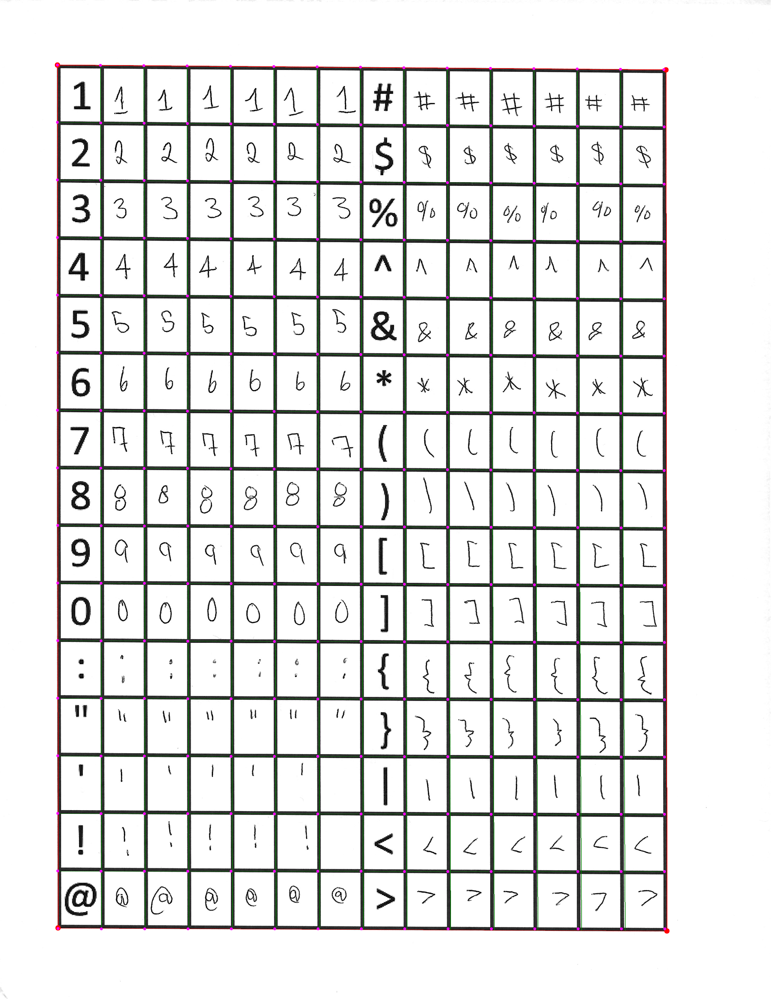

First three cells: 


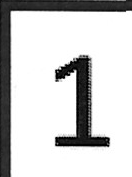

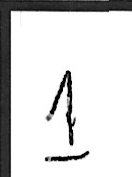

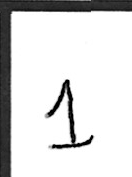

In [69]:
# import the image
img, cfg = importImage(os.path.join(os.getcwd(), 'Training Data/Raw/Raw1-9_19.jpg'))

#detect corners
#detectCorners(img)

# calculate cell bounds
cells = generateCells(cfg)

# debug configuration
print("Debug image: ")
debugCells(img, cfg, cells)

# cut up the cells
cellImages = cutCellImages(img, cfg, cells)

# debug first three cells
print("First three cells: ")
display(cellImages[0])
display(cellImages[1])
display(cellImages[2])

charIndex = -1

# trim, resize and save all cells
for i in range(0, len(cellImages)):
    #Skip predefined chars
    if i % 7 == 0:
        charIndex += 1
        continue
    
    cellImages[i] = trimImageEdgeReplacement(cellImages[i], cfg.line_width * 2)
    cellImages[i] = resizeImage(cellImages[i], cfg, cfg.resize_iters)
    saveImage(cellImages[i], cfg.charSet[charIndex])
    



## Where are we at?

The next steps are clear.
First, we will be handing out our sampling sheets to as many people as we can. While people are filling these out, we will be improving the Data Processor.

There is also the potential for augmentation of these images. Shifting the position of the letters in the boxes, changing brightness of the image and potentially doing a bit of shallow 3d projection in order to account for letters observed at different angles (since the end goal is to use the portenta camera for this).

### Leftover code I'm hesitant to delete yet

In [ ]:
cell_init_width = 44
cell_init_height = 60

cell_count_x = 14
cell_count_y = 15

target_width = 13
target_height = 18

x1, y1 = 84, 84 # Top Left Corner
x2, y2 = 1292, 84 # Top Right Corner
x3, y3 = 91, 1838 # Bottom Left Corner
x4, y4 = 1292, 1822 # Bottom Right Corner

line_width = 4

#Debug Config
debugImg = drawConfigDebug(configTestImg, x1, y1, x2, y2, x3, y3, x4, y4, cell_count_x, cell_count_y, line_width)
display(debugImg)

#Create Vectors
v3 = vectorNormalize((x3-x1, y3-y1)) # Vector from top left to bottom left
v4 = vectorNormalize((x4-x2, y4-y2)) # Vector from top right to bottom right

#Create Position Sets
v3set = vectorRange((x1, y1), v3, cell_count_y + 1, int(y3-y1+(y3-y1)/cell_count_y)) #Set of positions from top left to bottom left
v4set = vectorRange((x2, y2), v4, cell_count_y + 1, int(y4-y2+(y4-y2)/cell_count_y)) #Set of positions from top right to bottom right

cells = []
for y in range(0, cell_count_y):
    row = []
    
    v1 = vectorNormalize(sub(v4set[y], v3set[y]))
    v2 = vectorNormalize(sub(v4set[y+1], v3set[y+1]))
    
    d1 = distance(v3set[y], v4set[y])
    d2 = distance(v3set[y+1], v4set[y+1])
    
    v1set = vectorRange(v3set[y], v1, cell_count_x + 1, int(d1 + d1/cell_count_x))
    v2set = vectorRange(v3set[y + 1], v2, cell_count_x + 1, int(d2 + d2/cell_count_x))
    
    for x in range(0, cell_count_x):
        row.append([v1set[x],v1set[x+1],v2set[x],v2set[x+1]])
        
    cells.append(row)

#Debug
debugImg = drawConfigDebug(im, x1, y1, x2, y2, x3, y3, x4, y4, cell_count_x, cell_count_y, line_width)
debugImg = drawCellsDebug(debugImg, cells)
display(debugImg)